In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import dask.dataframe as ddf
from pandas import Series, DataFrame
%matplotlib inline

In [2]:
import seaborn as sn
import plotly.express as px

In [3]:
suicide = pd.read_csv('suicide_all_types_2018.csv', dtype = {'fips': str})
suicide['year'] = '2018'
suicide = suicide.loc[:, ~suicide.columns.str.contains('^Unnamed')]

In [4]:
suicide.head()

,County,fips,Deaths,Population,SuicideDeathRate,Suicide Type,year
0,"Autauga County, AL",01001,53.0,277263,19.115425,Overall,2018
1,"Baldwin County, AL",01003,208.0,1043033,19.941843,Overall,2018
2,"Barbour County, AL",01005,18.0,129492,13.900473,Overall,2018
3,"Bibb County, AL",01007,23.0,112800,20.390071,Overall,2018
4,"Blount County, AL",01009,50.0,288949,17.304092,Overall,2018


### uploading social economic data

In [5]:
ur_files = ddf.read_csv('Social_Economic_Factors/Social_Economic_2018.csv', dtype = {'fips': str, 'per_capita_income': float})
social = ur_files.compute()
social = social.loc[:, ~social.columns.str.contains('^Unnamed')]

In [6]:
social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,year
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,24.978261,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,2018
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,16.981168,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,2018
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,53.851524,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,2018
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,25.418387,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,2018
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,12.859745,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,2018


In [7]:
social['year'] = social['year'].astype(str)

In [8]:
ur_files = ddf.read_csv('county_altitude.csv', dtype = {'FIPSCODE': str})
altitude = ur_files.compute()
altitude = altitude.rename(columns = {'FIPSCODE': 'fips', 'elevation': 'altitude'})
altitude = altitude[['fips', 'altitude']]
altitude.head()

,fips,altitude
0,19107,207.03
1,19189,390.25
2,19029,385.95
3,19015,268.98
4,19059,425.89


In [9]:
social = social.merge(altitude, on = 'fips', how = 'left')
social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,year,altitude
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,2018,128.66
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,2018,30.30
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,2018,122.81
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,2018,74.90
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,2018,184.46


In [10]:
social_r1 = social[social['rurality'] == 1]
social_r6 = social[social['rurality'] == 6]
social_r2 = social[social['rurality'] == 2]

In [11]:
social_r2.shape

(368, 22)

In [12]:
frames = [social_r1, social_r2]
social_3 = pd.concat(frames)
social_3.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,year,altitude
36,01073,30657.0,17.004777,10.706390,3.267514,7.657785,22.833408,1.502736,13.830147,15.024580,...,28.678952,2.425852,37.673537,23.442472,12.659496,12.631309,13.259897,1.0,2018,174.62
103,04013,31697.0,14.731785,13.383006,3.902526,6.151435,19.335672,4.559015,14.862401,14.463789,...,19.786304,1.254774,25.009853,23.888053,13.099210,12.737426,11.310669,1.0,2018,268.85
186,06001,44283.0,10.566495,13.053051,1.101146,9.568663,19.043425,7.709603,21.497586,13.136035,...,16.752705,1.964349,20.087383,25.226623,14.878445,13.658636,12.140658,1.0,2018,116.61
204,06037,32469.0,15.982993,22.913206,1.551786,9.024627,21.451340,11.442030,26.783031,12.866610,...,17.642028,1.757567,25.512915,25.905759,13.739818,13.565369,11.675371,1.0,2018,1353.19
215,06059,39590.0,11.496694,15.987408,2.624082,4.395698,18.595147,8.864335,18.872231,13.921070,...,14.884716,1.371444,18.561345,23.848281,13.144598,14.335711,12.274136,1.0,2018,59.01


In [13]:
r3 = social_3.groupby('fips').mean()
r3 = r3.reset_index()
r3.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude
0,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,25.418387,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90
1,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,12.859745,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46
2,01021,24611.0,18.571429,18.880274,35.669814,4.913140,26.752922,2.704316,0.730113,15.768268,...,19.861143,32.346565,0.917369,27.616006,21.213294,12.765764,12.875028,13.141361,2.0,188.69
3,01073,30657.0,17.004777,10.706390,3.267514,7.657785,22.833408,1.502736,13.830147,15.024580,...,49.861189,28.678952,2.425852,37.673537,23.442472,12.659496,12.631309,13.259897,1.0,174.62
4,01115,24861.0,13.203811,15.705625,23.178154,3.043019,21.368626,0.860997,1.689964,15.910705,...,13.970403,30.319787,2.519873,19.194953,20.506036,13.041486,14.286532,13.349598,2.0,321.96


In [14]:
r3.describe()

,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,percent_limited_english_abilities,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude
count,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,431.000000
mean,33636.763761,11.634058,11.492333,6.835381,6.460913,19.499424,2.386687,9.397362,15.196540,12.429870,29.262953,22.821272,2.311574,23.485139,21.697032,12.723338,14.044537,13.395343,1.844037,241.359443
std,8642.409485,4.752025,4.729373,8.017993,6.660861,4.125576,1.723682,9.848758,3.202942,11.691813,19.935497,5.908730,2.824864,8.468035,3.899192,1.457952,1.273657,1.782308,0.363237,348.947643
min,18363.000000,2.686525,1.449582,0.000000,1.365691,10.629934,0.000000,0.000000,8.128844,0.693146,2.849346,10.186360,0.000000,9.664359,13.120975,5.747904,7.445226,8.908238,1.000000,0.080000
25%,27520.250000,8.170988,8.060094,1.272334,3.615684,16.691332,1.342953,2.774949,12.979042,3.682701,12.627127,18.178182,0.939003,17.437815,19.255261,11.822135,13.351647,12.145702,2.000000,67.485000
50%,31995.000000,10.882683,10.853257,3.613738,4.771020,19.226132,1.879425,6.409412,15.011564,8.514050,25.558104,22.389174,1.481990,21.790125,20.981869,12.632322,14.091257,13.310900,2.000000,195.950000
75%,38255.250000,14.733305,14.235428,9.598415,6.936820,21.768516,2.854879,13.116881,16.865319,17.175392,42.630492,26.767770,2.619004,28.059043,23.096834,13.552276,14.807956,14.365426,2.000000,273.665000
max,72832.000000,29.051310,30.735931,36.696592,77.009839,46.170096,12.349718,89.422548,29.797635,70.101513,90.689435,44.185211,31.551454,61.405836,51.737896,18.534981,18.039107,22.309108,2.000000,2916.460000


In [15]:
social_3.describe()

,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,percent_limited_english_abilities,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude
count,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,436.000000,431.000000
mean,33636.763761,11.634058,11.492333,6.835381,6.460913,19.499424,2.386687,9.397362,15.196540,12.429870,29.262953,22.821272,2.311574,23.485139,21.697032,12.723338,14.044537,13.395343,1.844037,241.359443
std,8642.409485,4.752025,4.729373,8.017993,6.660861,4.125576,1.723682,9.848758,3.202942,11.691813,19.935497,5.908730,2.824864,8.468035,3.899192,1.457952,1.273657,1.782308,0.363237,348.947643
min,18363.000000,2.686525,1.449582,0.000000,1.365691,10.629934,0.000000,0.000000,8.128844,0.693146,2.849346,10.186360,0.000000,9.664359,13.120975,5.747904,7.445226,8.908238,1.000000,0.080000
25%,27520.250000,8.170988,8.060094,1.272334,3.615684,16.691332,1.342953,2.774949,12.979042,3.682701,12.627127,18.178182,0.939003,17.437815,19.255261,11.822135,13.351647,12.145702,2.000000,67.485000
50%,31995.000000,10.882683,10.853257,3.613738,4.771020,19.226132,1.879425,6.409412,15.011564,8.514050,25.558104,22.389174,1.481990,21.790125,20.981869,12.632322,14.091257,13.310900,2.000000,195.950000
75%,38255.250000,14.733305,14.235428,9.598415,6.936820,21.768516,2.854879,13.116881,16.865319,17.175392,42.630492,26.767770,2.619004,28.059043,23.096834,13.552276,14.807956,14.365426,2.000000,273.665000
max,72832.000000,29.051310,30.735931,36.696592,77.009839,46.170096,12.349718,89.422548,29.797635,70.101513,90.689435,44.185211,31.551454,61.405836,51.737896,18.534981,18.039107,22.309108,2.000000,2916.460000


In [16]:
social_3.columns

Index(['fips', 'per_capita_income', 'percent_below_poverty',
       'percent_no_highschool_diploma', 'percent_mobile_homes',
       'percent_no_vehicle', 'percent_unemployed_CDC', 'percent_overcrowding',
       'percent_multi_unit_housing', 'percent_age_65_and_older',
       'percent_limited_english_abilities', 'percent_minorities',
       'percent_disabled', 'percent_institutionalized_in_group_quarters',
       'percent_single_parent_households_CDC', 'percent_age_18_to_34',
       'percent_age_35_to_44', 'percent_age_45_to_54', 'percent_age_55_to_64',
       'rurality', 'year', 'altitude'],
      dtype='object')

In [17]:
social_r6.describe()

,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,percent_limited_english_abilities,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude
count,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.000000,1335.0,1323.000000
mean,25047.875655,16.639701,15.136091,14.805733,6.371599,23.373419,2.447229,2.280963,20.452521,7.480911,21.139868,30.910116,3.917381,23.956167,18.814001,11.084232,12.670136,14.948946,6.0,514.547256
std,5226.828828,7.178879,7.047121,10.469559,5.133235,7.453156,3.073478,2.382426,4.557297,10.465306,20.782460,8.788122,5.511458,11.306346,3.667161,1.646841,1.530636,2.265784,0.0,525.073464
min,10148.000000,2.303105,1.183432,0.180478,0.000000,7.092199,0.000000,0.000000,5.562332,0.000000,0.000000,9.458018,0.000000,0.000000,7.290195,4.542897,0.000000,7.144866,6.0,0.530000
25%,21529.500000,11.437264,9.605210,6.482875,4.018907,17.808572,1.035462,0.874839,17.618065,2.079054,5.652443,24.350326,1.243560,16.700203,16.759706,10.136776,11.859454,13.671359,6.0,174.540000
50%,24661.000000,15.627052,13.947537,12.590016,5.521049,23.192020,1.882845,1.646761,20.175508,3.653659,11.708968,30.123239,1.928273,22.045478,18.439052,11.081458,12.805149,14.769737,6.0,338.890000
75%,28258.500000,20.545768,19.933463,20.957567,7.595288,28.191778,2.933210,3.013513,23.075656,7.722821,33.395649,36.702051,3.907340,28.494040,20.444311,12.002002,13.555700,16.023429,6.0,647.525000
max,51270.000000,55.096502,49.261191,53.587455,87.765957,58.916051,49.349882,25.431413,38.541961,82.635635,96.364967,65.131587,55.747517,74.890351,57.594937,18.882175,24.145985,29.251701,6.0,3589.700000


In [18]:
social_r6 = social_r6.drop(['rurality', 'year'], axis = 1)
social_3 = social_3.drop(['rurality', 'year'], axis = 1)

In [19]:
social_r6 = social_r6.merge(suicide[['fips', 'SuicideDeathRate', 'Suicide Type']], on = 'fips', how = 'left')
social_r6.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,altitude,SuicideDeathRate,Suicide Type
0,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,122.81,13.900473,Overall
1,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,122.81,11.583727,Firearm
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,122.81,2.316745,Nonfirearm
3,01011,20346.0,31.385609,25.774212,37.431969,11.720698,28.515032,0.000000,1.679187,15.610510,...,27.390795,4.153787,74.789916,21.425811,15.446291,12.770479,13.977975,152.49,NaN,NaN
4,01013,20430.0,23.544933,16.172235,24.783028,7.751938,26.776050,1.774001,1.336525,19.006242,...,31.759472,1.607990,47.043364,19.950062,11.990012,12.119850,14.132335,109.11,10.004702,Overall


In [20]:
social_3 = social_3.merge(suicide[['fips', 'SuicideDeathRate', 'Suicide Type']], on = 'fips', how = 'left')
social_3.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,altitude,SuicideDeathRate,Suicide Type
0,01073,30657.0,17.004777,10.706390,3.267514,7.657785,22.833408,1.502736,13.830147,15.024580,...,28.678952,2.425852,37.673537,23.442472,12.659496,12.631309,13.259897,174.62,13.548829,Overall
1,01073,30657.0,17.004777,10.706390,3.267514,7.657785,22.833408,1.502736,13.830147,15.024580,...,28.678952,2.425852,37.673537,23.442472,12.659496,12.631309,13.259897,174.62,8.820379,Firearm
2,01073,30657.0,17.004777,10.706390,3.267514,7.657785,22.833408,1.502736,13.830147,15.024580,...,28.678952,2.425852,37.673537,23.442472,12.659496,12.631309,13.259897,174.62,4.728451,Nonfirearm
3,04013,31697.0,14.731785,13.383006,3.902526,6.151435,19.335672,4.559015,14.862401,14.463789,...,19.786304,1.254774,25.009853,23.888053,13.099210,12.737426,11.310669,268.85,16.181190,Overall
4,04013,31697.0,14.731785,13.383006,3.902526,6.151435,19.335672,4.559015,14.862401,14.463789,...,19.786304,1.254774,25.009853,23.888053,13.099210,12.737426,11.310669,268.85,9.186467,Firearm


In [21]:
social_r6.describe()

,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,percent_limited_english_abilities,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,altitude,SuicideDeathRate
count,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2247.000000,2231.000000,1626.000000
mean,24694.898086,17.134009,15.557169,15.923150,6.529754,24.110005,2.492345,2.223135,20.333100,6.828967,20.008239,32.191314,3.634852,24.397460,18.859094,11.179071,12.848546,14.915343,482.885728,16.192302
std,4882.656310,6.675749,6.702984,10.241687,5.147880,6.721502,3.007334,2.241444,4.381904,9.407968,19.480529,8.792838,4.820747,10.330304,3.341933,1.478554,1.385496,2.098196,529.274335,9.536962
min,10148.000000,2.303105,1.183432,0.180478,0.000000,7.092199,0.000000,0.000000,5.562332,0.000000,0.000000,9.458018,0.000000,0.000000,7.290195,4.542897,0.000000,7.144866,0.530000,0.000000
25%,21278.000000,12.316309,10.320919,7.771713,4.279370,19.192901,1.190739,0.944334,17.572286,2.048481,5.601276,25.798628,1.235582,17.767384,16.987308,10.298705,12.075265,13.713432,152.730000,9.629294
50%,24150.000000,16.289641,14.830408,14.150943,5.787974,24.215719,1.996506,1.653652,19.920910,3.606329,11.299435,31.655346,1.849112,22.741117,18.577826,11.215761,12.992964,14.731635,299.920000,14.951710
75%,27699.500000,20.900699,20.148583,22.237118,7.707091,28.505599,2.959356,2.836852,22.784298,6.996185,31.095580,37.766571,3.771110,28.591943,20.407816,12.015190,13.674594,15.948859,569.090000,21.221030
max,51270.000000,55.096502,49.261191,53.587455,87.765957,58.916051,49.349882,25.431413,38.541961,82.635635,96.364967,65.131587,55.747517,74.890351,57.594937,18.882175,24.145985,29.251701,3589.700000,97.560976


In [22]:
social_3.describe()

,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,percent_limited_english_abilities,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,altitude,SuicideDeathRate
count,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1211.000000,1207.000000
mean,33896.946982,11.496277,11.333977,6.394304,6.531121,19.307456,2.401930,9.719288,15.040901,12.870710,29.759644,22.587637,2.217334,23.485661,21.785502,12.771369,14.041653,13.308962,236.530751,9.979053
std,8489.014970,4.636461,4.547149,7.625505,6.845398,3.832590,1.724781,9.867039,3.096220,11.764755,19.848759,5.738561,2.327700,8.311428,3.710219,1.384703,1.233828,1.702887,323.294857,5.287962
min,18363.000000,2.686525,1.449582,0.000000,1.365691,10.629934,0.000000,0.000000,8.128844,0.693146,2.849346,10.186360,0.000000,9.664359,13.120975,5.747904,7.445226,8.908238,0.080000,0.474571
25%,28085.000000,8.095655,7.964232,1.235655,3.591044,16.613773,1.345384,3.160454,12.896820,4.024146,13.200973,18.075619,0.941972,17.527866,19.452696,11.856394,13.337380,12.117622,67.430000,6.096870
50%,32298.000000,10.782846,10.762938,3.331662,4.766797,19.090177,1.885317,7.287729,14.921535,8.792195,26.563141,22.103612,1.482532,21.810499,21.069239,12.657418,14.089643,13.284254,195.950000,8.749672
75%,38534.750000,14.529594,14.015659,8.513583,7.024060,21.493976,2.824556,13.511085,16.703952,18.015065,42.749831,26.558165,2.622801,28.007511,23.273504,13.621946,14.786338,14.305759,275.555000,13.114454
max,72832.000000,29.051310,30.735931,36.696592,77.009839,46.170096,12.349718,89.422548,29.797635,70.101513,90.689435,44.185211,31.551454,61.405836,51.737896,18.534981,18.039107,22.309108,2916.460000,37.001919


In [23]:
social_r1.columns

Index(['fips', 'per_capita_income', 'percent_below_poverty',
       'percent_no_highschool_diploma', 'percent_mobile_homes',
       'percent_no_vehicle', 'percent_unemployed_CDC', 'percent_overcrowding',
       'percent_multi_unit_housing', 'percent_age_65_and_older',
       'percent_limited_english_abilities', 'percent_minorities',
       'percent_disabled', 'percent_institutionalized_in_group_quarters',
       'percent_single_parent_households_CDC', 'percent_age_18_to_34',
       'percent_age_35_to_44', 'percent_age_45_to_54', 'percent_age_55_to_64',
       'rurality', 'year', 'altitude'],
      dtype='object')

In [24]:
social_3.shape

(1226, 22)

In [25]:
social_r6.shape[0]

2247

In [26]:
social_r6 = social_r6[social_r6['Suicide Type'] == 'Overall']
social_3 = social_3[social_3['Suicide Type']  == 'Overall']

In [27]:
social_r1 = social_r1.dropna()
social_r6 = social_r6.dropna()

In [28]:
social_3.describe()

,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,percent_limited_english_abilities,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,altitude,SuicideDeathRate
count,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,417.000000,412.000000,417.000000
mean,33880.755396,11.558441,11.350181,6.520838,6.505919,19.363398,2.410947,9.611792,15.084386,12.741080,29.471952,22.628676,2.232229,23.419709,21.757216,12.745596,14.047840,13.339828,238.158519,14.898270
std,8604.073368,4.684075,4.523714,7.652385,6.796451,3.763508,1.740164,9.926620,3.106835,11.707126,19.681502,5.796513,2.123762,8.281491,3.599893,1.358448,1.213934,1.700549,330.392870,4.895314
min,19999.000000,2.686525,1.449582,0.000000,1.365691,10.629934,0.419373,0.000000,8.637052,1.135137,2.849346,10.186360,0.173674,9.664359,13.120975,8.947249,10.349278,9.043492,0.080000,5.274680
25%,27855.000000,8.151701,7.988055,1.239407,3.591044,16.621676,1.341243,2.958867,12.967174,3.914648,13.186412,18.142860,0.944315,17.443232,19.422200,11.845083,13.337380,12.139274,68.342500,11.607633
50%,32227.000000,10.838696,10.766014,3.398361,4.774998,19.185131,1.916995,7.111851,14.981906,8.733573,25.993407,22.143967,1.487908,21.769752,21.074427,12.645654,14.088857,13.292990,194.155000,14.144392
75%,38580.000000,14.548740,14.117204,8.875547,6.964861,21.607817,2.848608,13.328237,16.739536,17.616940,42.668116,26.579186,2.645188,28.007511,23.129728,13.567326,14.781403,14.321485,273.562500,17.878117
max,72832.000000,29.051310,29.851851,36.696592,77.009839,31.468230,12.349718,89.422548,29.797635,70.101513,90.689435,44.185211,14.089832,57.136518,37.316362,18.347018,18.039107,22.309108,2909.230000,37.001919


In [29]:
social_3['SuicidePercentile'] = ((social_3['SuicideDeathRate']- social_3['SuicideDeathRate'].min())/(social_3['SuicideDeathRate'].max()- social_3['SuicideDeathRate'].min()))*100

In [30]:
social_r6['SuicidePercentile'] = ((social_r6['SuicideDeathRate']- social_r6['SuicideDeathRate'].min())/(social_r6['SuicideDeathRate'].max() - social_r6['SuicideDeathRate'].min()))*100

In [31]:
suicide_r3 = social_3.drop(['SuicideDeathRate', 'Suicide Type'], axis = 1)
suicide_r6 = social_r6.drop(['SuicideDeathRate', 'Suicide Type'], axis = 1)

In [32]:
suicide_r3.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,altitude,SuicidePercentile
0,01073,30657.0,17.004777,10.706390,3.267514,7.657785,22.833408,1.502736,13.830147,15.024580,...,49.861189,28.678952,2.425852,37.673537,23.442472,12.659496,12.631309,13.259897,174.62,26.079008
3,04013,31697.0,14.731785,13.383006,3.902526,6.151435,19.335672,4.559015,14.862401,14.463789,...,44.313013,19.786304,1.254774,25.009853,23.888053,13.099210,12.737426,11.310669,268.85,34.375856
6,06001,44283.0,10.566495,13.053051,1.101146,9.568663,19.043425,7.709603,21.497586,13.136035,...,68.157754,16.752705,1.964349,20.087383,25.226623,14.878445,13.658636,12.140658,116.61,13.373409
9,06037,32469.0,15.982993,22.913206,1.551786,9.024627,21.451340,11.442030,26.783031,12.866610,...,73.667674,17.642028,1.757567,25.512915,25.905759,13.739818,13.565369,11.675371,1353.19,10.246698
12,06059,39590.0,11.496694,15.987408,2.624082,4.395698,18.595147,8.864335,18.872231,13.921070,...,59.040409,14.884716,1.371444,18.561345,23.848281,13.144598,14.335711,12.274136,59.01,16.653482


In [33]:
suicide_r6.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,altitude,SuicidePercentile
0,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,53.851524,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,122.81,7.791924
4,01013,20430.0,23.544933,16.172235,24.783028,7.751938,26.776050,1.774001,1.336525,19.006242,...,48.144819,31.759472,1.607990,47.043364,19.950062,11.990012,12.119850,14.132335,109.11,3.498124
5,01019,23356.0,15.007255,20.569807,25.446655,4.101452,26.241135,1.461437,2.002299,21.742158,...,8.211813,36.706357,1.059838,20.071888,17.108266,11.283023,14.087340,15.332843,171.95,18.002162
9,01025,21111.0,25.405834,19.229401,30.724722,10.226544,34.969710,1.784569,1.750255,18.969123,...,47.123467,29.747363,1.492599,34.015250,19.358675,11.977693,13.601509,13.995161,84.90,5.117539
10,01027,23147.0,18.443252,25.277329,22.394881,4.163484,23.409637,0.916730,0.411644,19.823591,...,19.718942,27.044360,1.868740,25.363604,18.448199,12.363582,13.634325,14.658394,324.29,17.058246


In [34]:
suicide_r3 = suicide_r3.dropna()
suicide_r6 = suicide_r6.dropna()

In [35]:
import xgboost
import shap
import copy 

In [36]:
def compare2(df, suicide_types, rurality):
    for suicide_type in suicide_types:
        df_type = df[df['Suicide Type'] == suicide_type]
        X = df_type.iloc[:, 1:-2]
        y = df_type.iloc[:, -2].array
        model = xgboost.XGBRegressor().fit(X, y)
        explainer = shap.Explainer(model)
        shap_values = explainer(X)
        print('Bar graph to show ' + ' in ' + rurality + ' for ' + suicide_type)
        shap.plots.bar(shap_values, max_display = 20)

In [37]:
suicide_types = ['overall', 'firearm', 'nonfirearm']

In [38]:
social_3.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,altitude,SuicideDeathRate,Suicide Type,SuicidePercentile
0,01073,30657.0,17.004777,10.706390,3.267514,7.657785,22.833408,1.502736,13.830147,15.024580,...,2.425852,37.673537,23.442472,12.659496,12.631309,13.259897,174.62,13.548829,Overall,26.079008
3,04013,31697.0,14.731785,13.383006,3.902526,6.151435,19.335672,4.559015,14.862401,14.463789,...,1.254774,25.009853,23.888053,13.099210,12.737426,11.310669,268.85,16.181190,Overall,34.375856
6,06001,44283.0,10.566495,13.053051,1.101146,9.568663,19.043425,7.709603,21.497586,13.136035,...,1.964349,20.087383,25.226623,14.878445,13.658636,12.140658,116.61,9.517694,Overall,13.373409
9,06037,32469.0,15.982993,22.913206,1.551786,9.024627,21.451340,11.442030,26.783031,12.866610,...,1.757567,25.512915,25.905759,13.739818,13.565369,11.675371,1353.19,8.525674,Overall,10.246698
12,06059,39590.0,11.496694,15.987408,2.624082,4.395698,18.595147,8.864335,18.872231,13.921070,...,1.371444,18.561345,23.848281,13.144598,14.335711,12.274136,59.01,10.558370,Overall,16.653482


In [39]:
def plotSHAP(df, rurality_type):
    X = df.iloc[:, 1:-1]
    y = df.iloc[:, -1].array
    model = xgboost.XGBRegressor().fit(X, y)
    explainer = shap.Explainer(model)
    shap_values = explainer(X)
    print()
    print('Bar graph to show socioeconomic factors in '+ rurality_type + ' for Ovearll')
    shap.plots.bar(shap_values,  max_display = 20)
    print()
    print('Beeswarm graph to show show socioeconomic factors in '+ rurality_type + ' for Ovearll')
    shap.plots.beeswarm(copy.deepcopy(shap_values), max_display = 20)
    print()

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



Bar graph to show socioeconomic factors in rurality code 1+2 for Ovearll


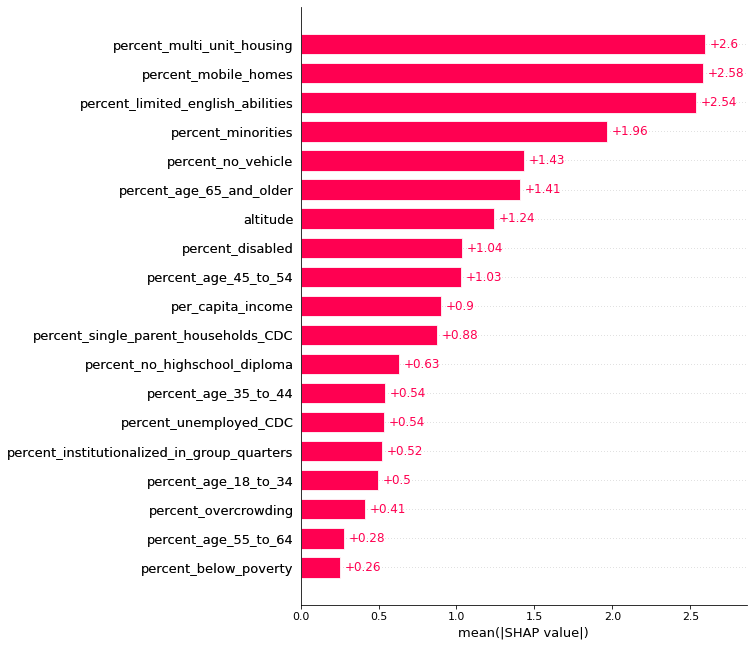


Beeswarm graph to show show socioeconomic factors in rurality code 1+2 for Ovearll


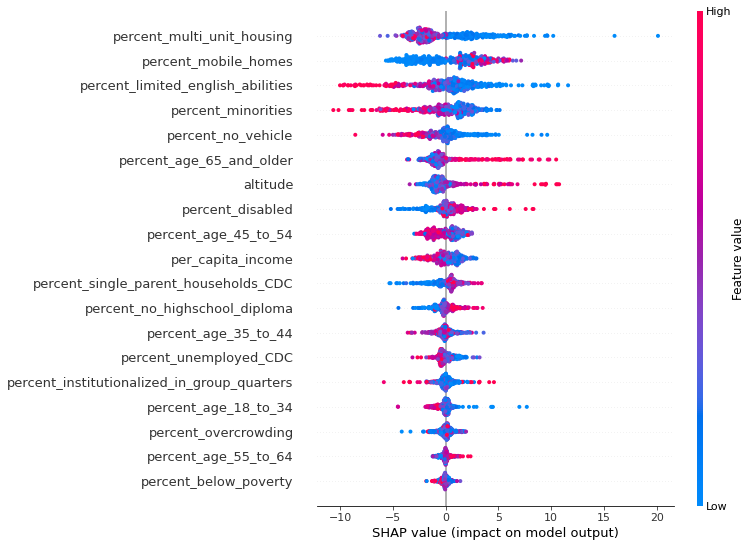

In [40]:
plotSHAP(suicide_r3, 'rurality code 1+2')


Bar graph to show socioeconomic factors in rurality code 6 for Ovearll


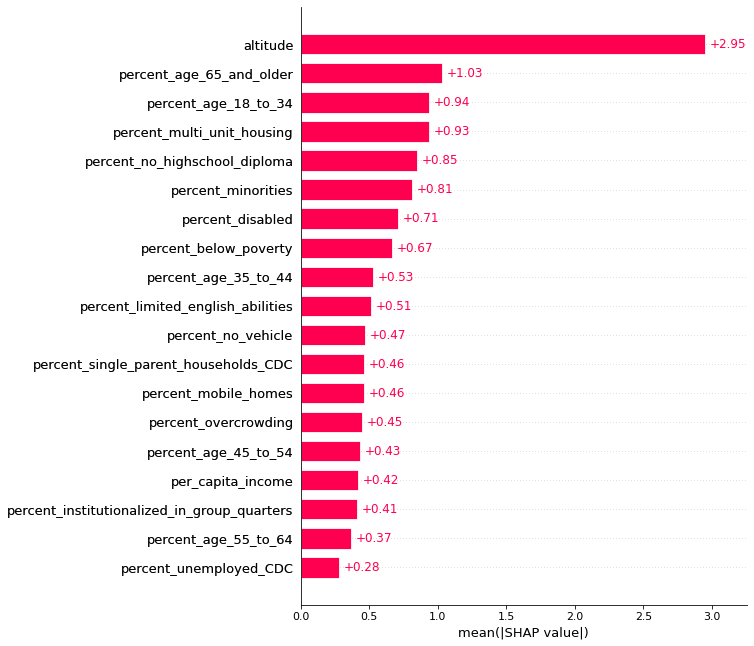


Beeswarm graph to show show socioeconomic factors in rurality code 6 for Ovearll


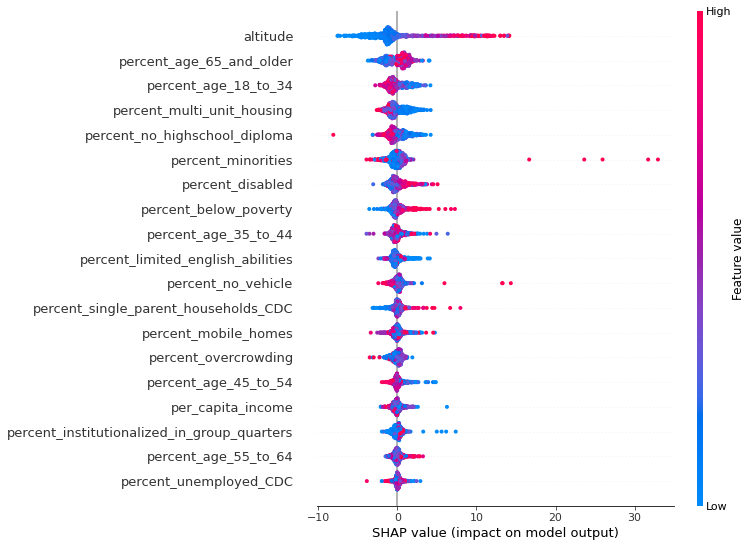

In [41]:
plotSHAP(suicide_r6, 'rurality code 6')

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



Bar graph to show socioeconomic factors in rurality code 6 for Ovearll


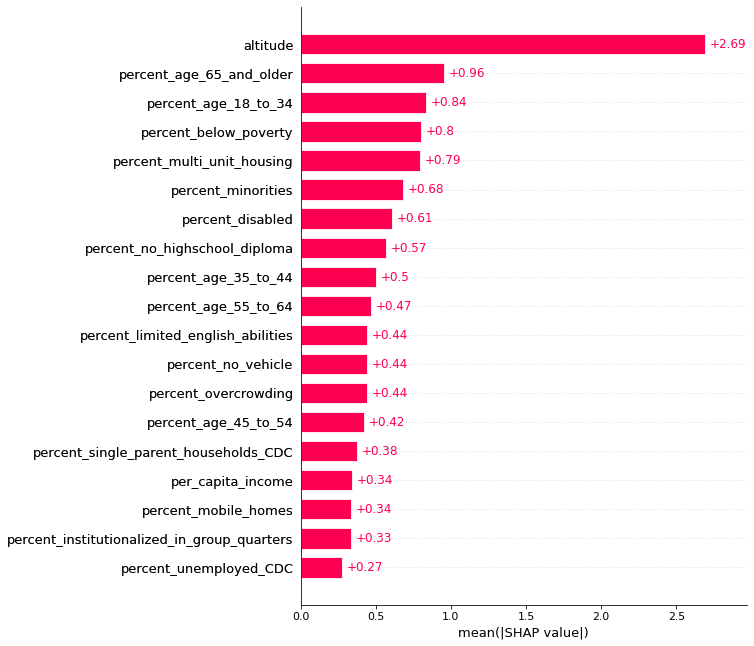


Beeswarm graph to show show socioeconomic factors in rurality code 6 for Ovearll


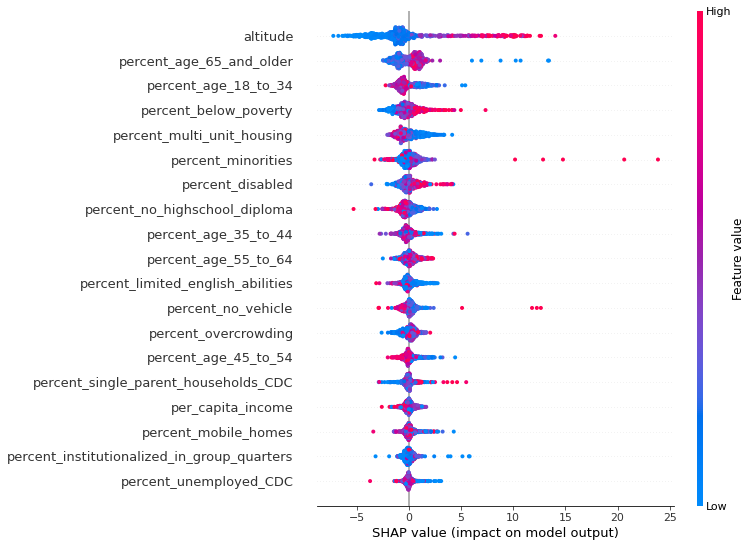

In [28]:
plotSHAP(social_r6, 'rurality code 6')


Bar graph to show socioeconomic factors in rurality code 1+2 for Ovearll


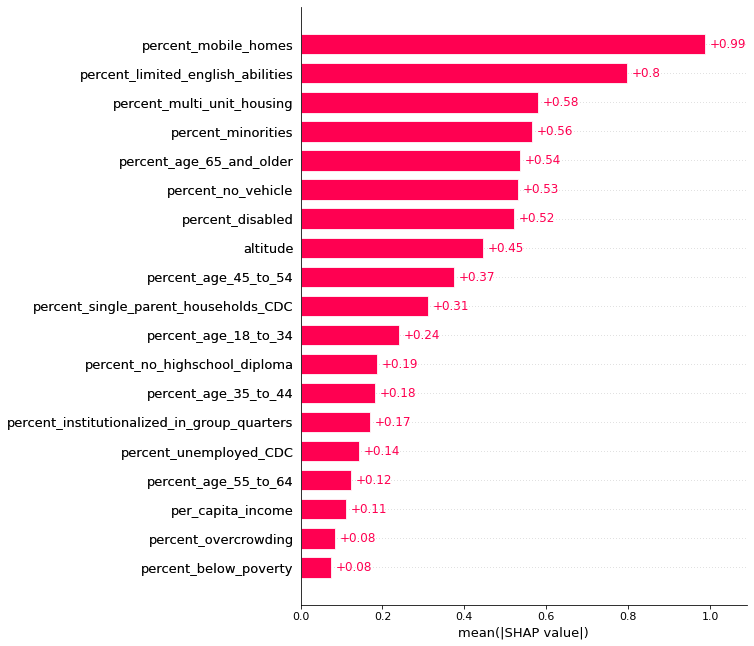


Beeswarm graph to show show socioeconomic factors in rurality code 1+2 for Ovearll


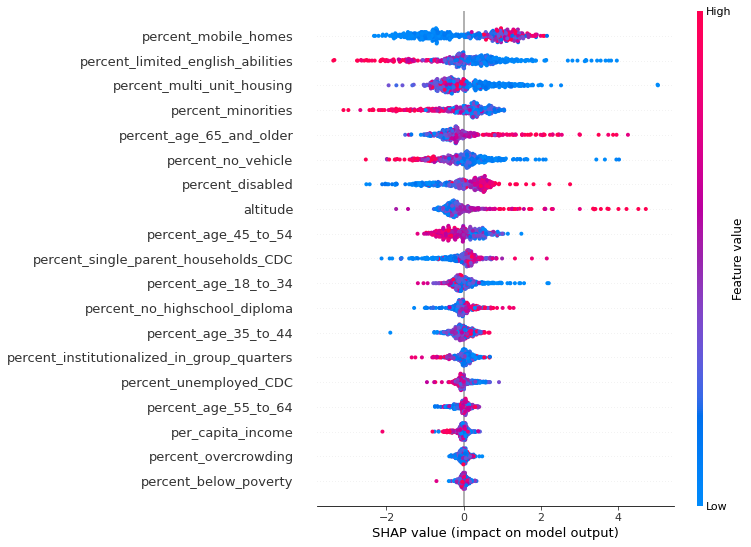

In [29]:
plotSHAP(social_3, 'rurality code 1+2')

In [10]:
social_suicide = social.merge(suicide[['fips', 'SuicideDeathRate', 'Suicide Type', 'year']], on = ['fips', 'year'], how = 'left')
social_suicide.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,year,SuicideDeathRate,Suicide Type
0,01001,24571.0,12.133385,15.424697,19.886218,4.708286,20.360629,2.147377,3.29883,12.648660,...,0.759466,26.416406,20.687708,14.560985,15.069117,10.821935,3.0,2013,19.291458,Overall
1,01001,24571.0,12.133385,15.424697,19.886218,4.708286,20.360629,2.147377,3.29883,12.648660,...,0.759466,26.416406,20.687708,14.560985,15.069117,10.821935,3.0,2013,14.195601,Firearm
2,01001,24571.0,12.133385,15.424697,19.886218,4.708286,20.360629,2.147377,3.29883,12.648660,...,0.759466,26.416406,20.687708,14.560985,15.069117,10.821935,3.0,2013,5.095857,Nonfirearm
3,01003,26766.0,13.940723,11.238400,14.265596,3.049821,23.118885,1.891298,17.10305,17.292667,...,1.333412,23.555660,19.156236,12.722725,14.430775,13.602937,4.0,2013,19.792066,Overall
4,01003,26766.0,13.940723,11.238400,14.265596,3.049821,23.118885,1.891298,17.10305,17.292667,...,1.333412,23.555660,19.156236,12.722725,14.430775,13.602937,4.0,2013,13.907938,Firearm


In [11]:
social_suicide = social_suicide.drop(['year'], axis = 1)

## Preparing data frames

In [12]:
social_r1 = social_suicide[social_suicide['rurality'] == 1]
social_r2 = social_suicide[social_suicide['rurality'] == 2]
social_r3 = social_suicide[social_suicide['rurality'] == 3]
social_r4 = social_suicide[social_suicide['rurality'] == 4]
social_r5 = social_suicide[social_suicide['rurality'] == 5]
social_r6 = social_suicide[social_suicide['rurality'] == 6]

In [13]:
overall_r1 = social_r1[social_r1['Suicide Type'] == 'Overall']
firearm_r1 = social_r1[social_r1['Suicide Type'] == 'Firearm']
nonfirearm_r1 = social_r1[social_r1['Suicide Type'] == 'Nonfirearm']

In [14]:
overall_r2 = social_r2[social_r2['Suicide Type'] == 'Overall']
firearm_r2 = social_r2[social_r2['Suicide Type'] == 'Firearm']
nonfirearm_r2 = social_r2[social_r2['Suicide Type'] == 'Nonfirearm']

In [15]:
overall_r3 = social_r3[social_r3['Suicide Type'] == 'Overall']
firearm_r3 = social_r3[social_r3['Suicide Type'] == 'Firearm']
nonfirearm_r3 = social_r3[social_r3['Suicide Type'] == 'Nonfirearm']

In [16]:
overall_r4 = social_r4[social_r4['Suicide Type'] == 'Overall']
firearm_r4 = social_r4[social_r4['Suicide Type'] == 'Firearm']
nonfirearm_r4 = social_r4[social_r4['Suicide Type'] == 'Nonfirearm']

In [17]:
overall_r5 = social_r5[social_r5['Suicide Type'] == 'Overall']
firearm_r5 = social_r5[social_r5['Suicide Type'] == 'Firearm']
nonfirearm_r5 = social_r5[social_r5['Suicide Type'] == 'Nonfirearm']

In [18]:
overall_r6 = social_r6[social_r6['Suicide Type'] == 'Overall']
firearm_r6 = social_r6[social_r6['Suicide Type'] == 'Firearm']
nonfirearm_r6 = social_r6[social_r6['Suicide Type'] == 'Nonfirearm']

In [19]:
overall_r6.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,SuicideDeathRate,Suicide Type
6,01005,16829.0,26.656842,27.733305,24.969330,9.500000,33.466066,1.989130,1.340119,15.021412,...,37.434863,10.493759,50.824970,22.802972,13.432890,14.172248,13.015629,6.0,11.720753,Overall
14,01013,17403.0,28.439193,24.517045,25.847000,10.248937,30.711703,0.886460,1.903132,17.193561,...,38.112473,1.250970,49.068577,20.068852,11.375097,13.809154,13.867339,6.0,18.440157,Overall
23,01019,22030.0,21.196227,22.543537,24.923822,3.526081,27.513896,2.024708,1.217553,18.594914,...,40.473388,1.674733,27.993955,17.277406,12.161020,15.464393,15.986787,6.0,21.517937,Overall
30,01025,18979.0,29.327322,22.547712,28.460717,11.317620,34.079947,2.564635,1.525747,16.525241,...,32.703125,1.102726,44.227668,19.094357,12.481915,14.824229,12.783013,6.0,14.069755,Overall
33,01027,18694.0,18.966547,24.099263,28.948349,5.894849,27.830649,2.496017,1.170717,17.828213,...,36.878663,2.087134,33.202358,18.762315,12.588484,14.704809,13.829089,6.0,16.006752,Overall


In [20]:
overall_amount = [overall_r1.shape[0], overall_r2.shape[0], overall_r3.shape[0], overall_r4.shape[0],overall_r5.shape[0],overall_r6.shape[0]]
firearm_amount = [firearm_r1.shape[0], firearm_r2.shape[0],firearm_r3.shape[0],firearm_r4.shape[0],firearm_r5.shape[0],firearm_r6.shape[0]]
nonfirearm_amount = [nonfirearm_r1.shape[0], nonfirearm_r2.shape[0], nonfirearm_r3.shape[0], nonfirearm_r4.shape[0],nonfirearm_r5.shape[0],nonfirearm_r6.shape[0]]

In [21]:
data = {'rurality': [1, 2, 3, 4, 5, 6], 'Ovearll': overall_amount, 'Firearm': firearm_amount, 'Nonfirearm': nonfirearm_amount}

In [22]:
amount = pd.DataFrame(data)
amount

,rurality,Ovearll,Firearm,Nonfirearm
0,1,408,408,408
1,2,2073,1937,1937
2,3,2094,1944,1944
3,4,1853,1673,1673
4,5,3444,3000,3000
5,6,4125,2631,2631


In [23]:
r1 = [overall_r1, firearm_r1, nonfirearm_r1]
r2 = [overall_r2, firearm_r2, nonfirearm_r2]
r3 = [overall_r3, firearm_r3, nonfirearm_r3]
r4 = [overall_r4, firearm_r4, nonfirearm_r4]
r5 = [overall_r5, firearm_r5, nonfirearm_r5]
r6 = [overall_r6, firearm_r6, nonfirearm_r6]

In [24]:
import xgboost
import shap
import copy 

In [25]:
suicide_types = ['overall', 'firearm', 'nonfirearm']

In [26]:
def compare(df_list, suicide_types, rurality):
    for df, suicide_type in zip(df_list, suicide_types):
        X = df.iloc[:, 1:-2]
        y = df.iloc[:, -2].array
        model = xgboost.XGBRegressor().fit(X, y)
        explainer = shap.Explainer(model)
        shap_values = explainer(X)
        print('Beeswarm graph to show socioeconomic factors in ' + rurality +' for ' + suicide_type)
        shap.plots.beeswarm(copy.deepcopy(shap_values), max_display=20)

In [39]:
def compare2(df_list, suicide_types, rurality):
    for df, suicide_type in zip(df_list, suicide_types):
        X = df.iloc[:, 1:-2]
        y = df.iloc[:, -2].array
        model = xgboost.XGBRegressor().fit(X, y)
        explainer = shap.Explainer(model)
        shap_values = explainer(X)
        print('Bar graph to show ' + ' in ' + rurality + ' for ' + suicide_type)
        shap.plots.bar(shap_values, max_display = 20)

Bar graph to show  in rurality code 1 for overall


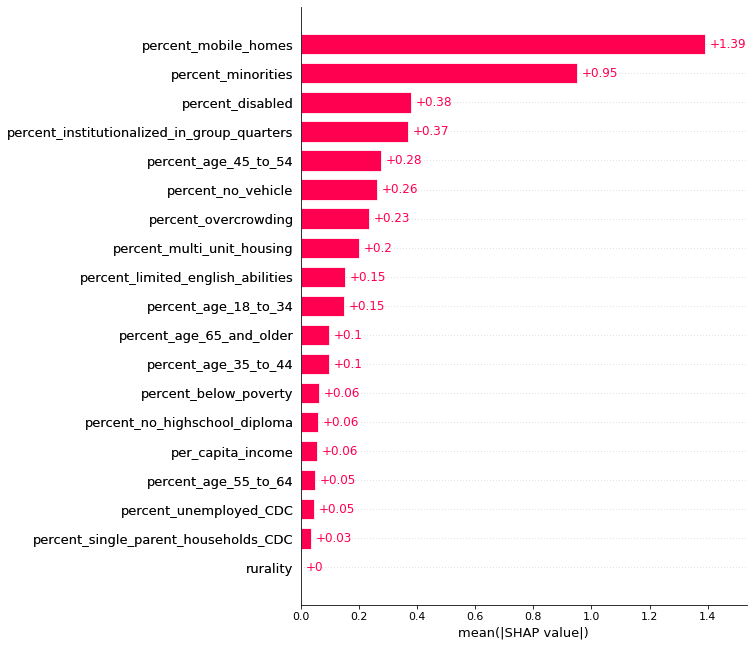

Bar graph to show  in rurality code 1 for firearm


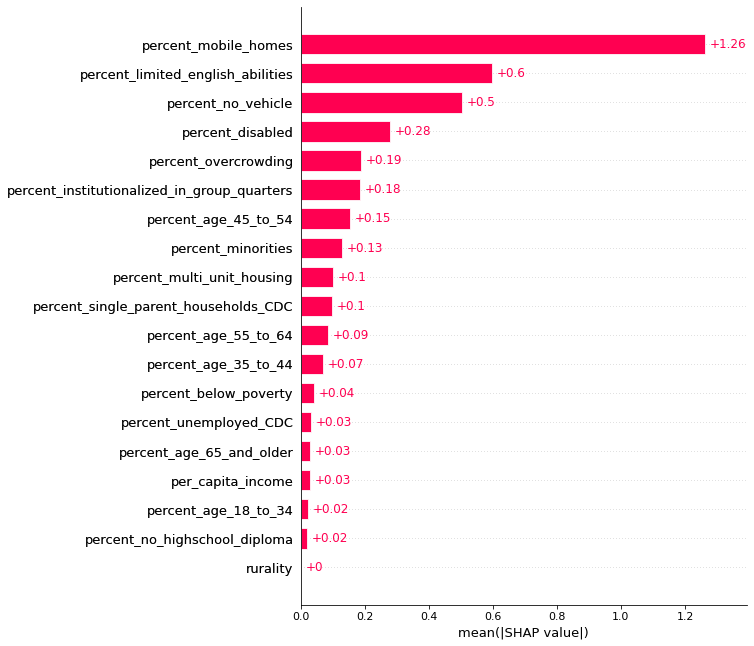

Bar graph to show  in rurality code 1 for nonfirearm


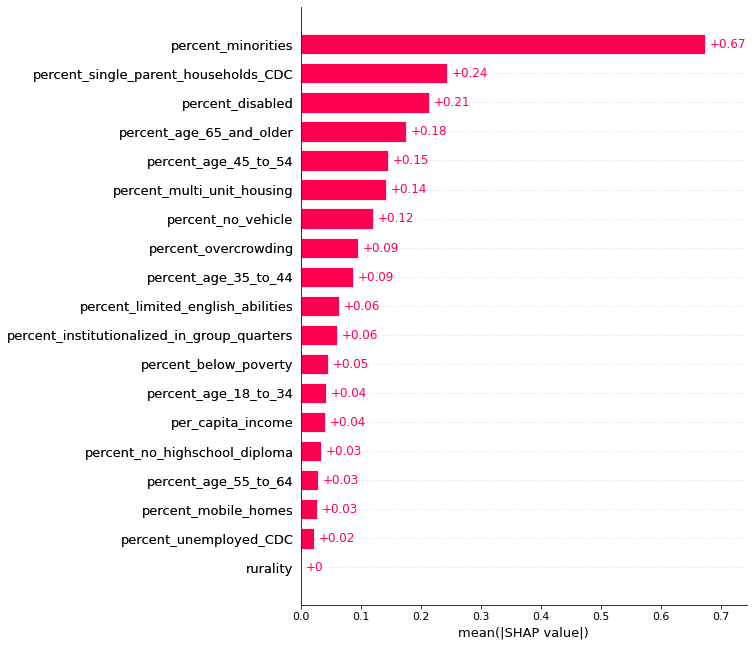

In [40]:
compare2(r1, suicide_types, 'rurality code 1')

Bar graph to show  in rurality code 2 for overall


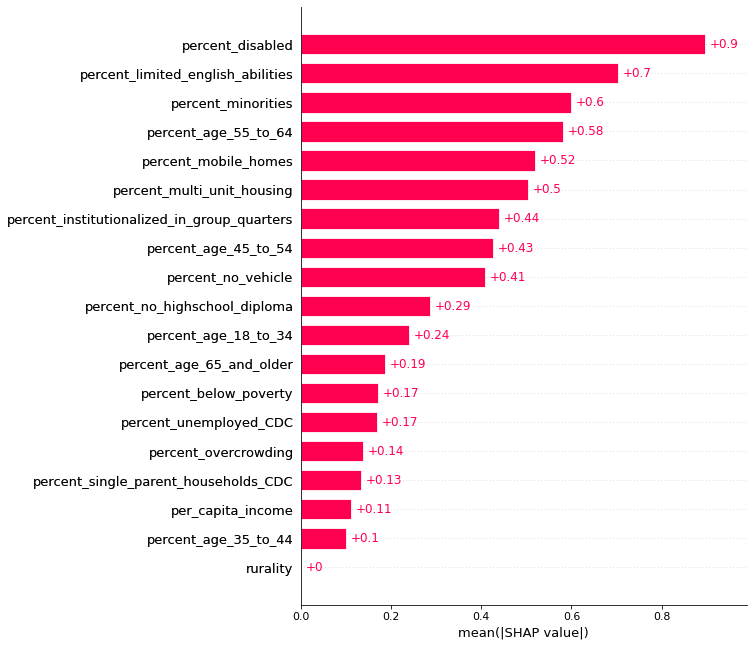

Bar graph to show  in rurality code 2 for firearm


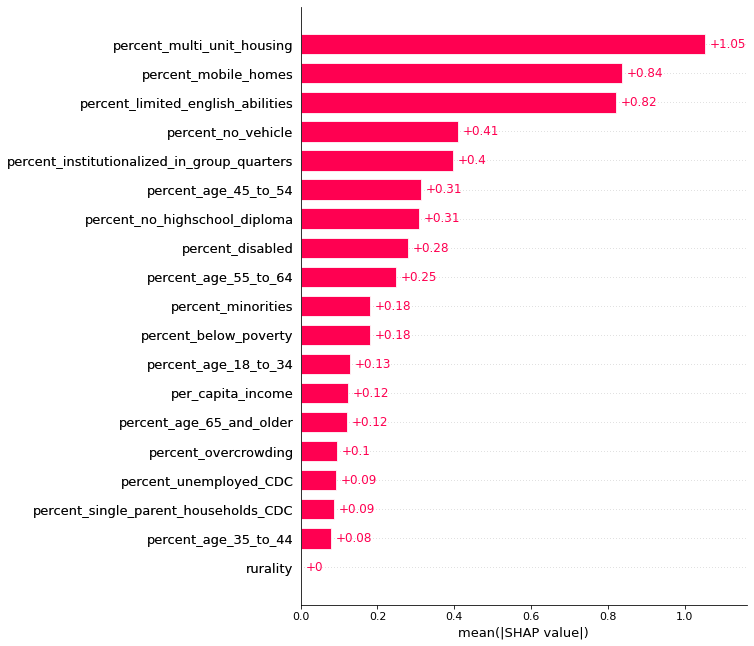

Bar graph to show  in rurality code 2 for nonfirearm


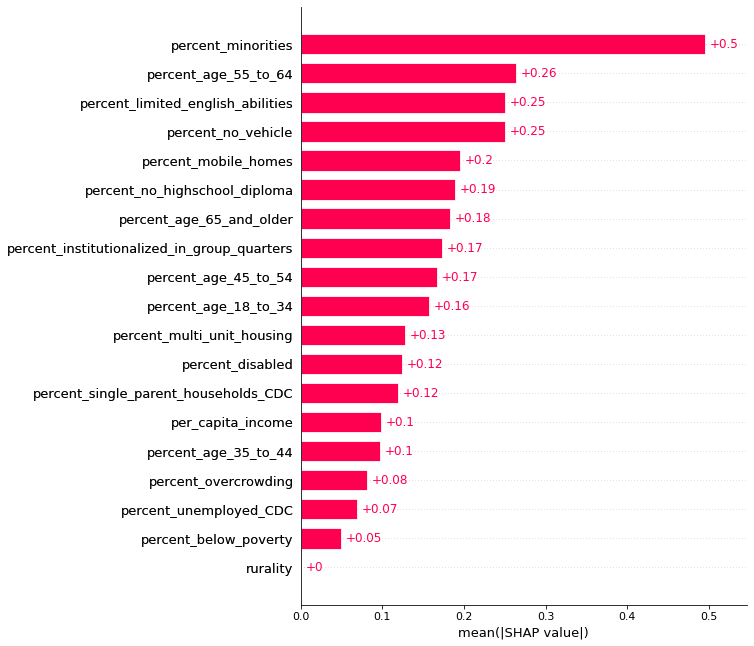

In [41]:
compare2(r2, suicide_types, 'rurality code 2')

Bar graph to show  in rurality code 3 for overall


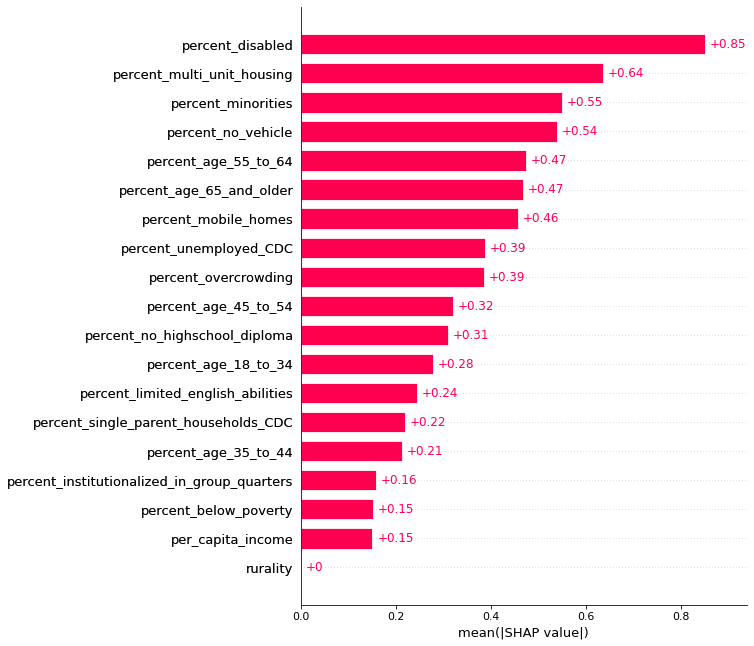

Bar graph to show  in rurality code 3 for firearm


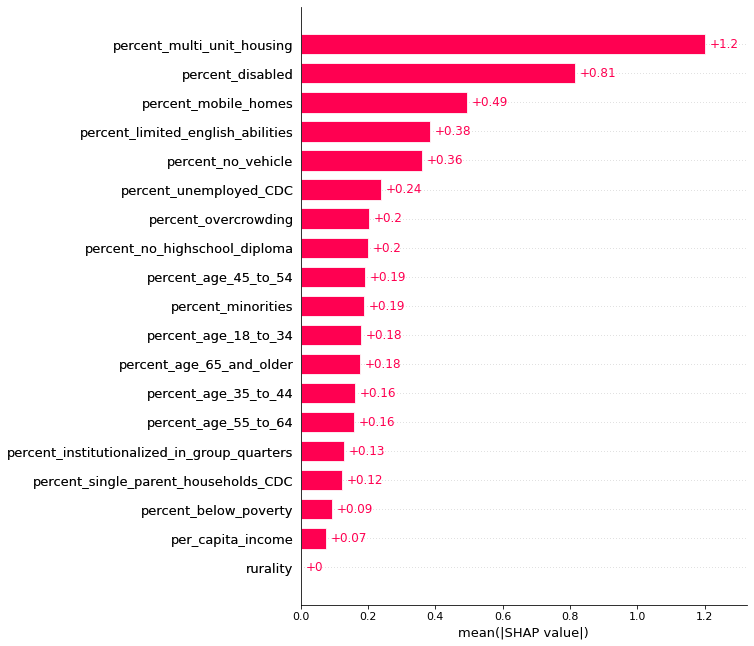

Bar graph to show  in rurality code 3 for nonfirearm


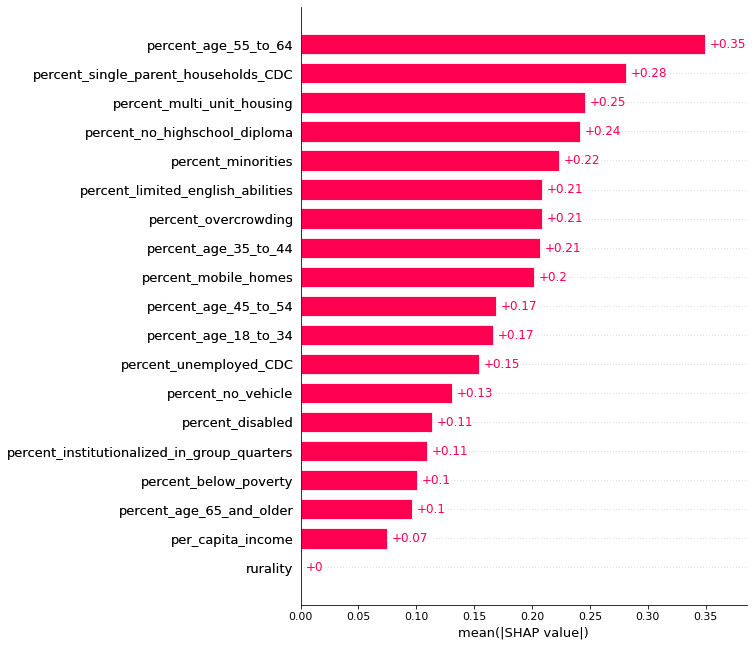

In [42]:
compare2(r3, suicide_types, 'rurality code 3')

Bar graph to show  in rurality code 4 for overall


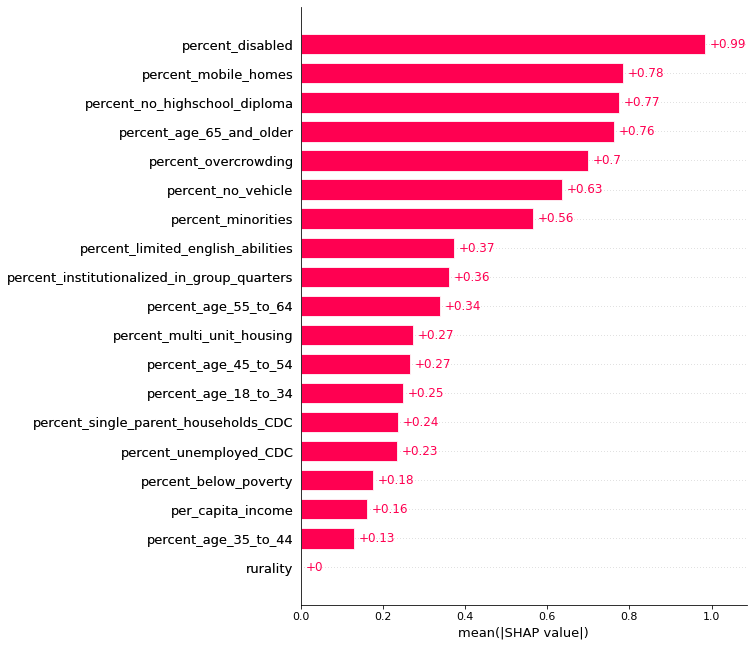

Bar graph to show  in rurality code 4 for firearm


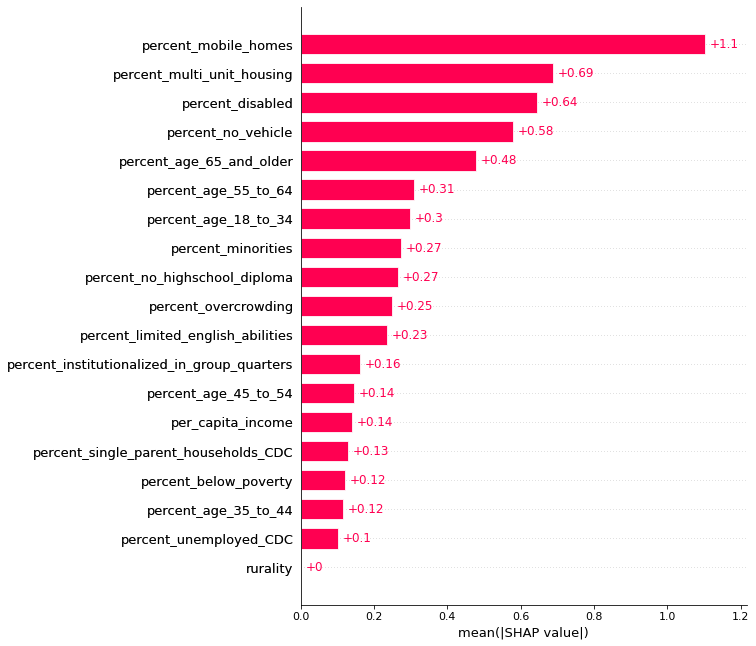

Bar graph to show  in rurality code 4 for nonfirearm


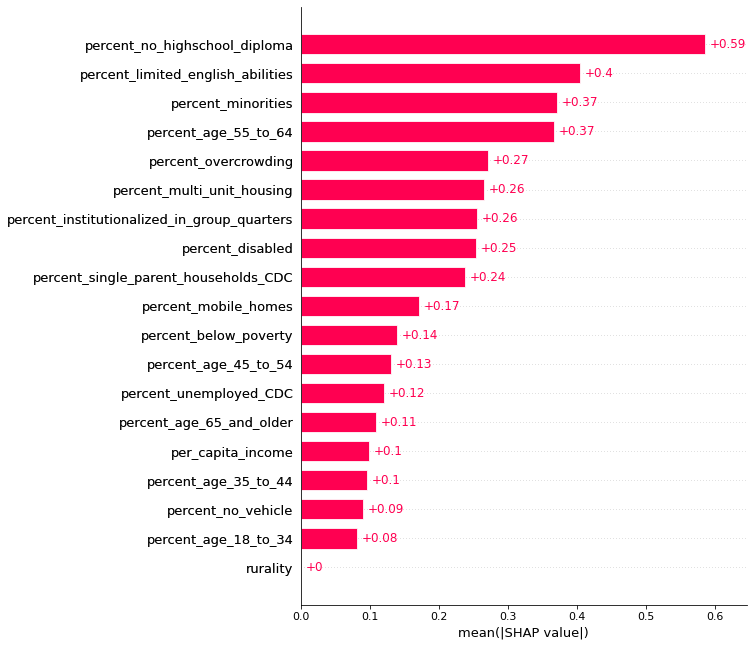

In [43]:
compare2(r4, suicide_types, 'rurality code 4')

Bar graph to show  in rurality code 5 for overall


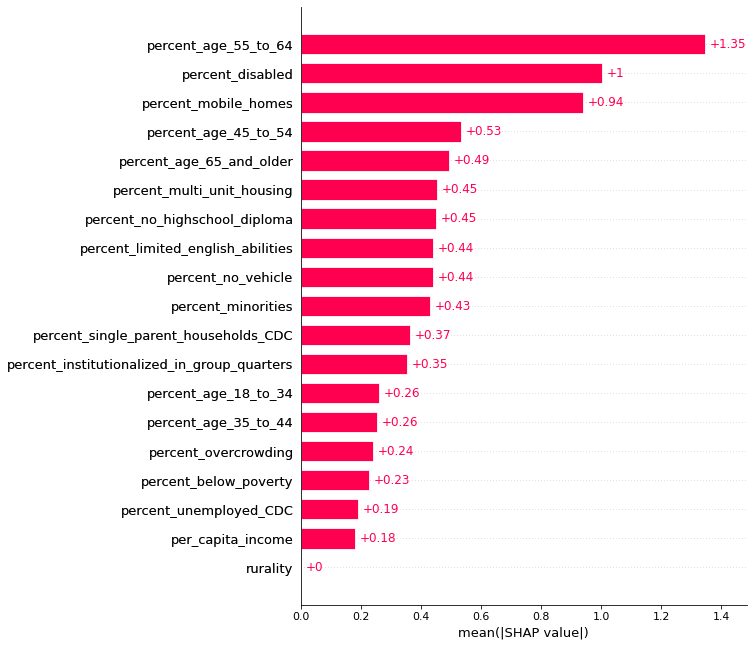

Bar graph to show  in rurality code 5 for firearm


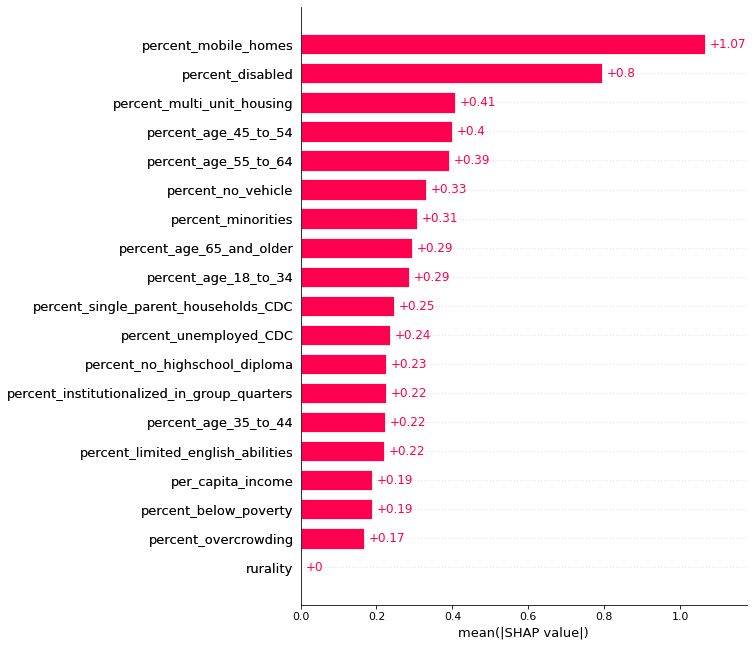

Bar graph to show  in rurality code 5 for nonfirearm


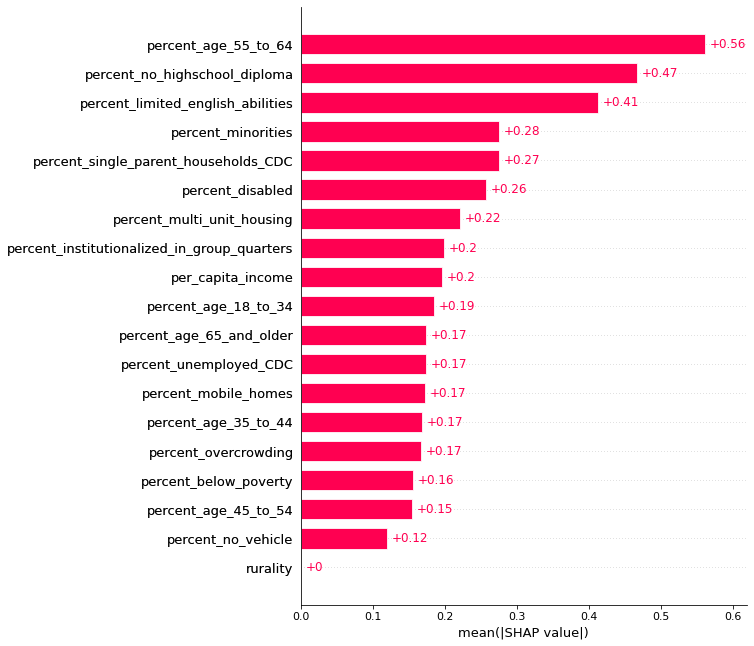

In [44]:
compare2(r5, suicide_types, 'rurality code 5')

Bar graph to show  in rurality code 6 for overall


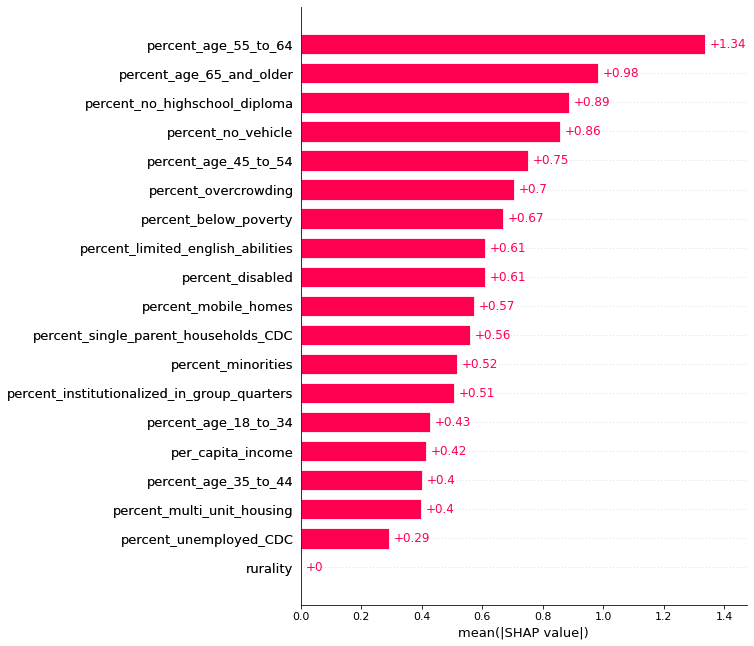

Bar graph to show  in rurality code 6 for firearm


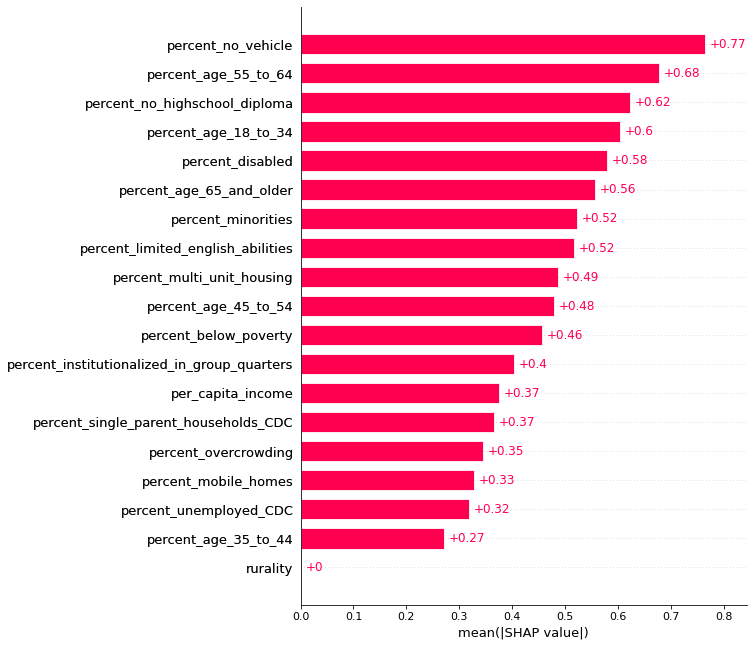

Bar graph to show  in rurality code 6 for nonfirearm


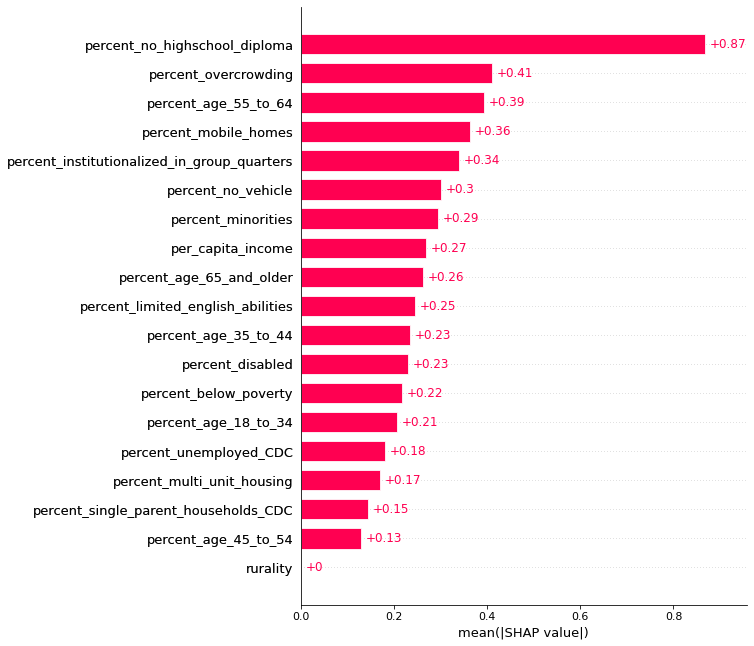

In [45]:
compare2(r6, suicide_types, 'rurality code 6')

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Beeswarm graph to show socioeconomic factors in rurality code 1 for overall


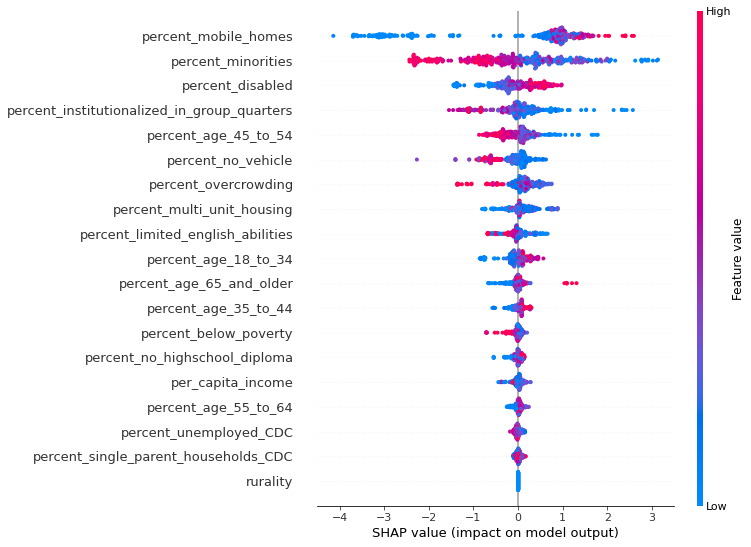

Beeswarm graph to show socioeconomic factors in rurality code 1 for firearm


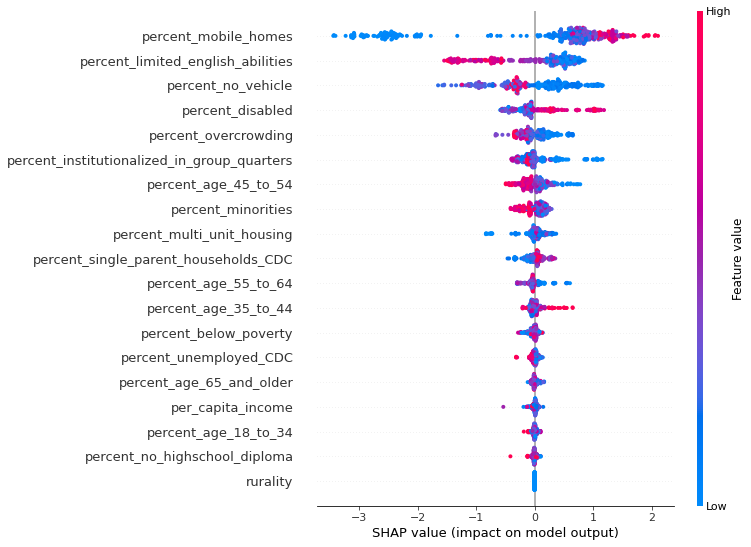

Beeswarm graph to show socioeconomic factors in rurality code 1 for nonfirearm


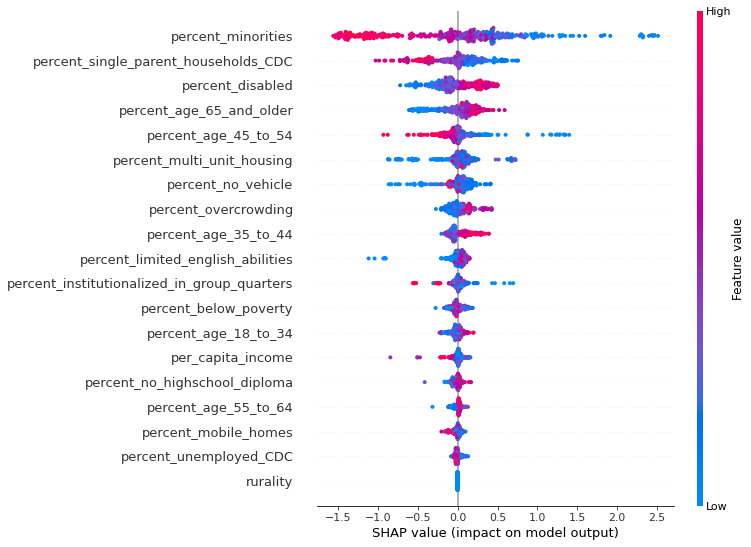

In [27]:
compare(r1, suicide_types, 'rurality code 1')

Beeswarm graph to show socioeconomic factors in rurality code 2 for overall


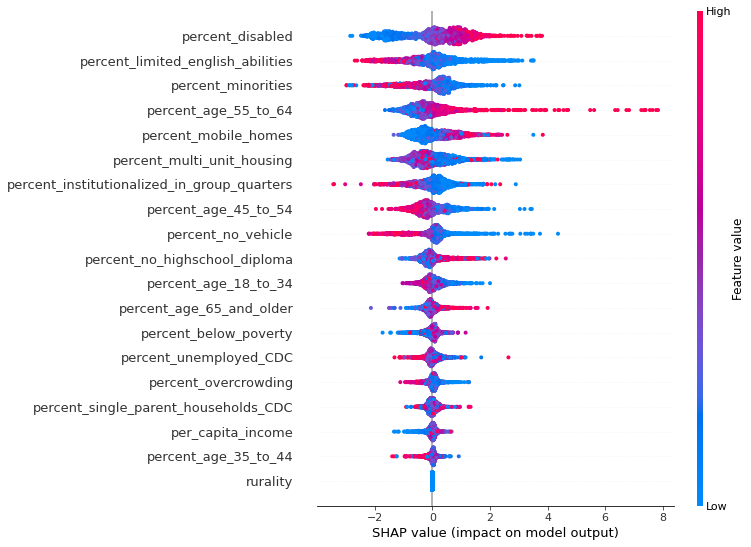

Beeswarm graph to show socioeconomic factors in rurality code 2 for firearm


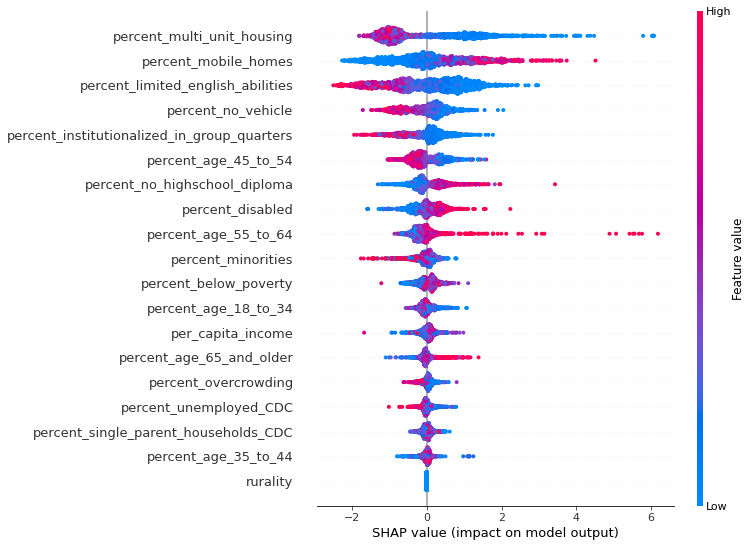

Beeswarm graph to show socioeconomic factors in rurality code 2 for nonfirearm


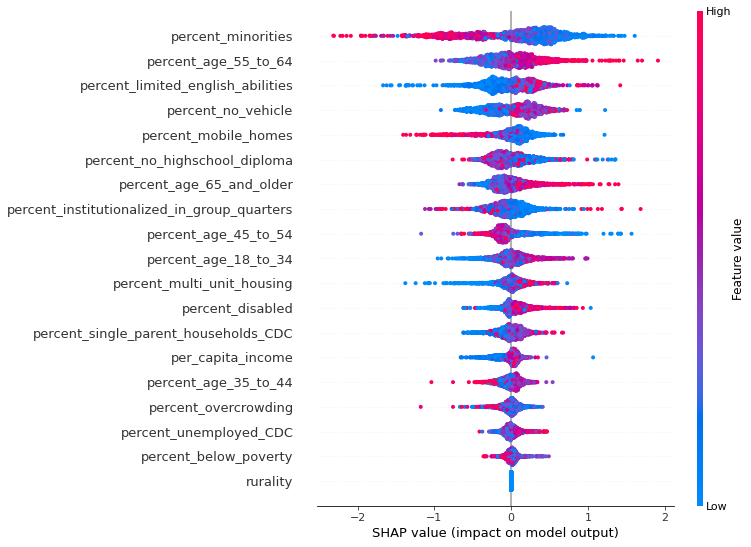

In [28]:
compare(r2, suicide_types, 'rurality code 2')

Beeswarm graph to show socioeconomic factors in rurality code 3 for overall


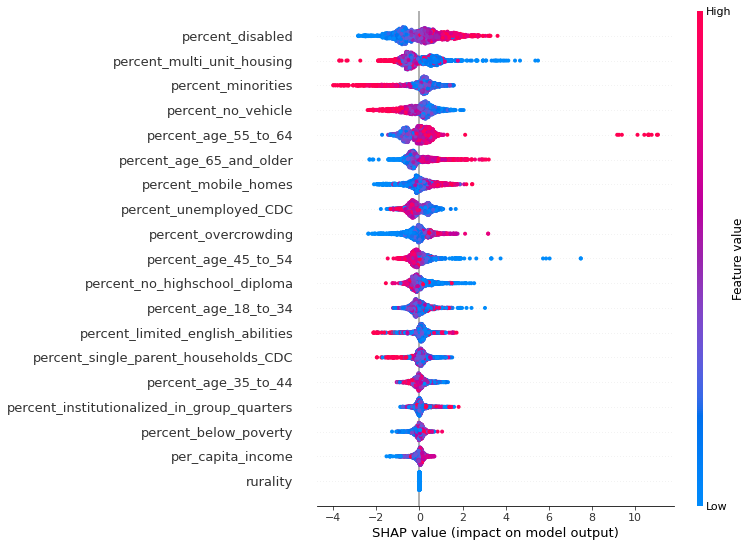

Beeswarm graph to show socioeconomic factors in rurality code 3 for firearm


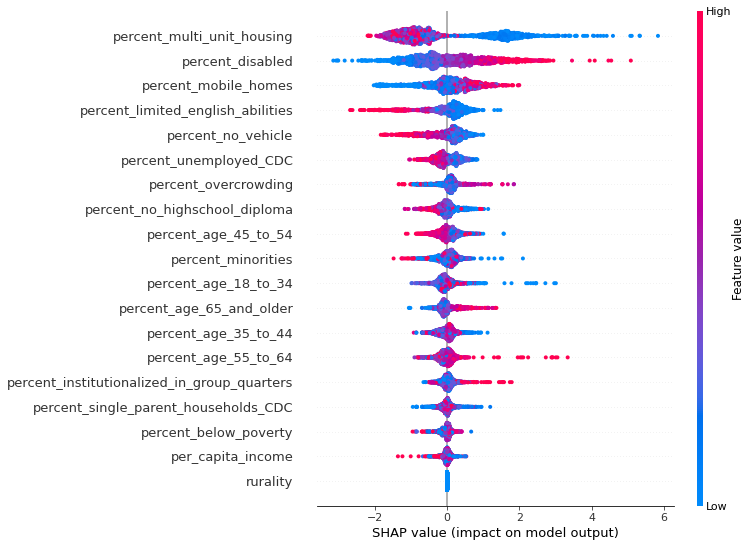

Beeswarm graph to show socioeconomic factors in rurality code 3 for nonfirearm


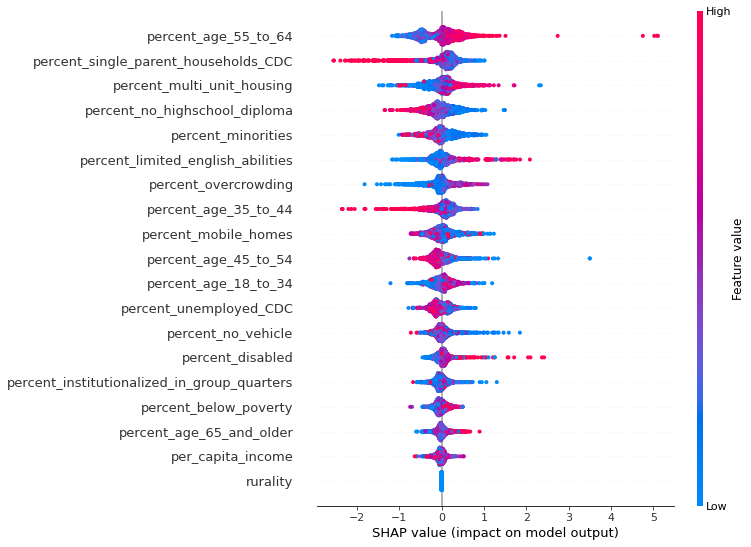

In [29]:
compare(r3, suicide_types, 'rurality code 3')

Beeswarm graph to show socioeconomic factors in rurality code 4 for overall


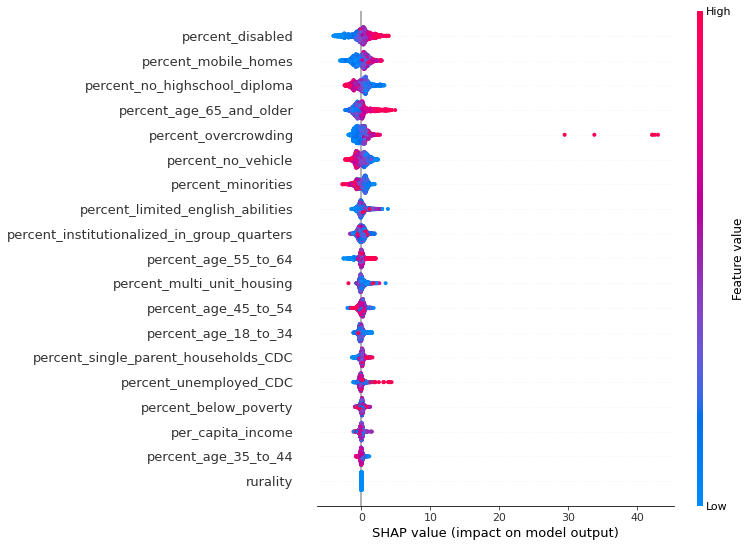

Beeswarm graph to show socioeconomic factors in rurality code 4 for firearm


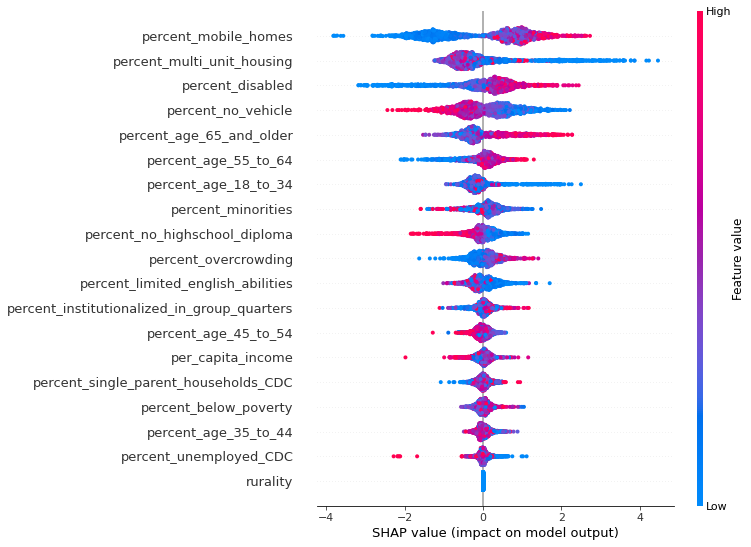

Beeswarm graph to show socioeconomic factors in rurality code 4 for nonfirearm


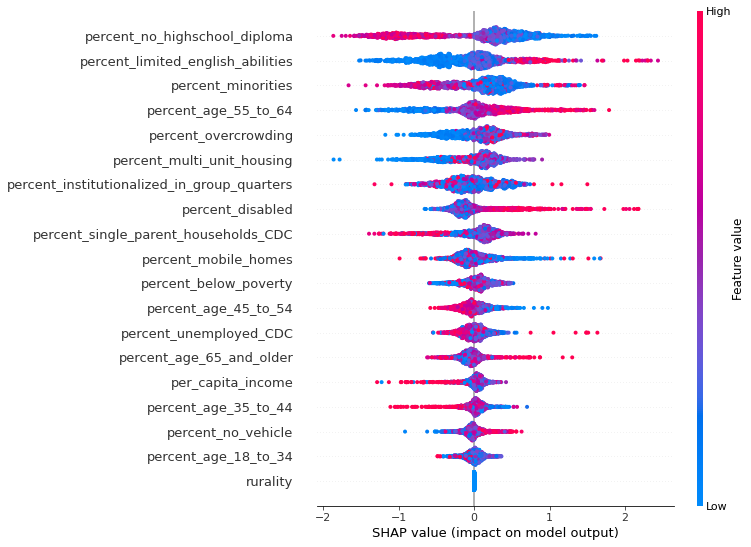

In [30]:
compare(r4, suicide_types, 'rurality code 4')

Beeswarm graph to show socioeconomic factors in rurality code 4 for overall


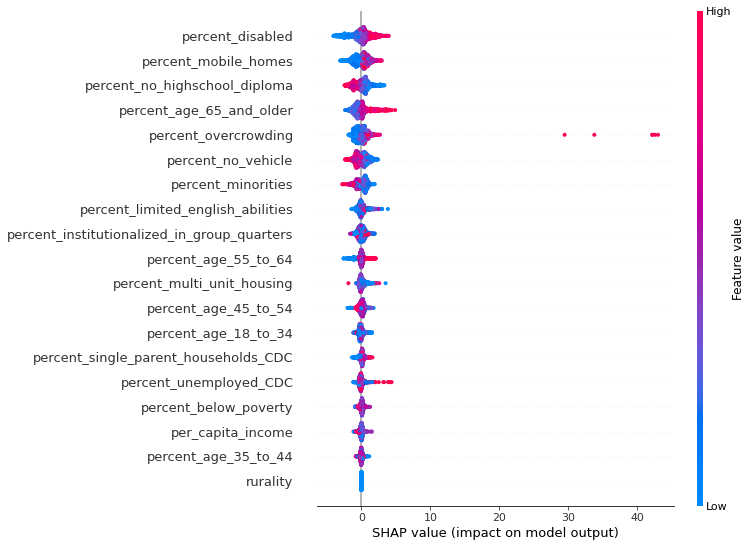

Beeswarm graph to show socioeconomic factors in rurality code 4 for firearm


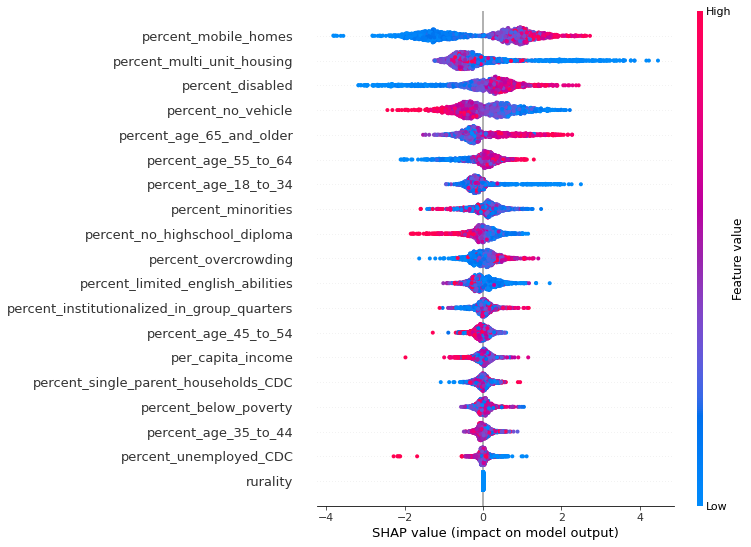

Beeswarm graph to show socioeconomic factors in rurality code 4 for nonfirearm


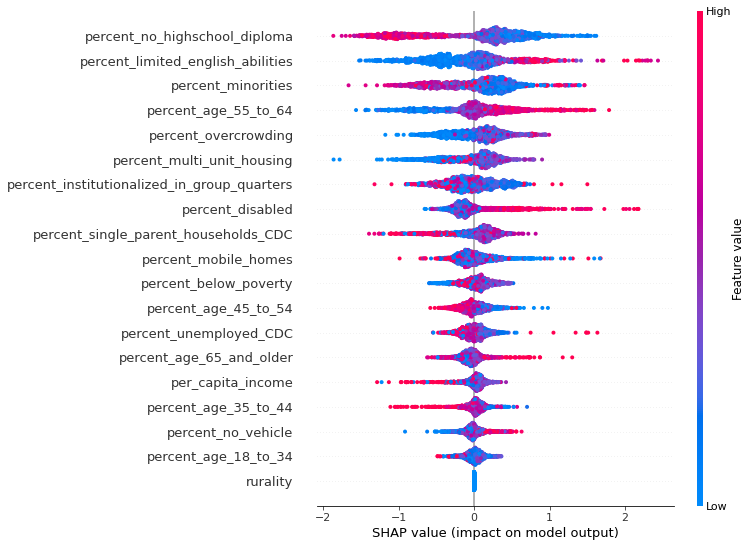

In [31]:
compare(r4, suicide_types, 'rurality code 4')

Beeswarm graph to show socioeconomic factors in rurality code 5 for overall


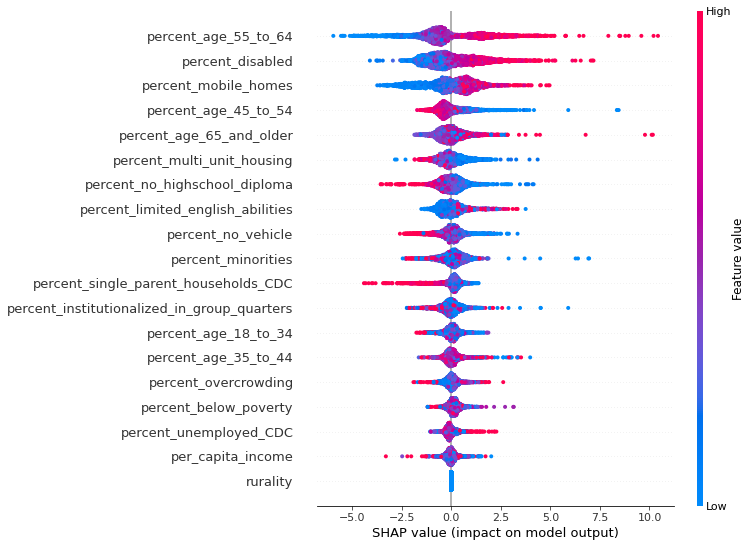

Beeswarm graph to show socioeconomic factors in rurality code 5 for firearm


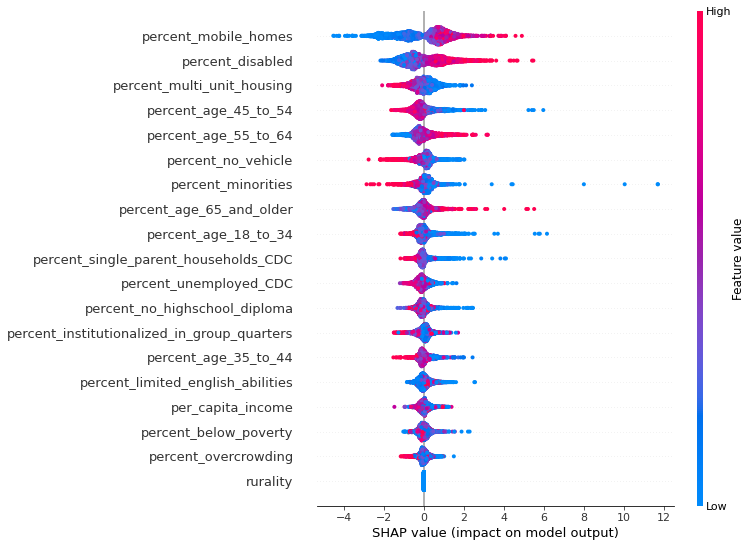

Beeswarm graph to show socioeconomic factors in rurality code 5 for nonfirearm


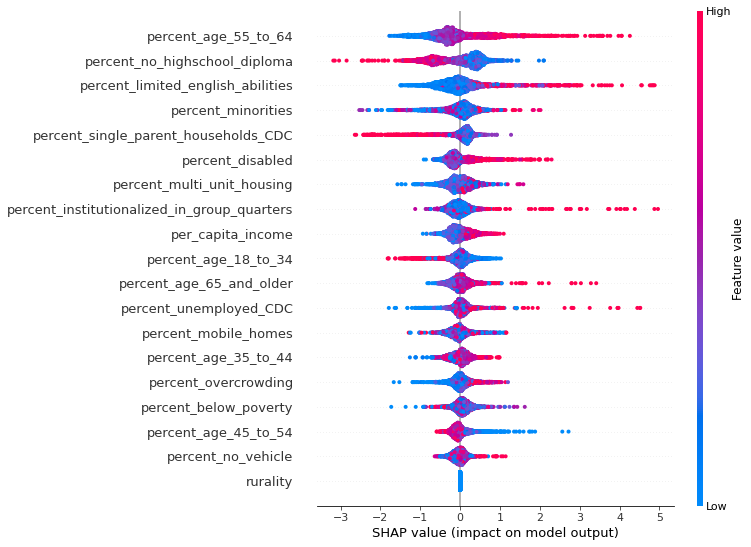

In [32]:
compare(r5, suicide_types, 'rurality code 5')

Beeswarm graph to show socioeconomic factors in rurality code 6 for overall


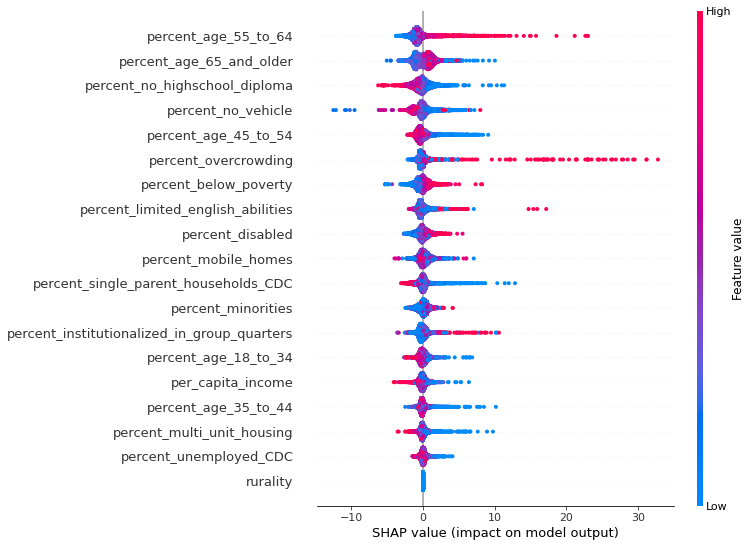

Beeswarm graph to show socioeconomic factors in rurality code 6 for firearm


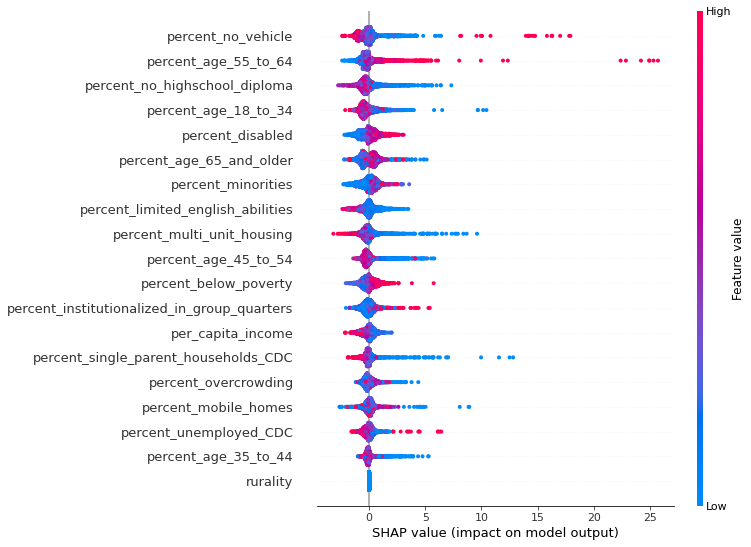

Beeswarm graph to show socioeconomic factors in rurality code 6 for nonfirearm


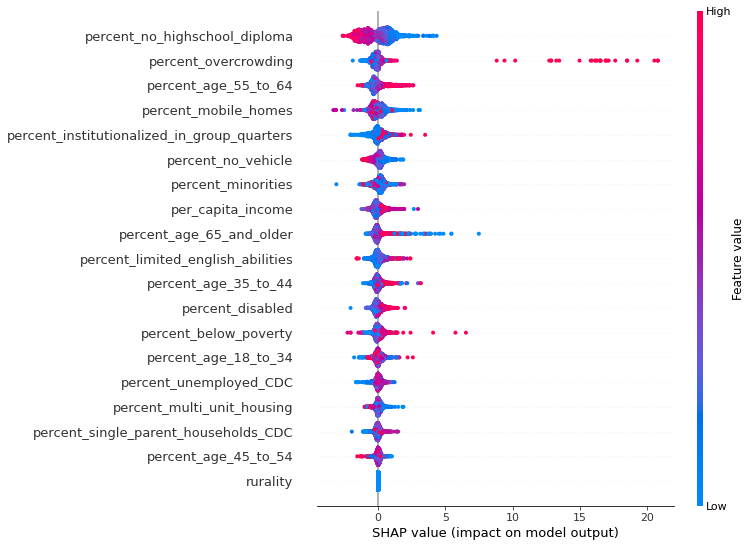

In [33]:
compare(r6, suicide_types, 'rurality code 6')

### Upload aggregated firearm suicide rates during 2014 to 2018

In [4]:
suicide_firearm = pd.read_csv(r'Firearm_Suicide_Aggregated/firearm_2018_aggregated.txt', sep='\t',dtype={"County Code": str})
suicide_firearm = suicide_firearm.drop("Notes",1)
suicide_firearm = suicide_firearm.dropna(how = 'any')
suicide_firearm['Deaths']=suicide_firearm['Deaths'].astype(int)
suicide_firearm['Population']=suicide_firearm['Population'].astype(int)
suicide_firearm['SuicideDeathRate'] = (suicide_firearm['Deaths'] / suicide_firearm['Population'])*100000
suicide_firearm.head()

/global/homes/w/wenhuan/.conda/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


,County,County Code,Deaths,Population,Crude Rate,SuicideDeathRate
0,"Autauga County, AL",01001,34,277263,12.3,12.262725
1,"Baldwin County, AL",01003,121,1043033,11.6,11.600783
2,"Barbour County, AL",01005,15,129492,Unreliable,11.583727
3,"Bibb County, AL",01007,17,112800,Unreliable,15.070922
4,"Blount County, AL",01009,34,288949,11.8,11.766782


### Upload aggregated non-firearm suicide rates during 2014 to 2018

In [5]:
suicide_nonfirearm = pd.read_csv(r'Nonfirearm_Suicide_Aggregated/nonfirearm_2018_aggregated.txt', sep='\t',dtype={"County Code": str})
suicide_nonfirearm = suicide_nonfirearm.drop("Notes",1)
suicide_nonfirearm = suicide_nonfirearm.dropna(how = 'any')
suicide_nonfirearm['Deaths']=suicide_nonfirearm['Deaths'].astype(int)
suicide_nonfirearm['Population']=suicide_nonfirearm['Population'].astype(int)
suicide_nonfirearm['SuicideDeathRate'] = (suicide_nonfirearm['Deaths'] / suicide_nonfirearm['Population'])*100000
suicide_nonfirearm.head()

/global/homes/w/wenhuan/.conda/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


,County,County Code,Deaths,Population,Crude Rate,SuicideDeathRate
0,"Autauga County, AL",01001,19,277263,Unreliable,6.852699
1,"Baldwin County, AL",01003,87,1043033,8.3,8.341059
2,"Blount County, AL",01009,16,288949,Unreliable,5.537309
3,"Calhoun County, AL",01015,25,575152,4.3,4.346677
4,"Chambers County, AL",01017,13,169370,Unreliable,7.675503


In [6]:
amount = [suicide_overall.shape[0], suicide_firearm.shape[0], suicide_nonfirearm.shape[0]]
data = {'Suicide Type': ['overall', 'firearm', 'nonfirearm'],
       'County Amount': amount}
df_amount = pd.DataFrame(data)
df_amount

,Suicide Type,County Amount
0,overall,2382
1,firearm,1967
2,nonfirearm,1498


### make up the missing non-firearm death records as many as possible

In [7]:
FS = suicide_firearm[['County Code', 'Deaths']]
FS = FS.rename(columns = {'County Code': 'fips', 'Deaths': 'Deaths_FS'})
NFS = suicide_nonfirearm[['County Code', 'Deaths']]
NFS = NFS.rename(columns = {'County Code': 'fips', 'Deaths': 'Deaths_NFS'})
suicide = suicide_overall[['County', 'County Code', 'Deaths', 'Population']]
suicide = suicide.rename(columns = {'County Code': 'fips'})

In [8]:
FS.head()

,fips,Deaths_FS
0,01001,34
1,01003,121
2,01005,15
3,01007,17
4,01009,34


In [9]:
NFS.head()

,fips,Deaths_NFS
0,01001,19
1,01003,87
2,01009,16
3,01015,25
4,01017,13


In [10]:
suicide.head()

,County,fips,Deaths,Population
0,"Autauga County, AL",01001,53,277263
1,"Baldwin County, AL",01003,208,1043033
2,"Barbour County, AL",01005,18,129492
3,"Bibb County, AL",01007,23,112800
4,"Blount County, AL",01009,50,288949


In [11]:
suicide = suicide.merge(FS, on = 'fips', how = 'left')
suicide = suicide.merge(NFS, on = 'fips', how = 'left')
suicide.head()

,County,fips,Deaths,Population,Deaths_FS,Deaths_NFS
0,"Autauga County, AL",01001,53,277263,34.0,19.0
1,"Baldwin County, AL",01003,208,1043033,121.0,87.0
2,"Barbour County, AL",01005,18,129492,15.0,NaN
3,"Bibb County, AL",01007,23,112800,17.0,NaN
4,"Blount County, AL",01009,50,288949,34.0,16.0


In [12]:
suicide['Deaths_NFS'] = suicide['Deaths'] - suicide['Deaths_FS']
suicide.head()

,County,fips,Deaths,Population,Deaths_FS,Deaths_NFS
0,"Autauga County, AL",01001,53,277263,34.0,19.0
1,"Baldwin County, AL",01003,208,1043033,121.0,87.0
2,"Barbour County, AL",01005,18,129492,15.0,3.0
3,"Bibb County, AL",01007,23,112800,17.0,6.0
4,"Blount County, AL",01009,50,288949,34.0,16.0


In [13]:
suicide['Deaths_FS'] = suicide['Deaths'] - suicide['Deaths_NFS']
suicide.head()

,County,fips,Deaths,Population,Deaths_FS,Deaths_NFS
0,"Autauga County, AL",01001,53,277263,34.0,19.0
1,"Baldwin County, AL",01003,208,1043033,121.0,87.0
2,"Barbour County, AL",01005,18,129492,15.0,3.0
3,"Bibb County, AL",01007,23,112800,17.0,6.0
4,"Blount County, AL",01009,50,288949,34.0,16.0


In [14]:
suicide_overall = suicide[['County', 'fips', 'Deaths', 'Population']]
suicide_overall['SuicideDeathRate'] = (suicide_overall['Deaths'] / suicide_overall['Population'])*100000
suicide_overall.head()

/global/homes/w/wenhuan/.conda/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,County,fips,Deaths,Population,SuicideDeathRate
0,"Autauga County, AL",01001,53,277263,19.115425
1,"Baldwin County, AL",01003,208,1043033,19.941843
2,"Barbour County, AL",01005,18,129492,13.900473
3,"Bibb County, AL",01007,23,112800,20.390071
4,"Blount County, AL",01009,50,288949,17.304092


In [15]:
suicide_firearm = suicide[['County', 'fips', 'Deaths_FS', 'Population']]
suicide_firearm = suicide_firearm.rename(columns = {'Deaths_FS': 'Deaths'})
suicide_firearm['SuicideDeathRate'] = (suicide_firearm['Deaths'] / suicide_firearm['Population'])*100000
suicide_firearm.head()

,County,fips,Deaths,Population,SuicideDeathRate
0,"Autauga County, AL",01001,34.0,277263,12.262725
1,"Baldwin County, AL",01003,121.0,1043033,11.600783
2,"Barbour County, AL",01005,15.0,129492,11.583727
3,"Bibb County, AL",01007,17.0,112800,15.070922
4,"Blount County, AL",01009,34.0,288949,11.766782


In [16]:
suicide_nonfirearm = suicide[['County', 'fips', 'Deaths_NFS', 'Population']]
suicide_nonfirearm = suicide_nonfirearm.rename(columns = {'Deaths_NFS': 'Deaths'})
suicide_nonfirearm['SuicideDeathRate'] = (suicide_nonfirearm['Deaths'] / suicide_nonfirearm['Population'])*100000
suicide_nonfirearm.head()

,County,fips,Deaths,Population,SuicideDeathRate
0,"Autauga County, AL",01001,19.0,277263,6.852699
1,"Baldwin County, AL",01003,87.0,1043033,8.341059
2,"Barbour County, AL",01005,3.0,129492,2.316745
3,"Bibb County, AL",01007,6.0,112800,5.319149
4,"Blount County, AL",01009,16.0,288949,5.537309


In [17]:
suicide_overall = suicide_overall.dropna()
suicide_firearm = suicide_firearm.dropna()
suicide_nonfirearm = suicide_nonfirearm.dropna()

In [18]:
amount = [suicide_overall.shape[0], suicide_firearm.shape[0], suicide_nonfirearm.shape[0]]
data = {'Suicide Type': ['overall', 'firearm', 'nonfirearm'],
       'County Amount': amount}
df_amount = pd.DataFrame(data)
df_amount

,Suicide Type,County Amount
0,overall,2382
1,firearm,1967
2,nonfirearm,1967


In [19]:
suicide_overall['Suicide Type'] = 'Overall'
suicide_firearm['Suicide Type'] = 'Firearm'
suicide_nonfirearm['Suicide Type'] = 'Nonfirearm'

In [21]:
frames = [suicide_overall, suicide_firearm, suicide_nonfirearm]
suicide = pd.concat(frames)
suicide['period'] = '2014-2018'
suicide.head()

,County,fips,Deaths,Population,SuicideDeathRate,Suicide Type,period
0,"Autauga County, AL",01001,53.0,277263,19.115425,Overall,2014-2018
1,"Baldwin County, AL",01003,208.0,1043033,19.941843,Overall,2014-2018
2,"Barbour County, AL",01005,18.0,129492,13.900473,Overall,2014-2018
3,"Bibb County, AL",01007,23.0,112800,20.390071,Overall,2014-2018
4,"Blount County, AL",01009,50.0,288949,17.304092,Overall,2014-2018


In [23]:
suicide.shape

(6316, 7)

## uploading environmental data

In [24]:
ur_files = ddf.read_csv('Climate_Factors/climate_factors_aggregated_2018.csv', dtype = {'fips': str})
climate = ur_files.compute()
climate = climate.loc[:, ~climate.columns.str.contains('^Unnamed')]
climate = climate.drop(['county'], axis = 1)
climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8


## uploading social economic data

In [25]:
ur_files = ddf.read_csv('Social_Economic_Factors/Social_Economic_2018.csv', dtype = {'fips': str, 'per_capita_income': float})
social = ur_files.compute()
social = social.loc[:, ~social.columns.str.contains('^Unnamed')]
social = social.drop(['year'], axis = 1)
social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,percent_limited_english_abilities,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,3.280898,24.978261,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,5.112520,16.981168,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,5.596097,53.851524,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,2.126859,25.418387,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,7.187962,12.859745,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0


## uploading altitude data

In [26]:
ur_files = ddf.read_csv('county_altitude.csv', dtype = {'FIPSCODE': str})
altitude = ur_files.compute()
altitude = altitude.rename(columns = {'FIPSCODE': 'fips', 'elevation': 'altitude'})
altitude = altitude[['fips', 'altitude']]
altitude.head()

,fips,altitude
0,19107,207.03
1,19189,390.25
2,19029,385.95
3,19015,268.98
4,19059,425.89


In [27]:
social = social.merge(altitude, on = 'fips', how = 'left')
social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_minorities,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,24.978261,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,16.981168,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,53.851524,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,25.418387,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,12.859745,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46


In [28]:
climate.shape[0]

3142

In [29]:
social.shape[0]

3220

# Check SHAP value with overall suicide rates in 2382 counties

In [30]:
suicide_social = social.merge(suicide_overall[['fips', 'SuicideDeathRate']], on = 'fips', how = 'left')
suicide_social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude,SuicideDeathRate
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66,19.115425
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30,19.941843
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81,13.900473
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90,20.390071
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46,17.304092


In [31]:
def defineRural(rurality):
    if rurality >= 5:
        return 'rural'
    else:
        return 'urban'

In [32]:
suicide_social['rurality type'] = suicide_social['rurality'].apply(defineRural)
suicide_social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude,SuicideDeathRate,rurality type
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66,19.115425,urban
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30,19.941843,urban
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81,13.900473,rural
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90,20.390071,urban
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46,17.304092,urban


In [34]:
suicide_social.groupby('rurality type').count()['SuicideDeathRate']

rurality type
rural    1293
urban    1087
Name: SuicideDeathRate, dtype: int64

### divide social economic and climate factors and overall suicide rated to the rural and urban

In [35]:
overall_social_rural = suicide_social[suicide_social['rurality type']== 'rural']
overall_social_urban = suicide_social[suicide_social['rurality type']== 'urban']

In [37]:
overall_social_rural = overall_social_rural.dropna()
overall_social_rural.shape[0]

1285

In [38]:
overall_social_urban = overall_social_urban.dropna()
overall_social_urban.shape[0]

1075

In [39]:
suicide_climate = climate.merge(suicide_social[['fips', 'rurality', 'altitude', 'SuicideDeathRate']], on = 'fips', how = 'left')
suicide_climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone,rurality,altitude,SuicideDeathRate
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0,3.0,128.66,19.115425
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8,4.0,30.30,19.941843
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0,6.0,122.81,13.900473
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4,2.0,74.90,20.390071
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8,2.0,184.46,17.304092


In [40]:
suicide_climate['rurality type'] = suicide_climate['rurality'].apply(defineRural)
suicide_climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone,rurality,altitude,SuicideDeathRate,rurality type
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0,3.0,128.66,19.115425,urban
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8,4.0,30.30,19.941843,urban
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0,6.0,122.81,13.900473,rural
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4,2.0,74.90,20.390071,urban
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8,2.0,184.46,17.304092,urban


In [42]:
overall_climate_rural = suicide_climate[suicide_climate['rurality type']== 'rural']
overall_climate_urban = suicide_climate[suicide_climate['rurality type']== 'urban']

In [43]:
overall_climate_rural = overall_climate_rural.dropna()
overall_climate_rural.shape[0]

1210

In [44]:
overall_climate_urban = overall_climate_urban.dropna()
overall_climate_urban.shape[0]

1032

### divide social economic and climate factors and firearm suicide rated to the rural and urban

In [45]:
firearm_social = social.merge(suicide_firearm[['fips', 'SuicideDeathRate']], on = 'fips', how = 'left')
firearm_social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude,SuicideDeathRate
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66,12.262725
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30,11.600783
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81,11.583727
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90,15.070922
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46,11.766782


In [46]:
firearm_social['rurality type'] = firearm_social['rurality'].apply(defineRural)
firearm_social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude,SuicideDeathRate,rurality type
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66,12.262725,urban
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30,11.600783,urban
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81,11.583727,rural
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90,15.070922,urban
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46,11.766782,urban


In [47]:
firearm_social_rural = firearm_social[firearm_social['rurality type']== 'rural']
firearm_social_urban = firearm_social[firearm_social['rurality type']== 'urban']

In [48]:
firearm_social_rural = firearm_social_rural.dropna()
firearm_social_rural.shape[0]

956

In [49]:
firearm_social_urban = firearm_social_urban.dropna()
firearm_social_urban.shape[0]

992

In [50]:
firearm_climate = climate.merge(firearm_social[['fips', 'rurality', 'altitude', 'SuicideDeathRate']], on = 'fips', how = 'left')
firearm_climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone,rurality,altitude,SuicideDeathRate
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0,3.0,128.66,12.262725
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8,4.0,30.30,11.600783
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0,6.0,122.81,11.583727
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4,2.0,74.90,15.070922
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8,2.0,184.46,11.766782


In [51]:
firearm_climate['rurality type'] = firearm_climate['rurality'].apply(defineRural)
firearm_climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone,rurality,altitude,SuicideDeathRate,rurality type
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0,3.0,128.66,12.262725,urban
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8,4.0,30.30,11.600783,urban
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0,6.0,122.81,11.583727,rural
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4,2.0,74.90,15.070922,urban
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8,2.0,184.46,11.766782,urban


In [52]:
firearm_climate_rural = firearm_climate[firearm_climate['rurality type']== 'rural']
firearm_climate_urban = firearm_climate[firearm_climate['rurality type']== 'urban']

In [53]:
firearm_climate_rural = firearm_climate_rural.dropna()
firearm_climate_rural.shape[0]

900

In [54]:
firearm_climate_urban = firearm_climate_urban.dropna()
firearm_climate_urban.shape[0]

952

### divide social economic and climate factors and non-firearm suicide rated to the rural and urban

In [55]:
nonfirearm_social = social.merge(suicide_nonfirearm[['fips', 'SuicideDeathRate']], on = 'fips', how = 'left')
nonfirearm_social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude,SuicideDeathRate
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66,6.852699
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30,8.341059
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81,2.316745
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90,5.319149
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46,5.537309


In [56]:
nonfirearm_social['rurality type'] = nonfirearm_social['rurality'].apply(defineRural)
nonfirearm_social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude,SuicideDeathRate,rurality type
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66,6.852699,urban
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30,8.341059,urban
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81,2.316745,rural
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90,5.319149,urban
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46,5.537309,urban


In [57]:
nonfirearm_social_rural = nonfirearm_social[firearm_social['rurality type']== 'rural']
nonfirearm_social_urban = nonfirearm_social[firearm_social['rurality type']== 'urban']

In [58]:
nonfirearm_social_rural = nonfirearm_social_rural.dropna()
nonfirearm_social_rural.shape[0]

956

In [59]:
nonfirearm_social_urban = nonfirearm_social_urban.dropna()
nonfirearm_social_urban.shape[0]

992

In [60]:
nonfirearm_climate = climate.merge(nonfirearm_social[['fips', 'rurality', 'altitude', 'SuicideDeathRate']], on = 'fips', how = 'left')
nonfirearm_climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone,rurality,altitude,SuicideDeathRate
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0,3.0,128.66,6.852699
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8,4.0,30.30,8.341059
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0,6.0,122.81,2.316745
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4,2.0,74.90,5.319149
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8,2.0,184.46,5.537309


In [64]:
nonfirearm_climate['rurality type'] = nonfirearm_climate['rurality'].apply(defineRural)
nonfirearm_climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone,rurality,altitude,SuicideDeathRate,rurality type
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0,3.0,128.66,6.852699,urban
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8,4.0,30.30,8.341059,urban
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0,6.0,122.81,2.316745,rural
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4,2.0,74.90,5.319149,urban
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8,2.0,184.46,5.537309,urban


In [66]:
nonfirearm_climate_rural = nonfirearm_climate[nonfirearm_climate['rurality type']== 'rural']
nonfirearm_climate_urban = nonfirearm_climate[nonfirearm_climate['rurality type']== 'urban']

In [67]:
nonfirearm_climate_rural = nonfirearm_climate_rural.dropna()
nonfirearm_climate_rural.shape[0]

900

In [68]:
nonfirearm_climate_urban = nonfirearm_climate_urban.dropna()
nonfirearm_climate_urban.shape[0]

952

In [69]:
import xgboost
import shap
import copy 

In [115]:
def compare(df_list, rurality_type, factor_type):
    for df in df_list:
        X = df.iloc[:, 1:-2]
        y = df.iloc[:, -2].array
        
        model = xgboost.XGBRegressor().fit(X, y)
        explainer = shap.Explainer(model)
        shap_values = explainer(X)
        print('Beeswarm graph to show ' + factor_type + ' in ' + rurality_type)
        shap.plots.beeswarm(copy.deepcopy(shap_values))

In [116]:
df_list = [overall_social_rural, firearm_social_rural, nonfirearm_social_rural]

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Beeswarm graph to show social factors in rural areas


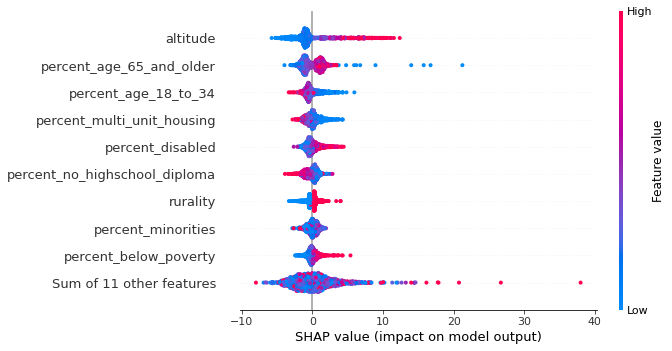

Beeswarm graph to show social factors in rural areas


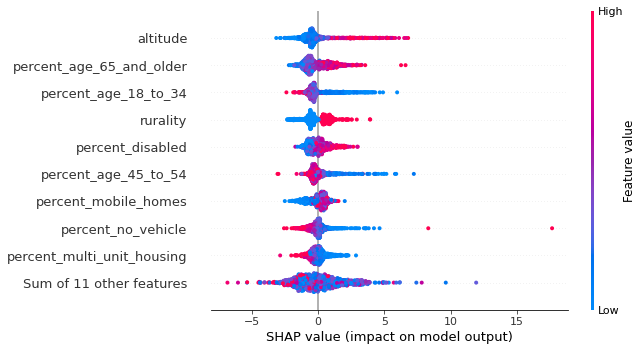

Beeswarm graph to show social factors in rural areas


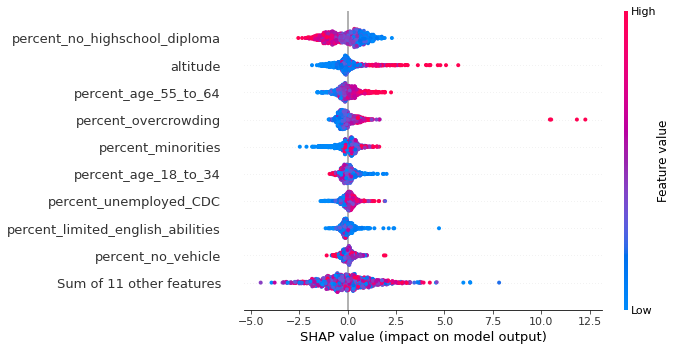

In [117]:
compare(df_list, 'rural areas', 'social factors')

In [118]:
df_list = [overall_social_urban, firearm_social_urban, nonfirearm_social_urban]

Beeswarm graph to show social factors in urban areas


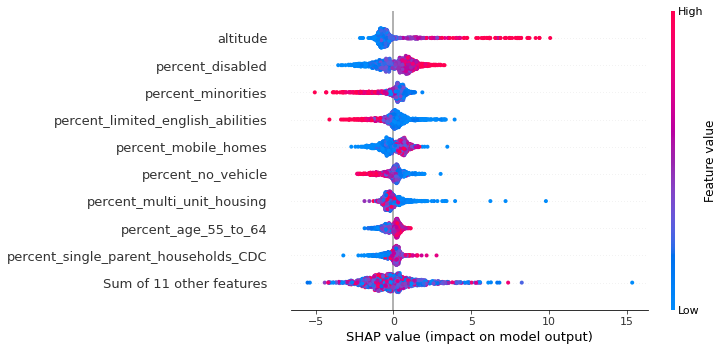

Beeswarm graph to show social factors in urban areas


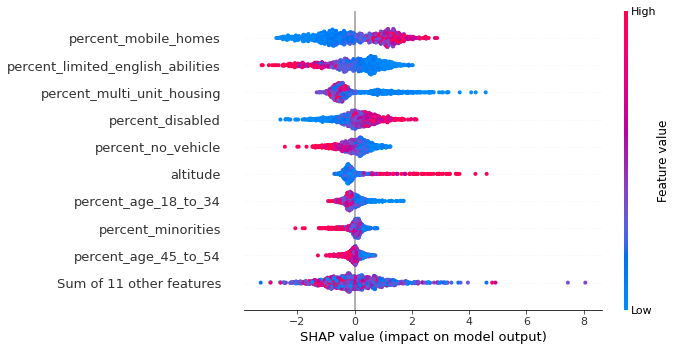

Beeswarm graph to show social factors in urban areas


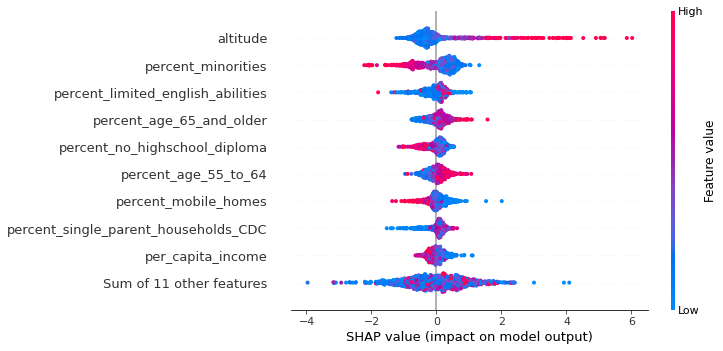

In [119]:
compare(df_list, 'urban areas', 'social factors')

In [100]:
def calculateSHAP(df, rurality_type, factor_type, suicide_type):
    county_amount = df.shape[0]
    print('SHAP Values of ' + factor_type + ' and altitude in ' + rurality_type + ' in ' + str(county_amount) + ' counties' + ' for ' + suicide_type)
    print()
    X = df.iloc[:, 1:-2]
    y = df.iloc[:, -2].array
    model = xgboost.XGBRegressor().fit(X, y)
    explainer = shap.Explainer(model)
    shap_values = explainer(X)
    # visualize the first prediction's explanation
    shap.plots.waterfall(shap_values[1])
    print()
    print('Bar graph to show ' + factor_type + ' in ' + rurality_type + ' for ' + suicide_type)
    shap.plots.bar(shap_values)
    print()
    print('Beeswarm graph to show ' + factor_type + ' in ' + rurality_type + ' for ' + suicide_type)
    shap.plots.beeswarm(copy.deepcopy(shap_values))
    print()
    print('interactions between rurality and altitude in ' + rurality_type + ' for ' + suicide_type)
    shap.plots.scatter(shap_values[:,"rurality"], color=shap_values[:,"altitude"], ymin = -5, ymax = 5)
    print()
    print('interactions between altitude and rurality in ' + rurality_type + ' for ' + suicide_type)
    shap.plots.scatter(shap_values[:,"altitude"], color=shap_values[:,"rurality"], ymin = -5, ymax = 15)
    print()
    columns = list(X.columns[:-2])
    
    for item in columns:
        print('interactions between ' + item + ' and altitude in ' + rurality_type + ' for ' + suicide_type)
        shap.plots.scatter(shap_values[:,item], color=shap_values[:,"altitude"], ymin = -5, ymax = 5)
        print()

In [101]:
df_list = [overall_social_rural, overall_social_urban, overall_climate_rural, overall_climate_urban,
          firearm_social_rural, firearm_social_urban, firearm_climate_rural, firearm_climate_urban,
          nonfirearm_social_rural, nonfirearm_social_urban, nonfirearm_climate_rural, firearm_climate_urban]

## SHAP - social economic factors in rural areas for overall suicide rate

SHAP Values of social factors and altitude in rural areas in 1285 counties for overall suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


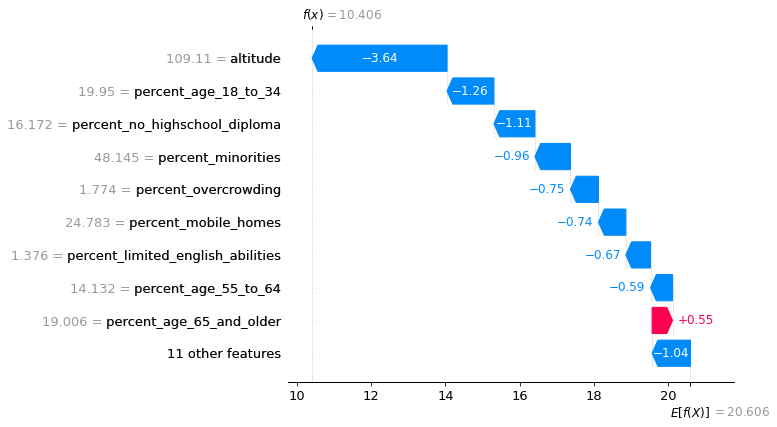


Bar graph to show social factors in rural areas for overall suicide


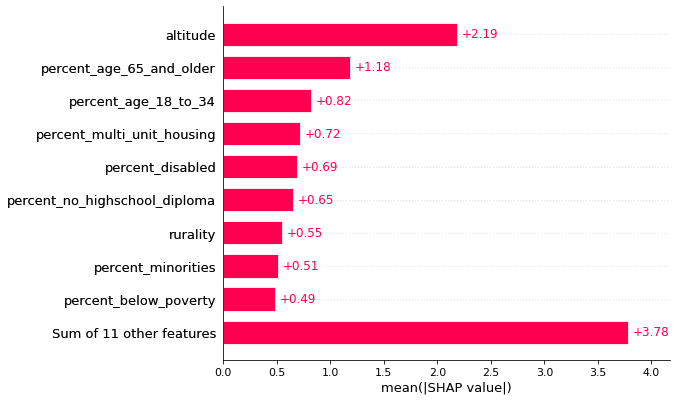


Beeswarm graph to show social factors in rural areas for overall suicide


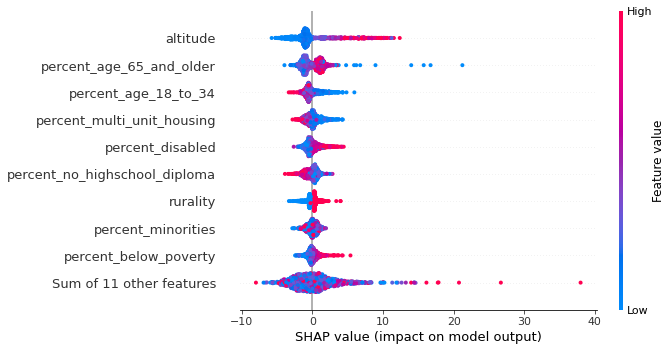


interactions between rurality and altitude in rural areas for overall suicide


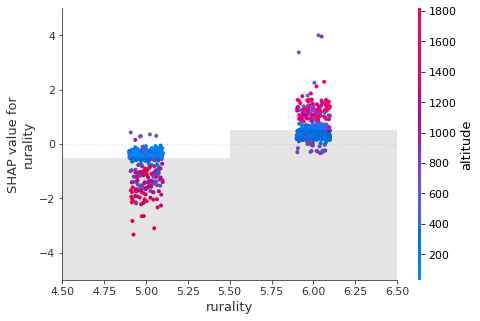


interactions between altitude and rurality in rural areas for overall suicide


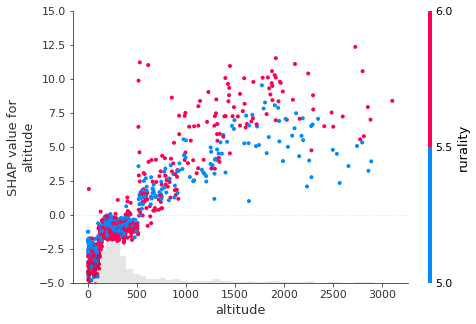


interactions between per_capita_income and altitude in rural areas for overall suicide


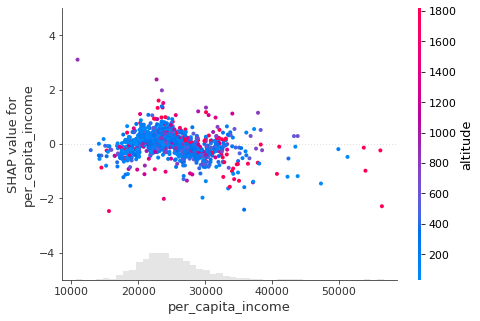


interactions between percent_below_poverty and altitude in rural areas for overall suicide


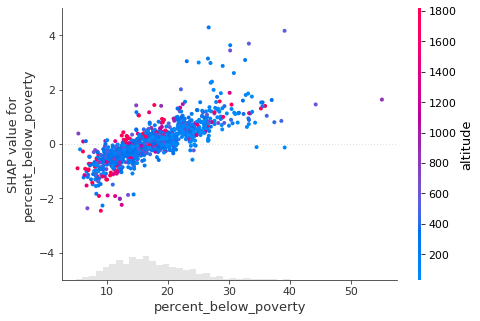


interactions between percent_no_highschool_diploma and altitude in rural areas for overall suicide


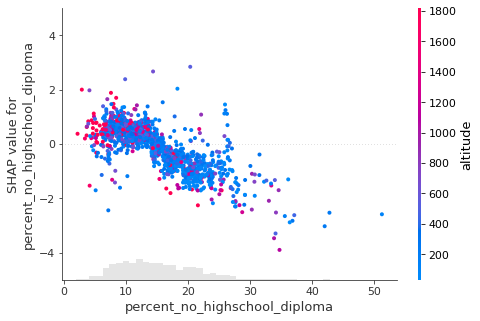


interactions between percent_mobile_homes and altitude in rural areas for overall suicide


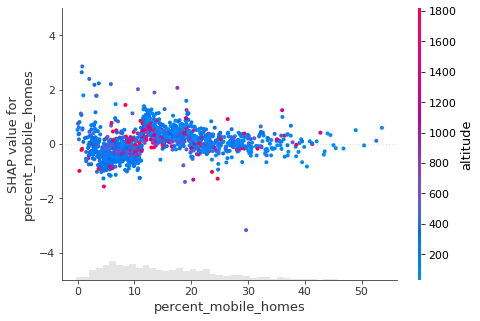


interactions between percent_no_vehicle and altitude in rural areas for overall suicide


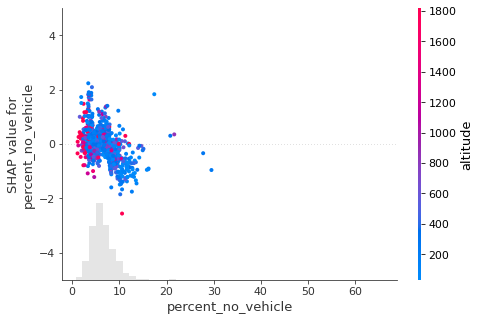


interactions between percent_unemployed_CDC and altitude in rural areas for overall suicide


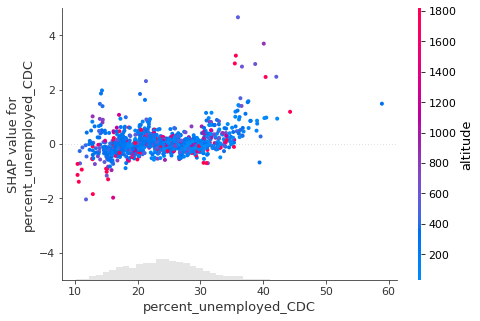


interactions between percent_overcrowding and altitude in rural areas for overall suicide


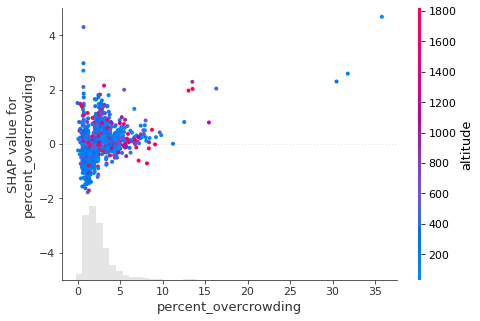


interactions between percent_multi_unit_housing and altitude in rural areas for overall suicide


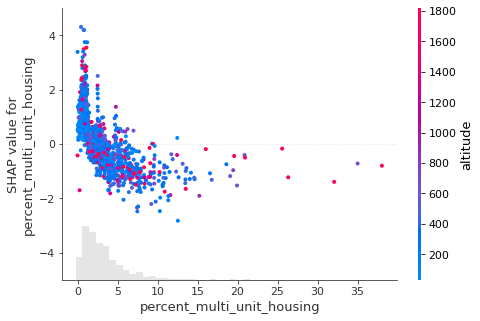


interactions between percent_age_65_and_older and altitude in rural areas for overall suicide


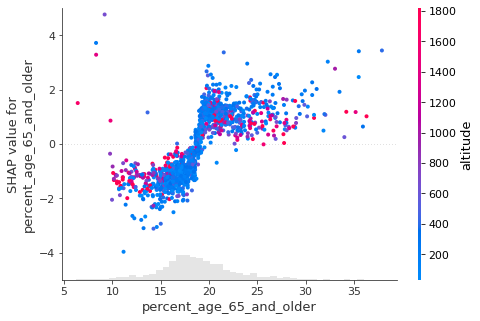


interactions between percent_limited_english_abilities and altitude in rural areas for overall suicide


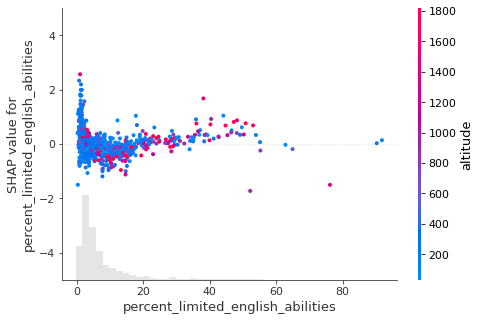


interactions between percent_minorities and altitude in rural areas for overall suicide


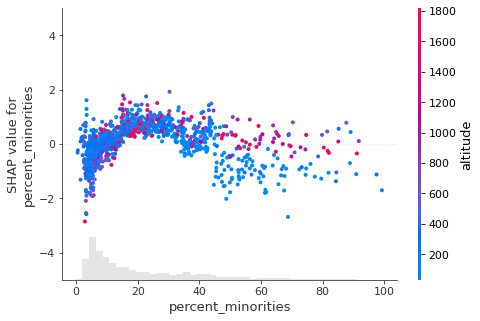


interactions between percent_disabled and altitude in rural areas for overall suicide


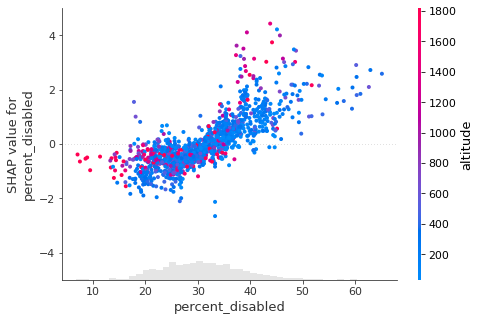


interactions between percent_institutionalized_in_group_quarters and altitude in rural areas for overall suicide


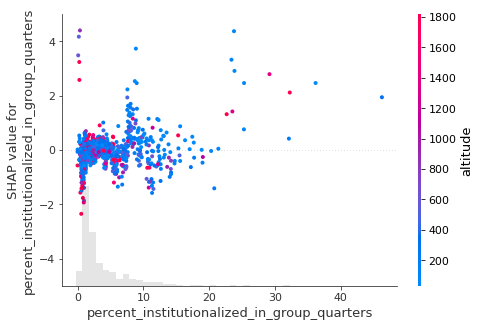


interactions between percent_single_parent_households_CDC and altitude in rural areas for overall suicide


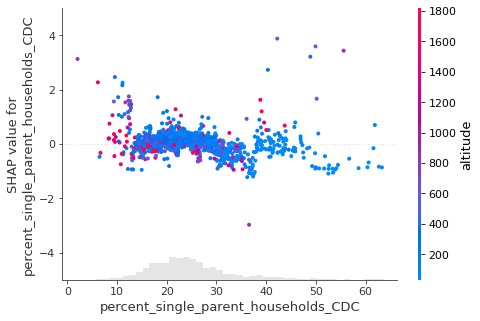


interactions between percent_age_18_to_34 and altitude in rural areas for overall suicide


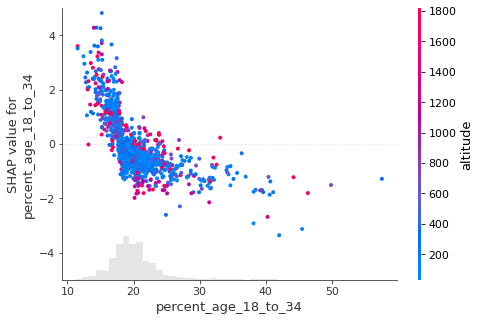


interactions between percent_age_35_to_44 and altitude in rural areas for overall suicide


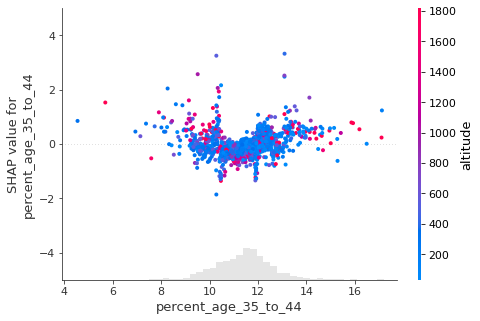


interactions between percent_age_45_to_54 and altitude in rural areas for overall suicide


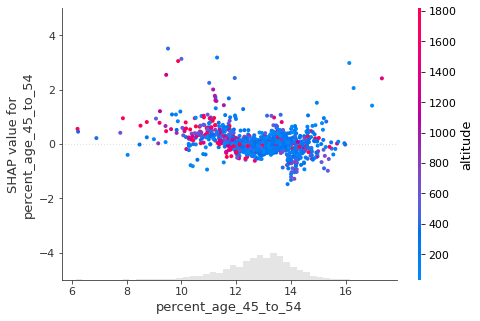


interactions between percent_age_55_to_64 and altitude in rural areas for overall suicide


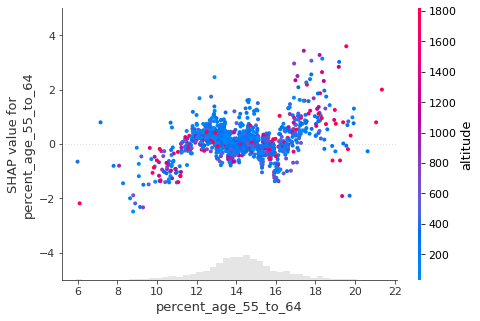

In [102]:
calculateSHAP(overall_social_rural, 'rural areas', 'social factors', 'overall suicide')

## SHAP - social economic factors in urban areas for overall suicide

SHAP Values of social factors and altitude in urban areas in 1075 counties for overall suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


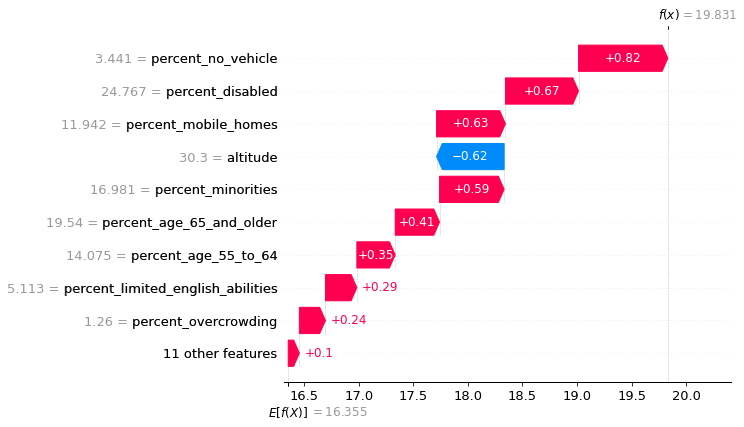


Bar graph to show social factors in urban areas for overall suicide


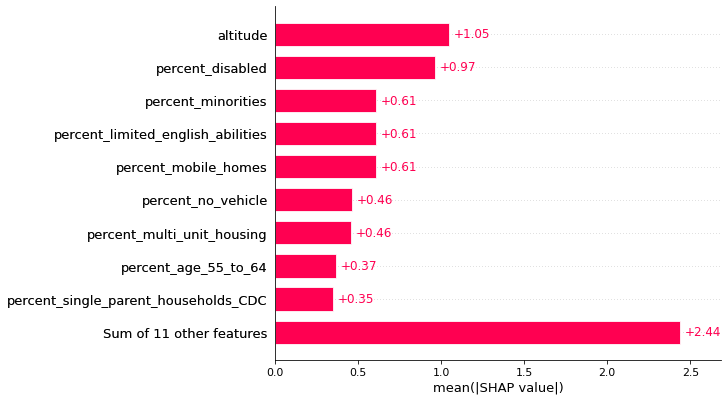


Beeswarm graph to show social factors in urban areas for overall suicide


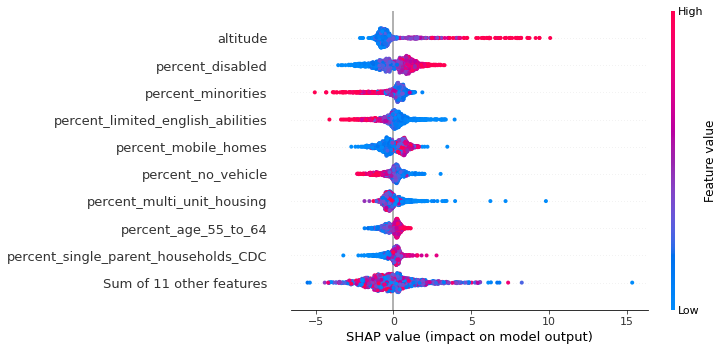


interactions between rurality and altitude in urban areas for overall suicide


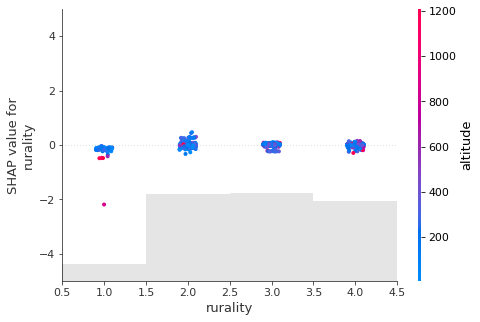


interactions between altitude and rurality in urban areas for overall suicide


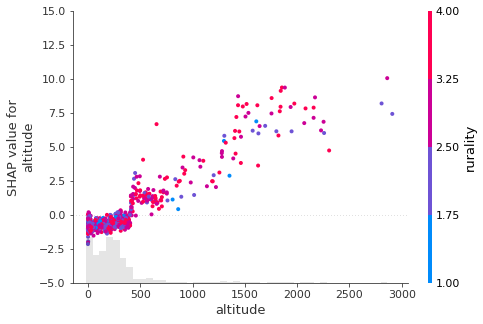


interactions between per_capita_income and altitude in urban areas for overall suicide


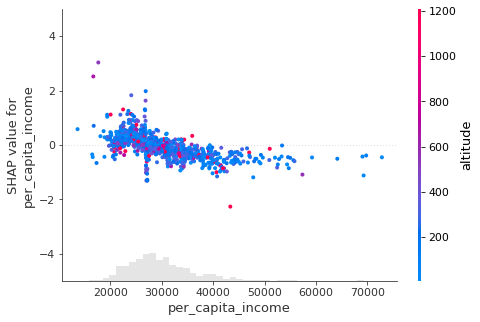


interactions between percent_below_poverty and altitude in urban areas for overall suicide


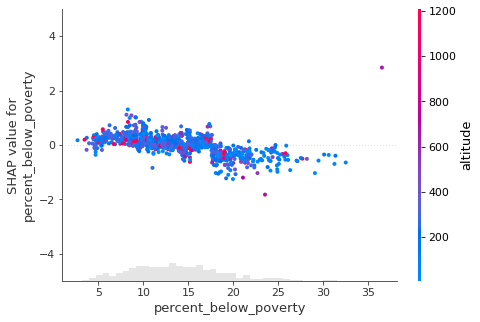


interactions between percent_no_highschool_diploma and altitude in urban areas for overall suicide


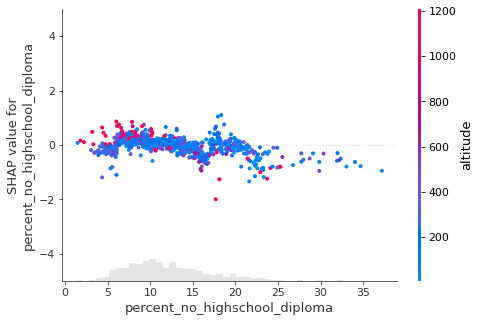


interactions between percent_mobile_homes and altitude in urban areas for overall suicide


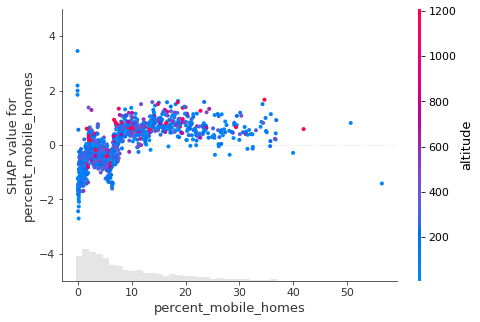


interactions between percent_no_vehicle and altitude in urban areas for overall suicide


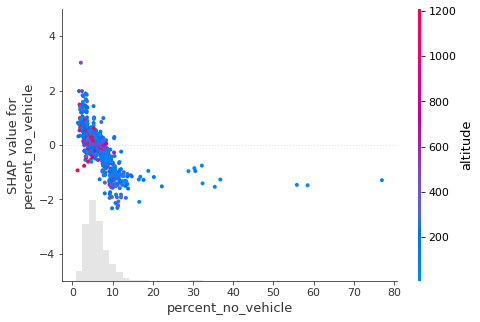


interactions between percent_unemployed_CDC and altitude in urban areas for overall suicide


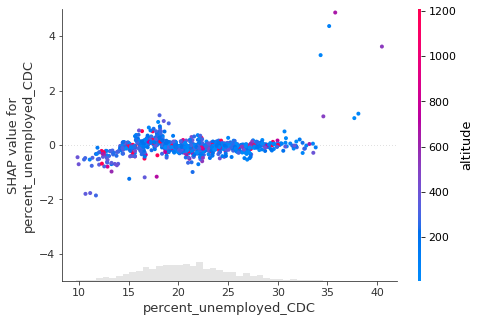


interactions between percent_overcrowding and altitude in urban areas for overall suicide


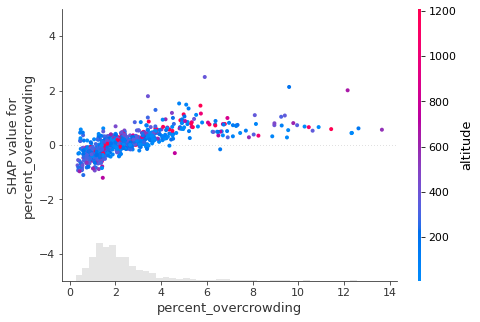


interactions between percent_multi_unit_housing and altitude in urban areas for overall suicide


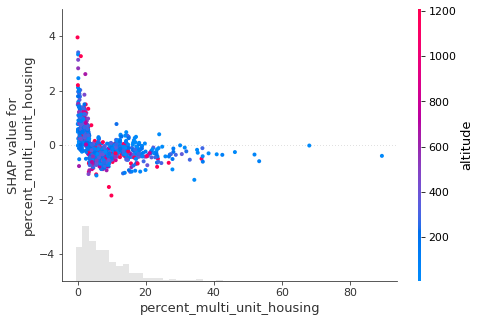


interactions between percent_age_65_and_older and altitude in urban areas for overall suicide


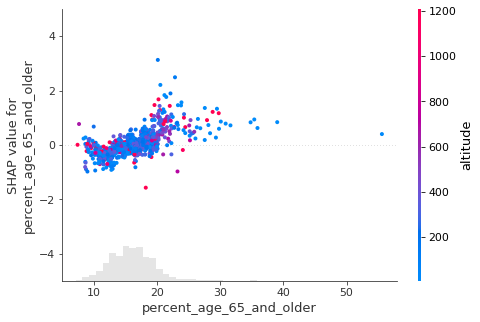


interactions between percent_limited_english_abilities and altitude in urban areas for overall suicide


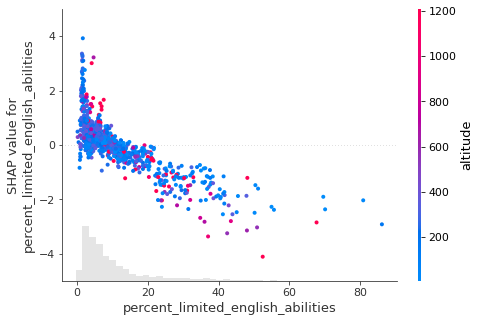


interactions between percent_minorities and altitude in urban areas for overall suicide


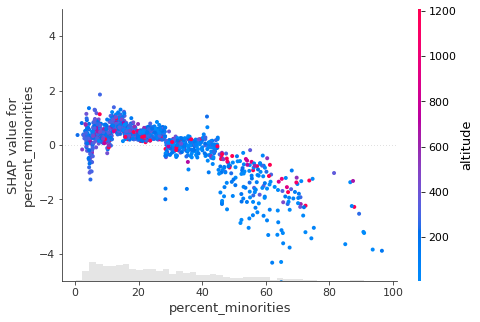


interactions between percent_disabled and altitude in urban areas for overall suicide


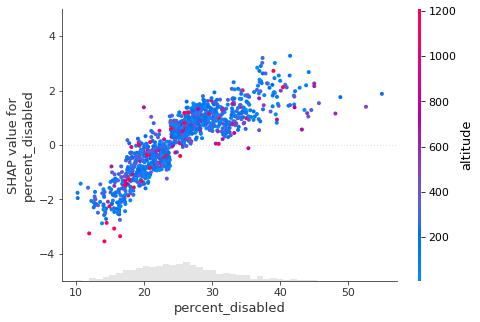


interactions between percent_institutionalized_in_group_quarters and altitude in urban areas for overall suicide


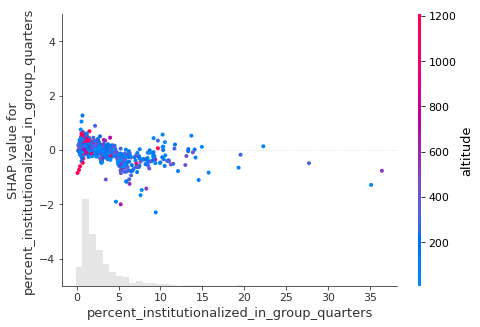


interactions between percent_single_parent_households_CDC and altitude in urban areas for overall suicide


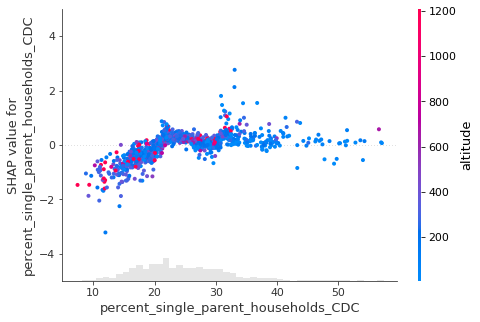


interactions between percent_age_18_to_34 and altitude in urban areas for overall suicide


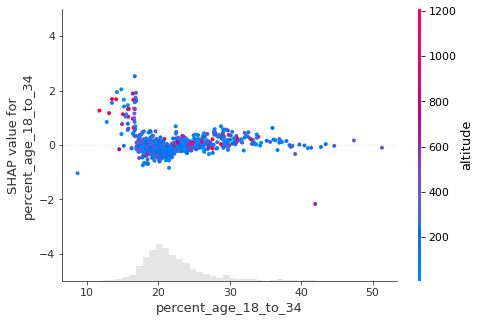


interactions between percent_age_35_to_44 and altitude in urban areas for overall suicide


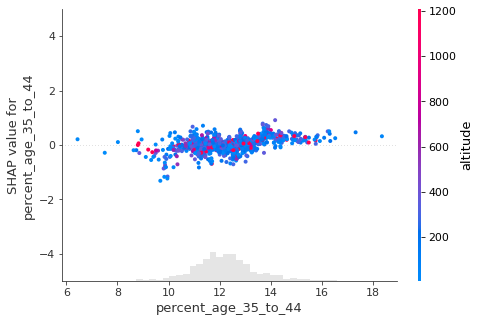


interactions between percent_age_45_to_54 and altitude in urban areas for overall suicide


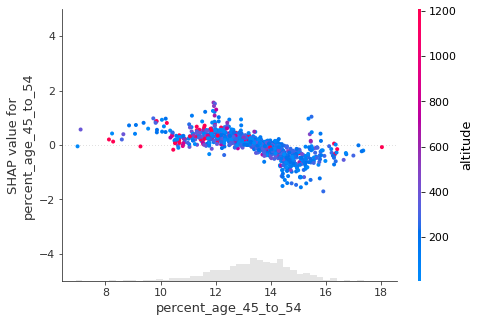


interactions between percent_age_55_to_64 and altitude in urban areas for overall suicide


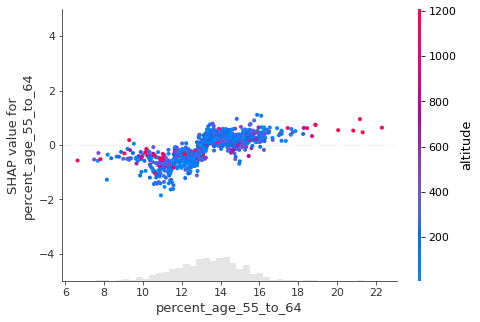

In [103]:
calculateSHAP(overall_social_urban, 'urban areas', 'social factors', 'overall suicide')

### SHAP - climate factors in rural areas for overall suicide 

SHAP Values of climate factors and altitude in rural areas in 1210 counties for overall suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


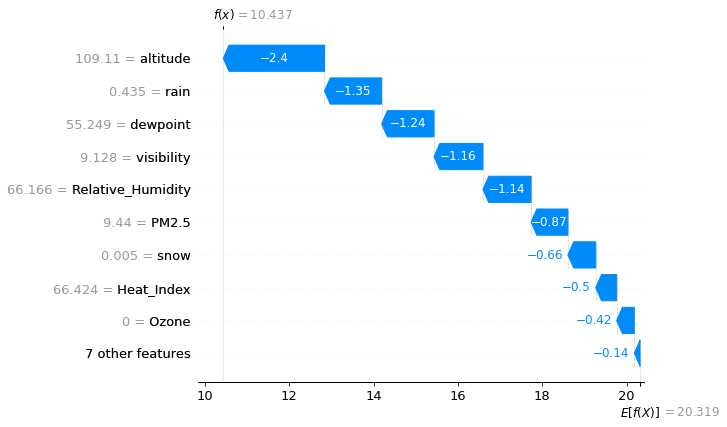


Bar graph to show climate factors in rural areas for overall suicide


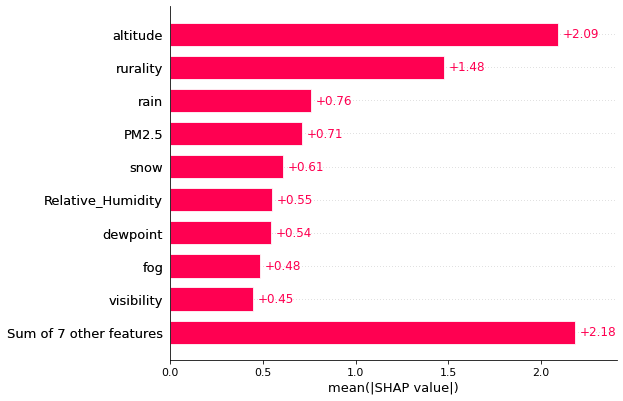


Beeswarm graph to show climate factors in rural areas for overall suicide


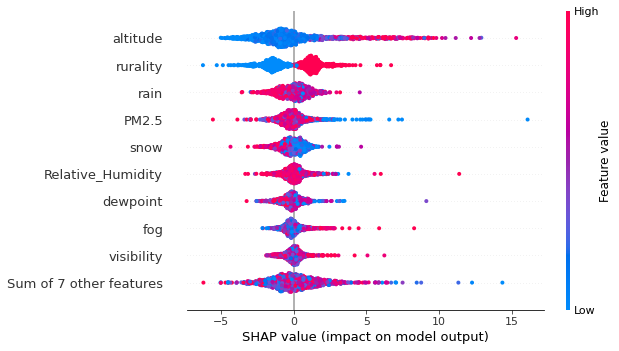


interactions between rurality and altitude in rural areas for overall suicide


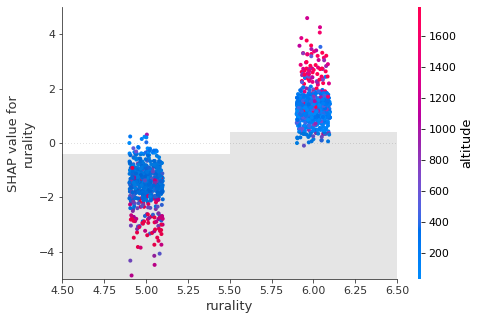


interactions between altitude and rurality in rural areas for overall suicide


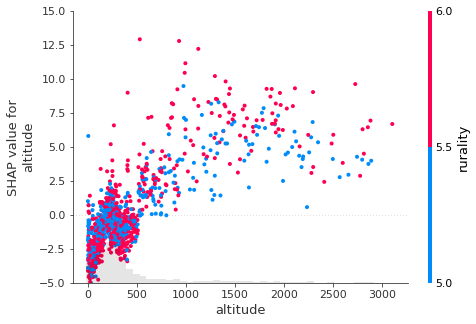


interactions between mean_temp and altitude in rural areas for overall suicide


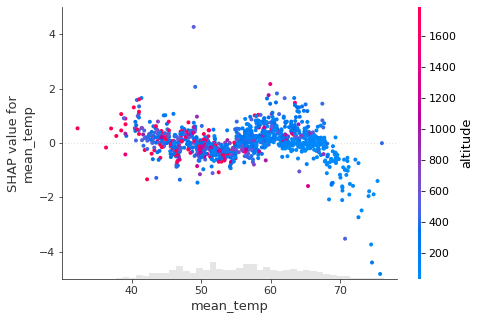


interactions between dewpoint and altitude in rural areas for overall suicide


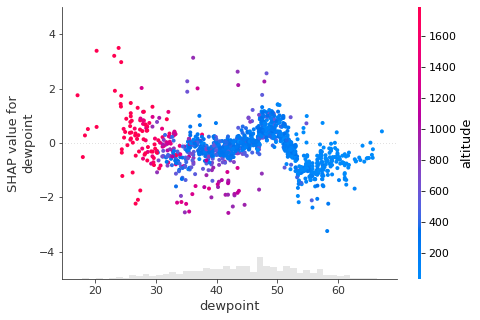


interactions between visibility and altitude in rural areas for overall suicide


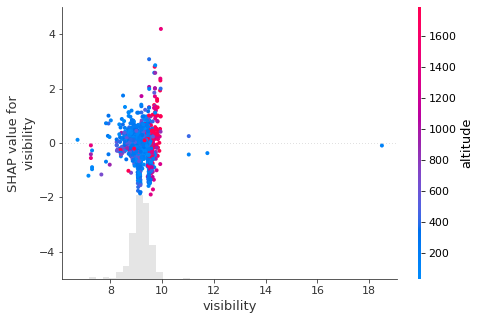


interactions between wind_speed and altitude in rural areas for overall suicide


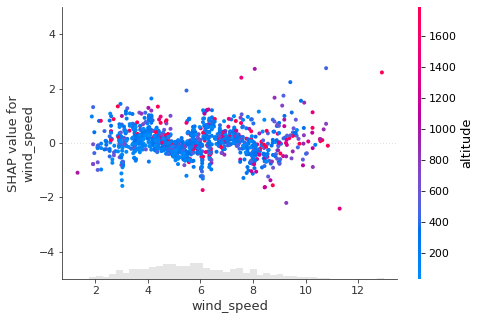


interactions between precipitation and altitude in rural areas for overall suicide


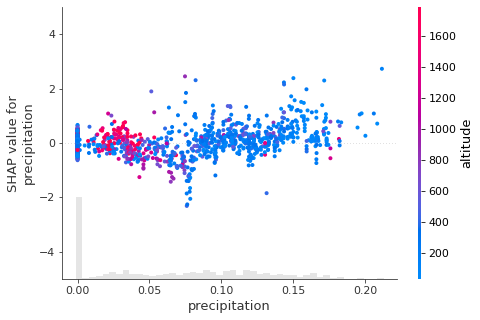


interactions between fog and altitude in rural areas for overall suicide


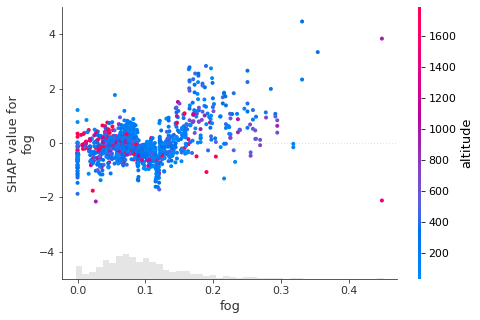


interactions between rain and altitude in rural areas for overall suicide


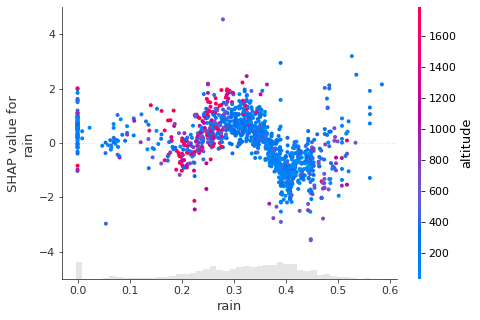


interactions between snow and altitude in rural areas for overall suicide


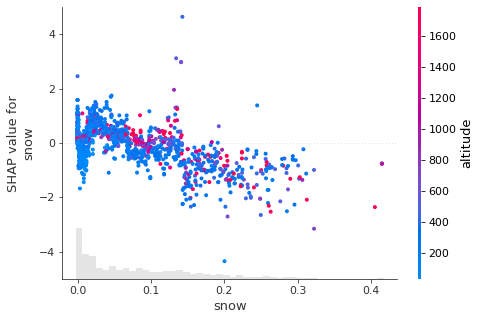


interactions between hail and altitude in rural areas for overall suicide


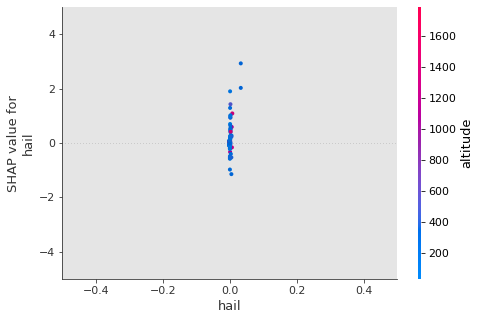


interactions between thunder and altitude in rural areas for overall suicide


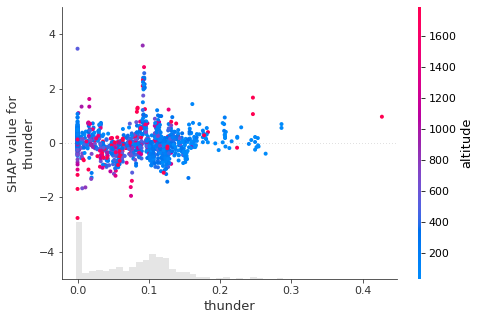


interactions between Relative_Humidity and altitude in rural areas for overall suicide


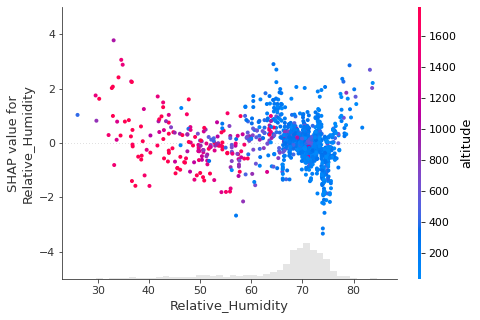


interactions between Heat_Index and altitude in rural areas for overall suicide


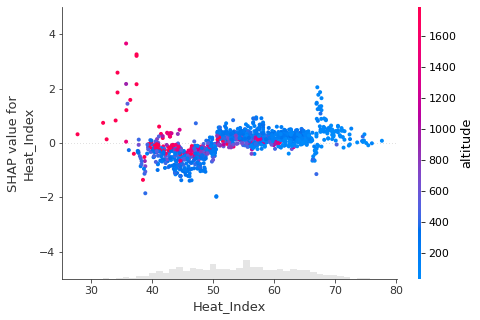


interactions between PM2.5 and altitude in rural areas for overall suicide


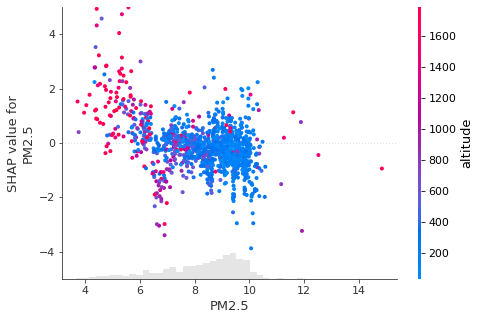


interactions between Ozone and altitude in rural areas for overall suicide


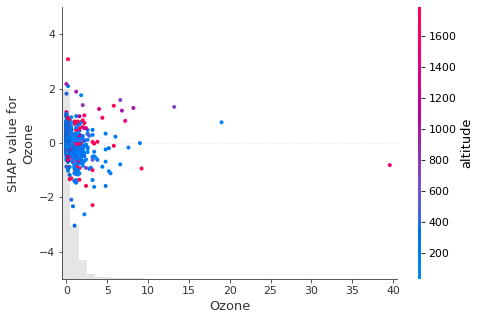

In [104]:
calculateSHAP(overall_climate_rural, 'rural areas', 'climate factors', 'overall suicide')

### SHAP - climate factors in urban areas for overall suicide 

SHAP Values of climate factors and altitude in urban areas in 1032 counties for overall suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


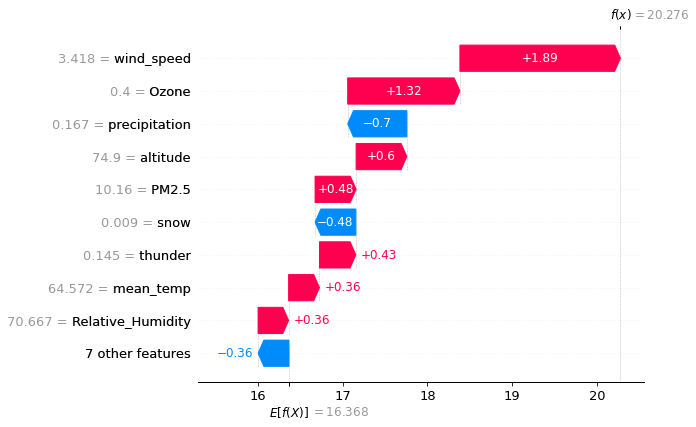


Bar graph to show climate factors in urban areas for overall suicide


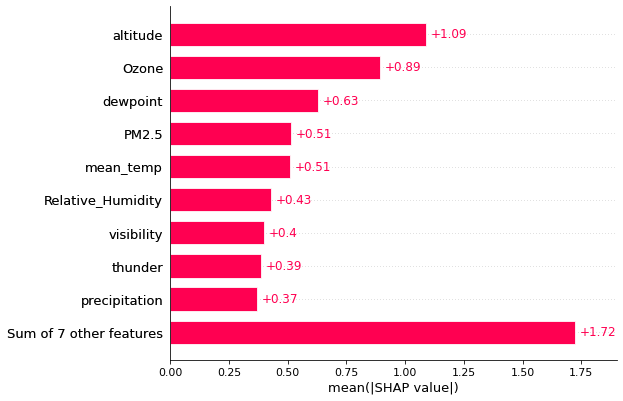


Beeswarm graph to show climate factors in urban areas for overall suicide


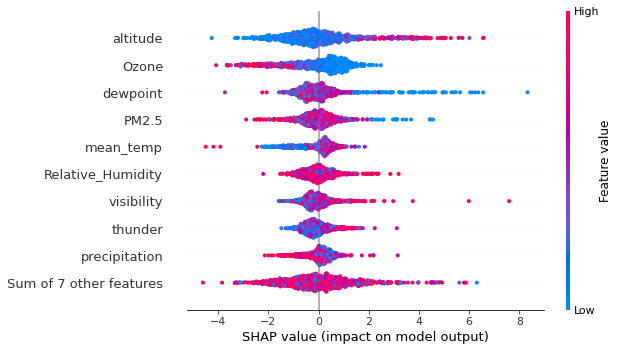


interactions between rurality and altitude in urban areas for overall suicide


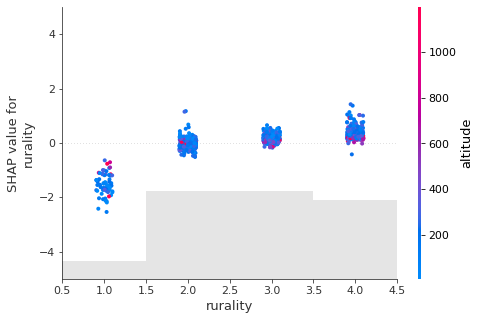


interactions between altitude and rurality in urban areas for overall suicide


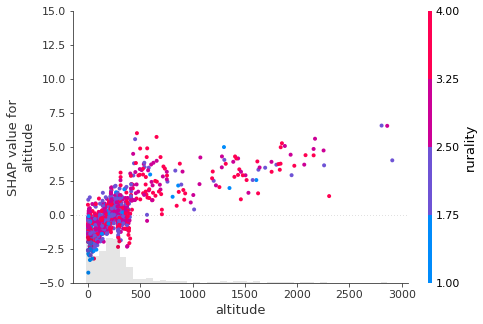


interactions between mean_temp and altitude in urban areas for overall suicide


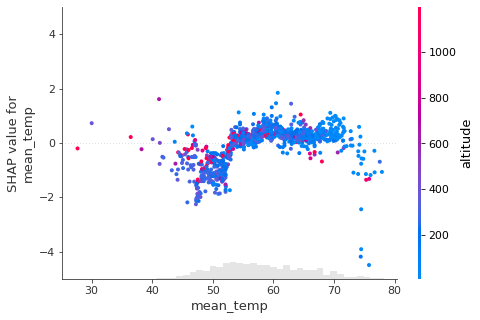


interactions between dewpoint and altitude in urban areas for overall suicide


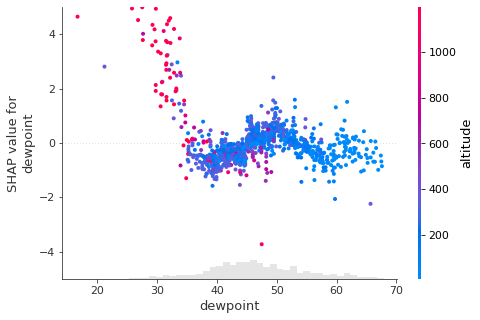


interactions between visibility and altitude in urban areas for overall suicide


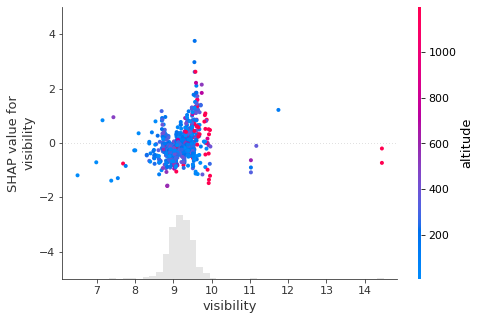


interactions between wind_speed and altitude in urban areas for overall suicide


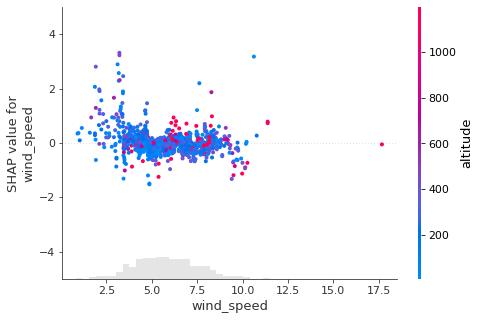


interactions between precipitation and altitude in urban areas for overall suicide


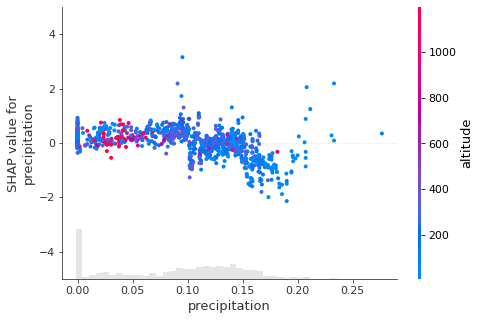


interactions between fog and altitude in urban areas for overall suicide


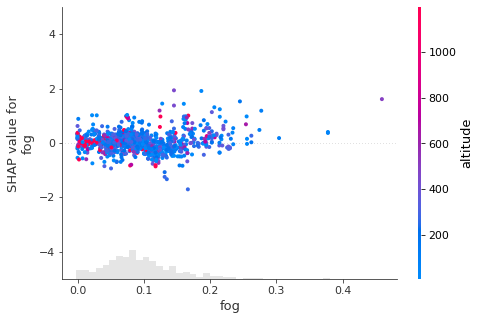


interactions between rain and altitude in urban areas for overall suicide


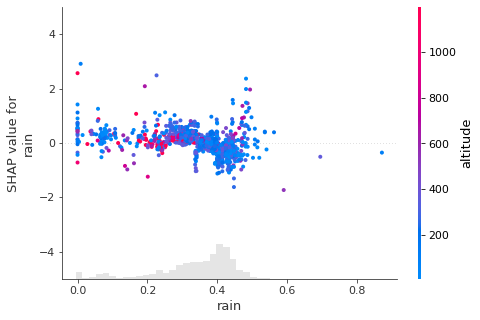


interactions between snow and altitude in urban areas for overall suicide


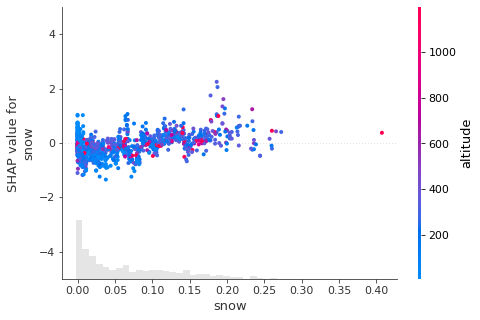


interactions between hail and altitude in urban areas for overall suicide


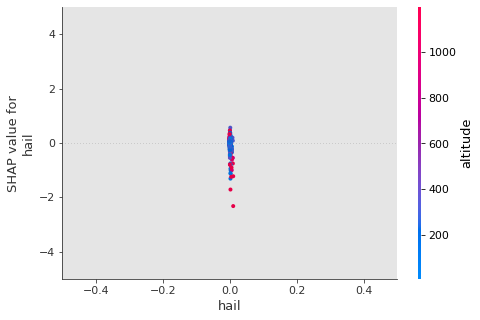


interactions between thunder and altitude in urban areas for overall suicide


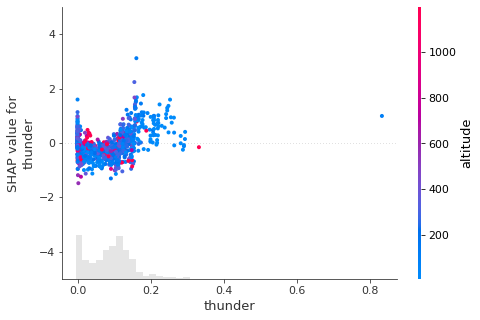


interactions between Relative_Humidity and altitude in urban areas for overall suicide


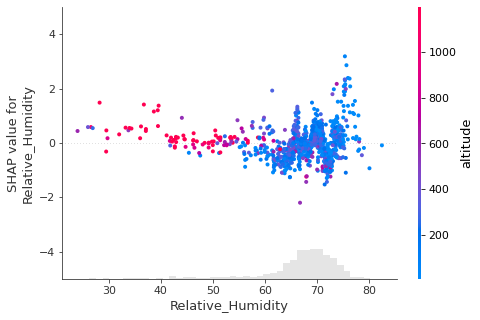


interactions between Heat_Index and altitude in urban areas for overall suicide


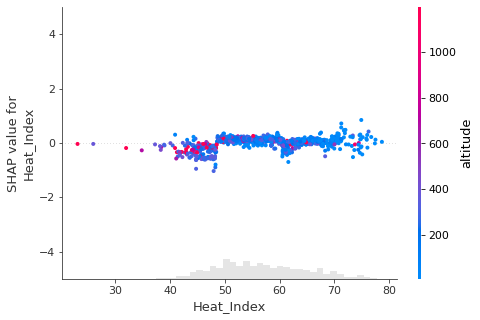


interactions between PM2.5 and altitude in urban areas for overall suicide


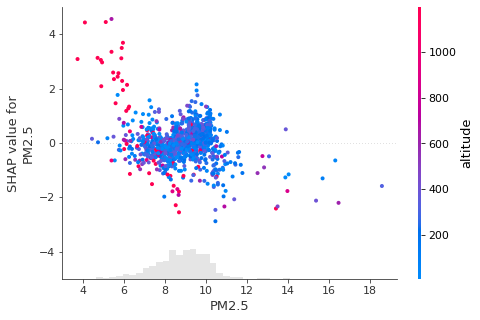


interactions between Ozone and altitude in urban areas for overall suicide


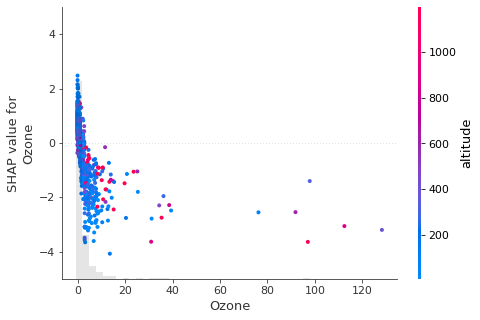

In [105]:
calculateSHAP(overall_climate_urban, 'urban areas', 'climate factors', 'overall suicide')

### SHAP - social economic  factors in rural areas for firearm suicide 

SHAP Values of social factors and altitude in rural areas in 956 counties for firearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


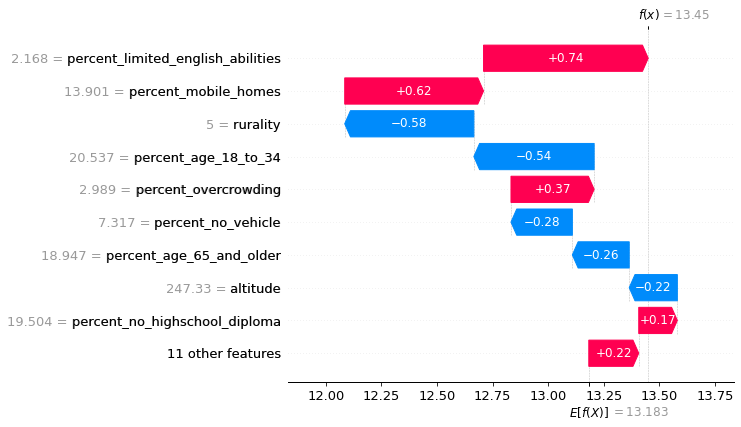


Bar graph to show social factors in rural areas for firearm suicide


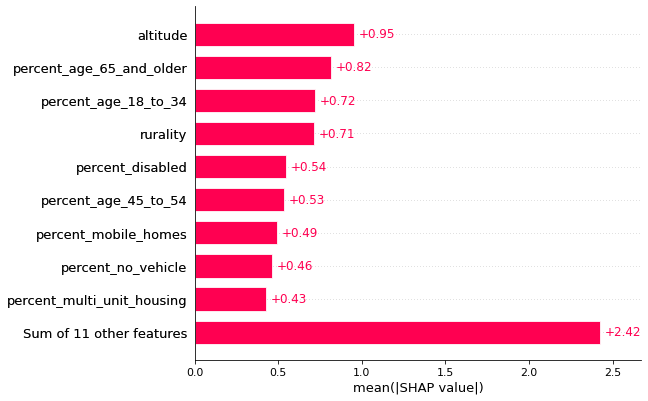


Beeswarm graph to show social factors in rural areas for firearm suicide


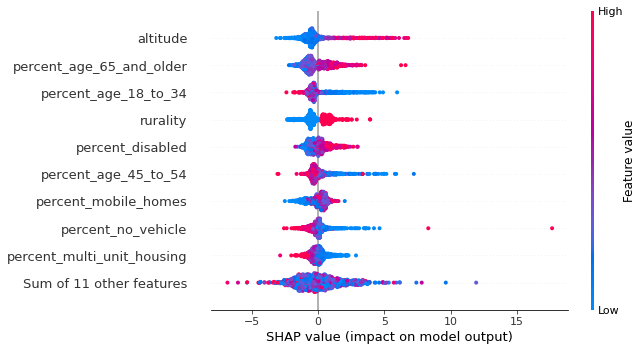


interactions between rurality and altitude in rural areas for firearm suicide


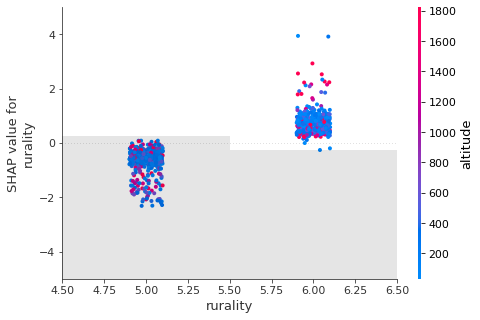


interactions between altitude and rurality in rural areas for firearm suicide


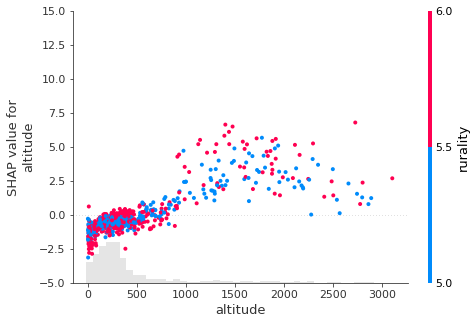


interactions between per_capita_income and altitude in rural areas for firearm suicide


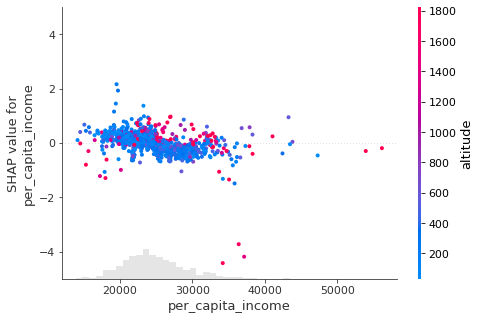


interactions between percent_below_poverty and altitude in rural areas for firearm suicide


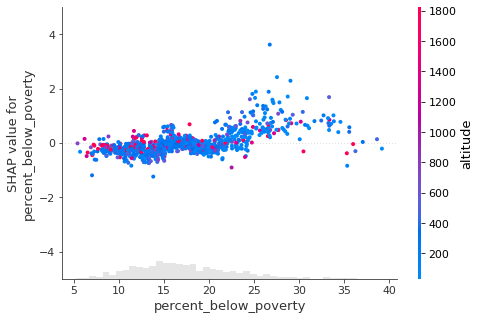


interactions between percent_no_highschool_diploma and altitude in rural areas for firearm suicide


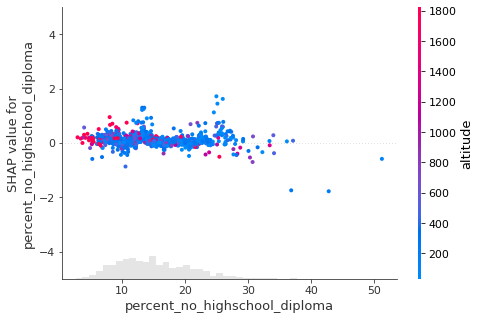


interactions between percent_mobile_homes and altitude in rural areas for firearm suicide


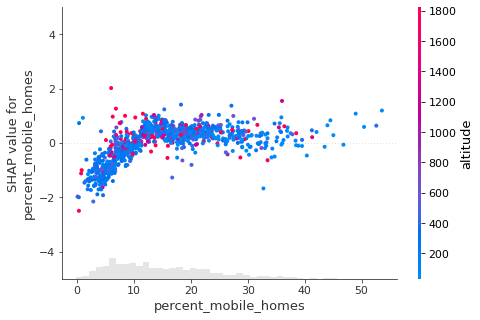


interactions between percent_no_vehicle and altitude in rural areas for firearm suicide


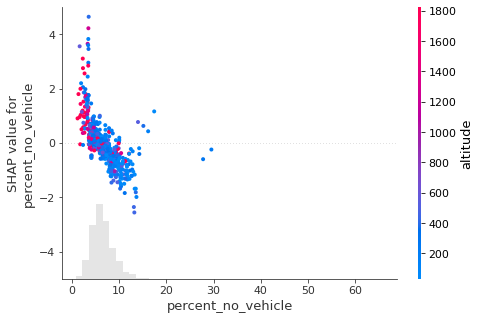


interactions between percent_unemployed_CDC and altitude in rural areas for firearm suicide


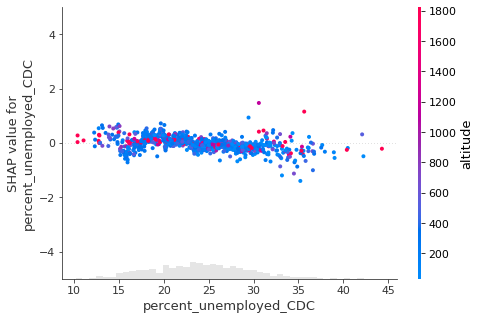


interactions between percent_overcrowding and altitude in rural areas for firearm suicide


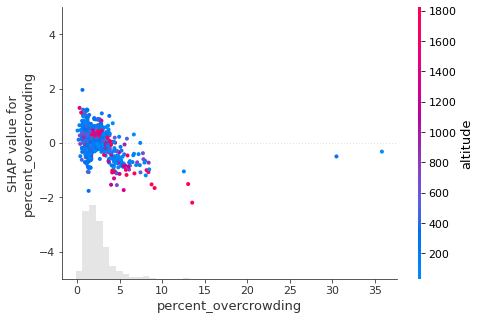


interactions between percent_multi_unit_housing and altitude in rural areas for firearm suicide


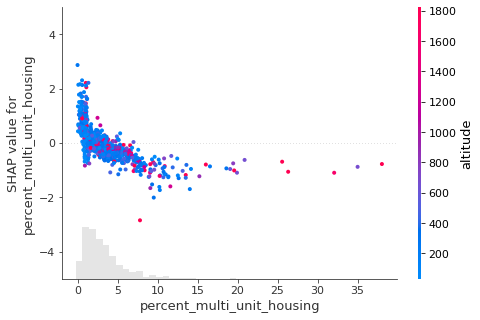


interactions between percent_age_65_and_older and altitude in rural areas for firearm suicide


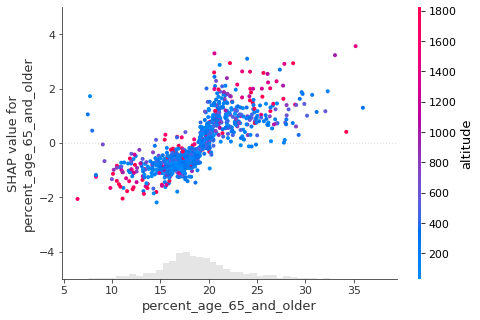


interactions between percent_limited_english_abilities and altitude in rural areas for firearm suicide


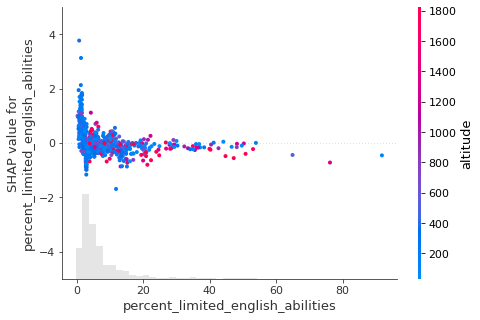


interactions between percent_minorities and altitude in rural areas for firearm suicide


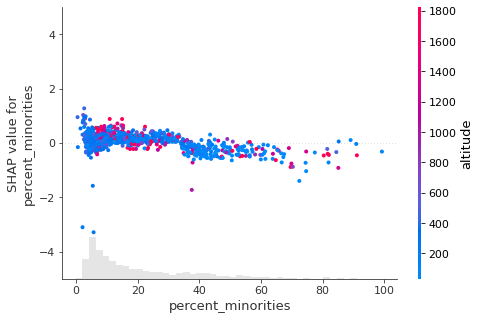


interactions between percent_disabled and altitude in rural areas for firearm suicide


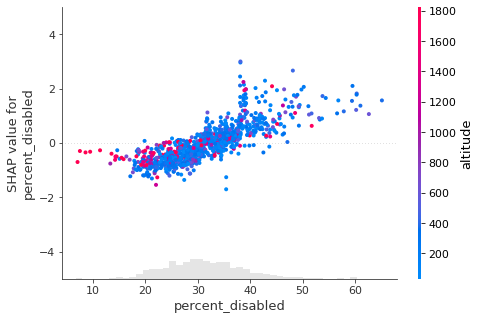


interactions between percent_institutionalized_in_group_quarters and altitude in rural areas for firearm suicide


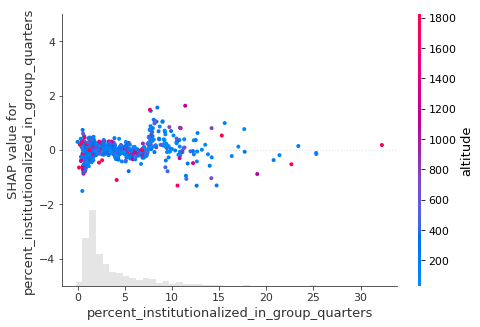


interactions between percent_single_parent_households_CDC and altitude in rural areas for firearm suicide


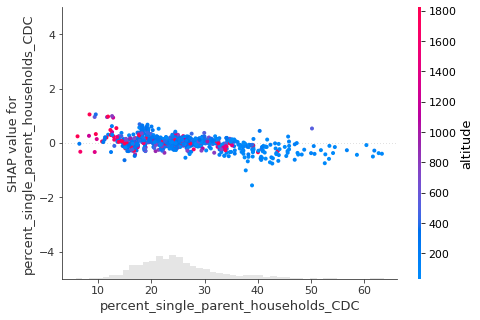


interactions between percent_age_18_to_34 and altitude in rural areas for firearm suicide


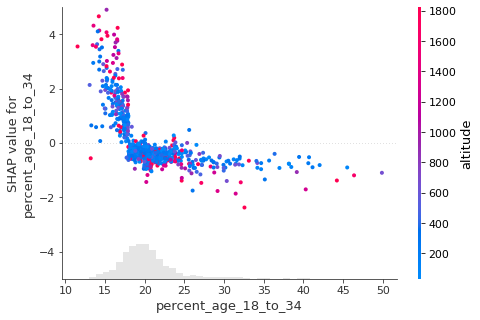


interactions between percent_age_35_to_44 and altitude in rural areas for firearm suicide


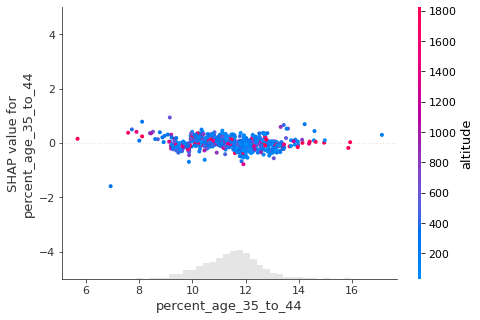


interactions between percent_age_45_to_54 and altitude in rural areas for firearm suicide


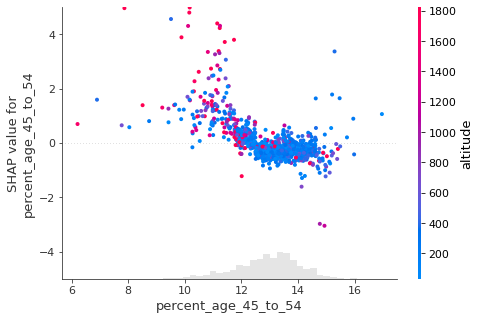


interactions between percent_age_55_to_64 and altitude in rural areas for firearm suicide


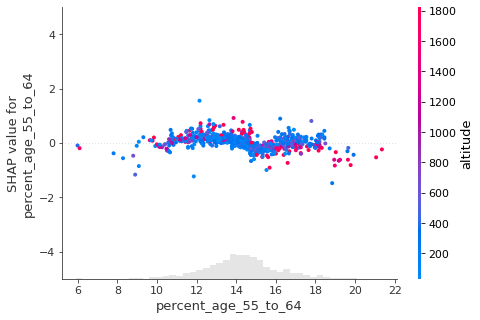

In [106]:
calculateSHAP(firearm_social_rural, 'rural areas', 'social factors', 'firearm suicide')

### SHAP - social economic factors in urban areas for firearm suicide 

SHAP Values of social factors and altitude in urban areas in 992 counties for firearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


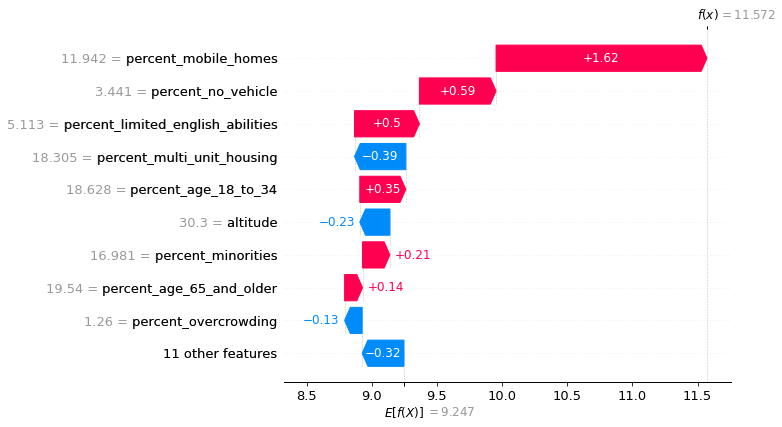


Bar graph to show social factors in urban areas for firearm suicide


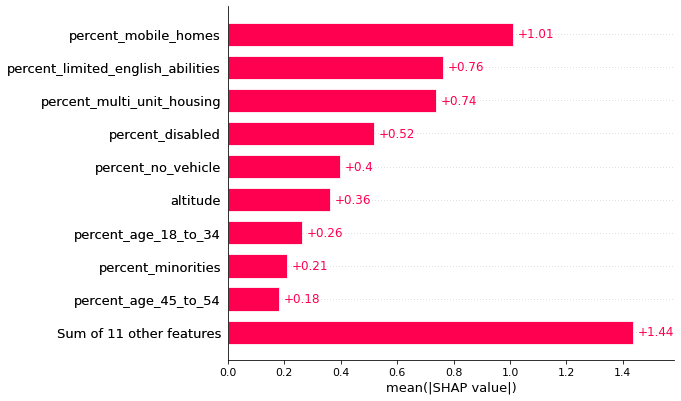


Beeswarm graph to show social factors in urban areas for firearm suicide


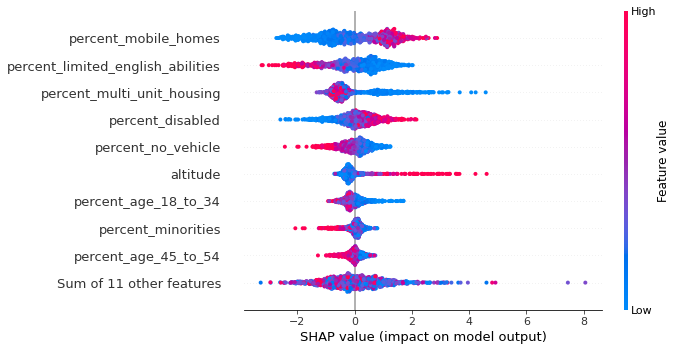


interactions between rurality and altitude in urban areas for firearm suicide


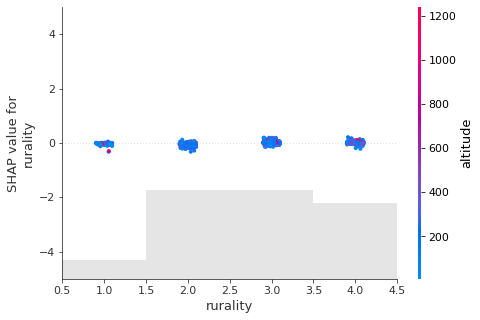


interactions between altitude and rurality in urban areas for firearm suicide


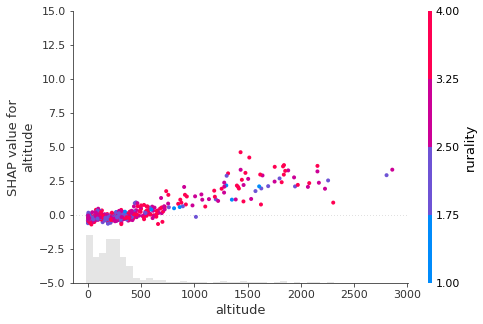


interactions between per_capita_income and altitude in urban areas for firearm suicide


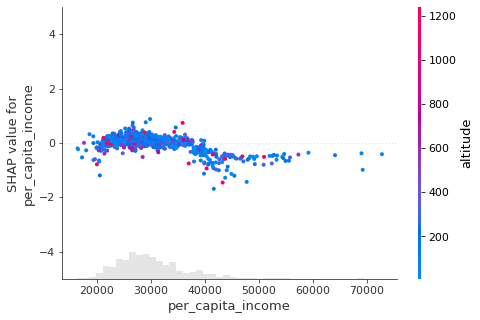


interactions between percent_below_poverty and altitude in urban areas for firearm suicide


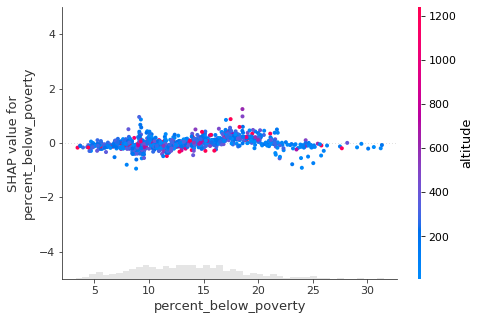


interactions between percent_no_highschool_diploma and altitude in urban areas for firearm suicide


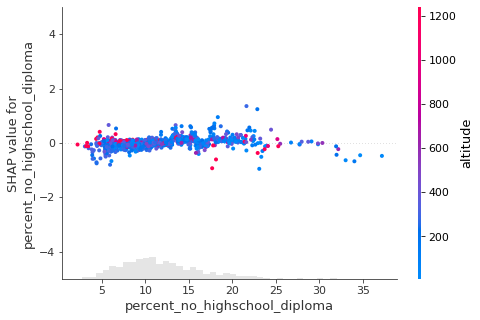


interactions between percent_mobile_homes and altitude in urban areas for firearm suicide


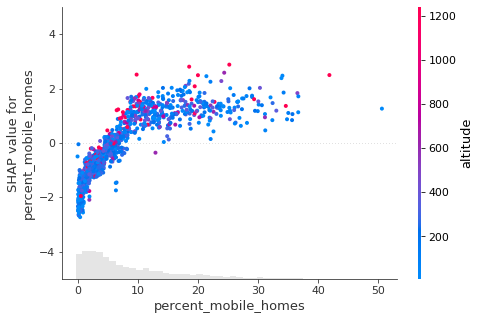


interactions between percent_no_vehicle and altitude in urban areas for firearm suicide


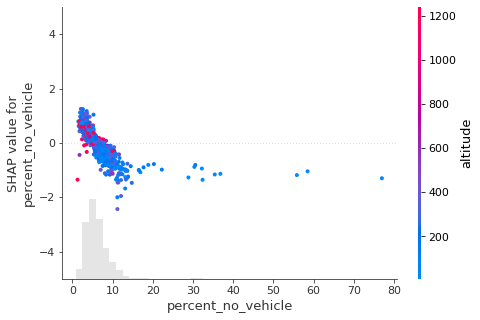


interactions between percent_unemployed_CDC and altitude in urban areas for firearm suicide


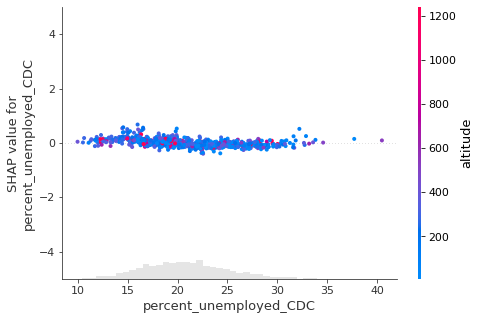


interactions between percent_overcrowding and altitude in urban areas for firearm suicide


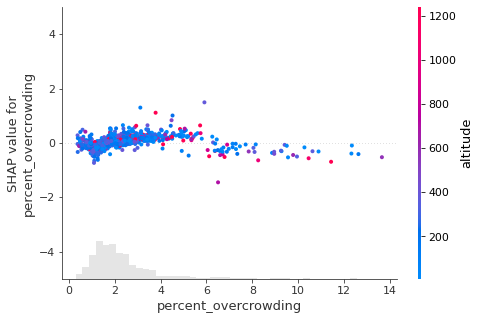


interactions between percent_multi_unit_housing and altitude in urban areas for firearm suicide


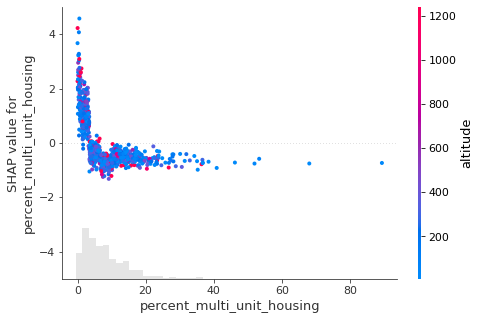


interactions between percent_age_65_and_older and altitude in urban areas for firearm suicide


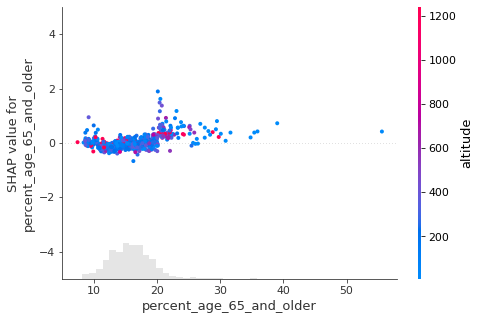


interactions between percent_limited_english_abilities and altitude in urban areas for firearm suicide


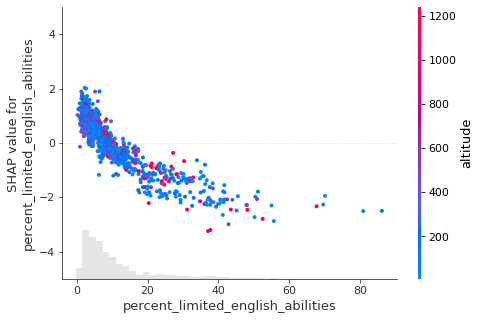


interactions between percent_minorities and altitude in urban areas for firearm suicide


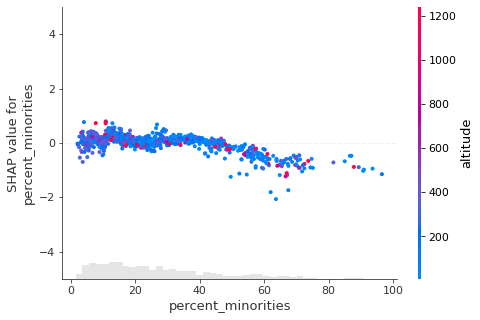


interactions between percent_disabled and altitude in urban areas for firearm suicide


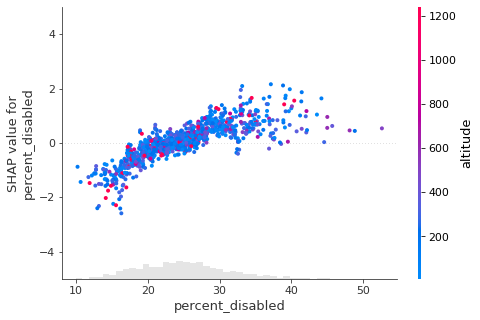


interactions between percent_institutionalized_in_group_quarters and altitude in urban areas for firearm suicide


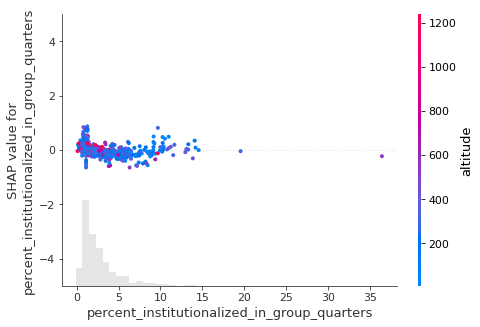


interactions between percent_single_parent_households_CDC and altitude in urban areas for firearm suicide


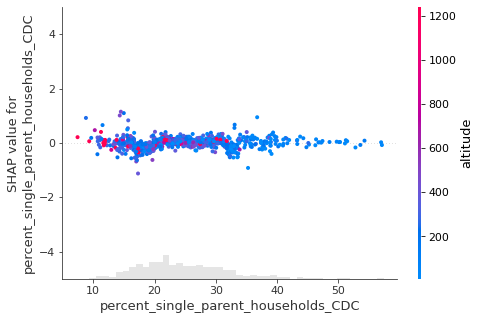


interactions between percent_age_18_to_34 and altitude in urban areas for firearm suicide


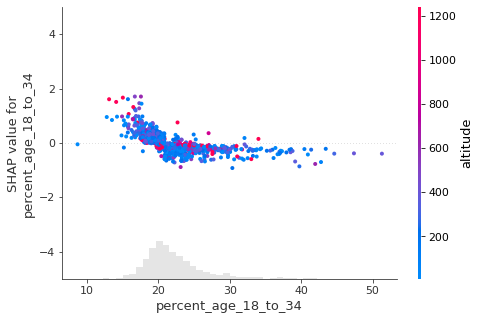


interactions between percent_age_35_to_44 and altitude in urban areas for firearm suicide


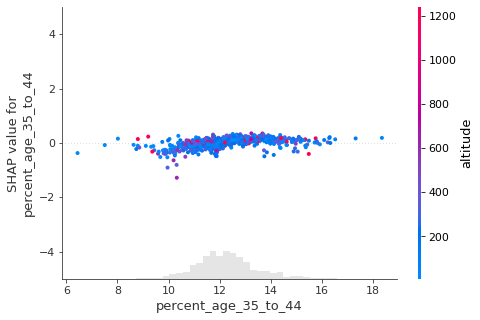


interactions between percent_age_45_to_54 and altitude in urban areas for firearm suicide


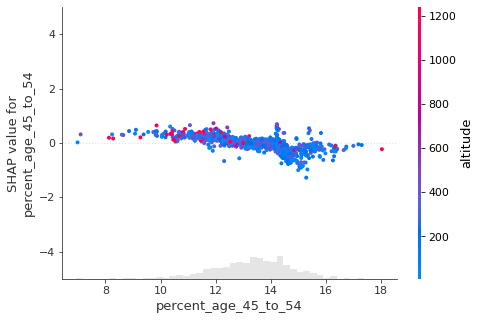


interactions between percent_age_55_to_64 and altitude in urban areas for firearm suicide


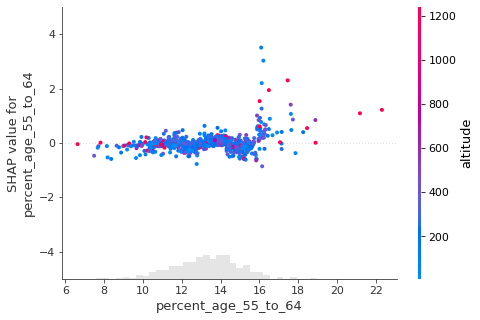

In [107]:
calculateSHAP(firearm_social_urban, 'urban areas', 'social factors', 'firearm suicide')

### SHAP - climate factors in rural areas for firearm suicide 

SHAP Values of climate factors and altitude in rural areas in 900 counties for firearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


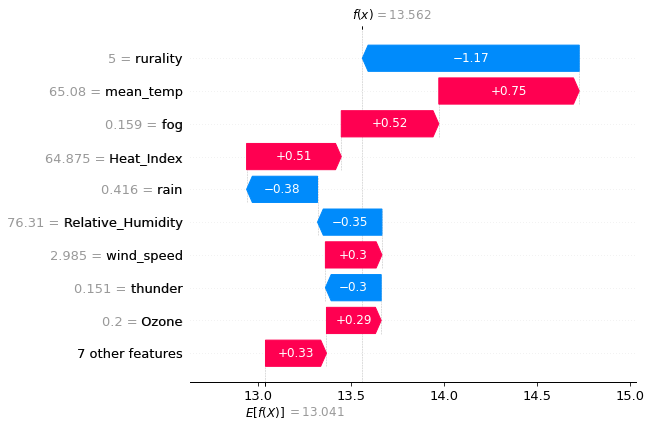


Bar graph to show climate factors in rural areas for firearm suicide


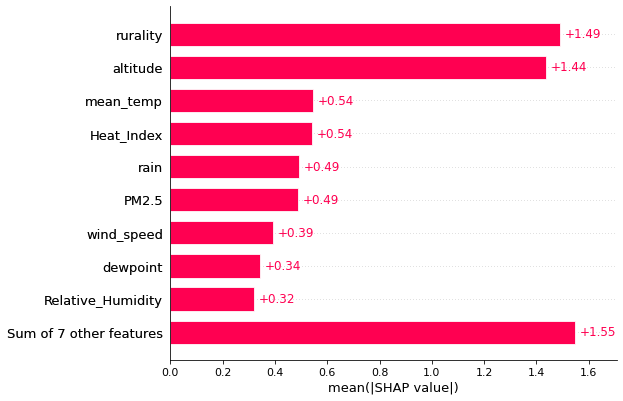


Beeswarm graph to show climate factors in rural areas for firearm suicide


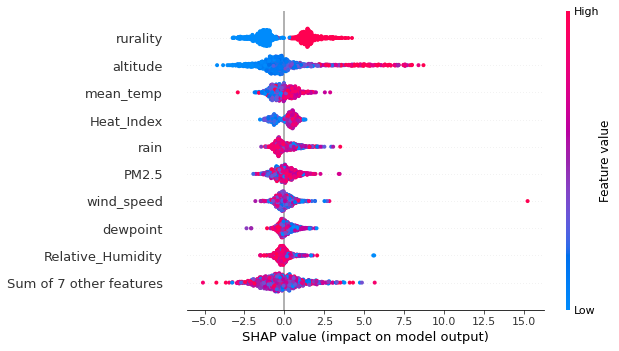


interactions between rurality and altitude in rural areas for firearm suicide


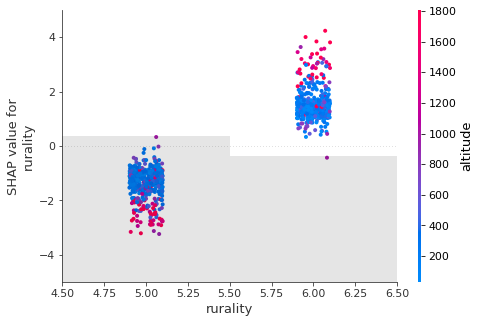


interactions between altitude and rurality in rural areas for firearm suicide


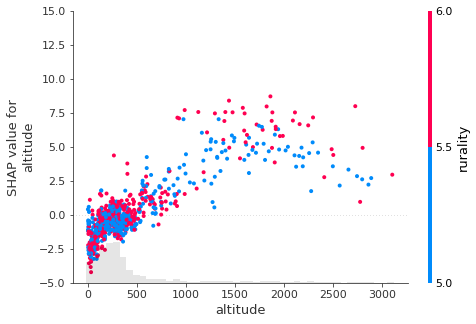


interactions between mean_temp and altitude in rural areas for firearm suicide


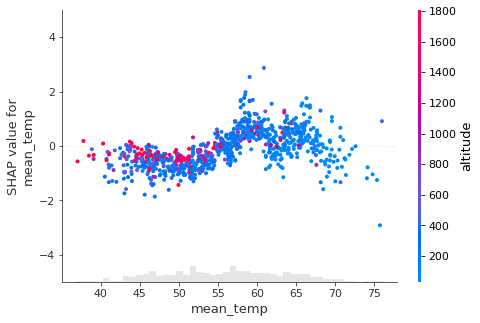


interactions between dewpoint and altitude in rural areas for firearm suicide


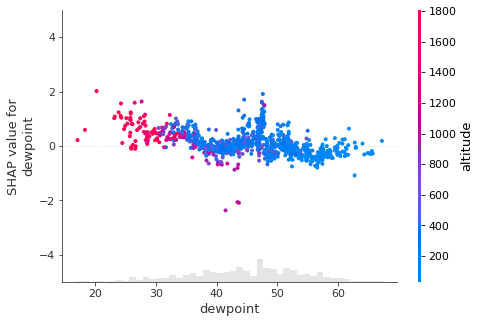


interactions between visibility and altitude in rural areas for firearm suicide


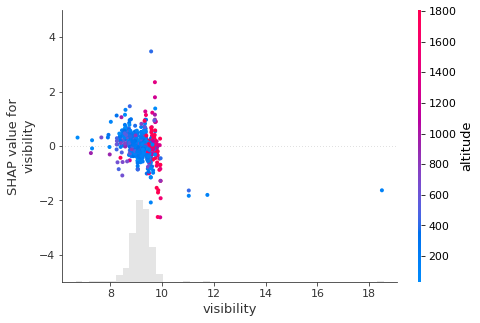


interactions between wind_speed and altitude in rural areas for firearm suicide


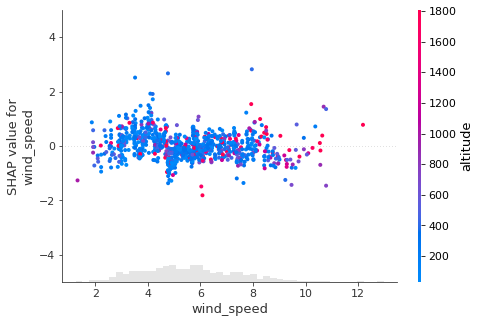


interactions between precipitation and altitude in rural areas for firearm suicide


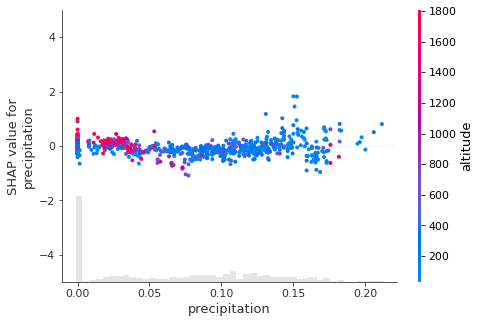


interactions between fog and altitude in rural areas for firearm suicide


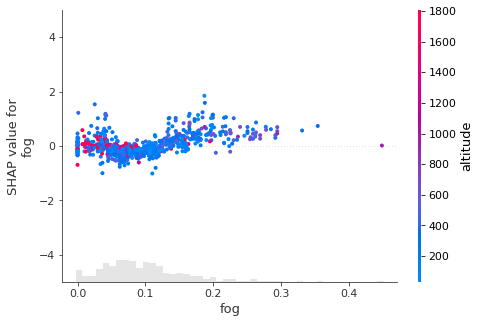


interactions between rain and altitude in rural areas for firearm suicide


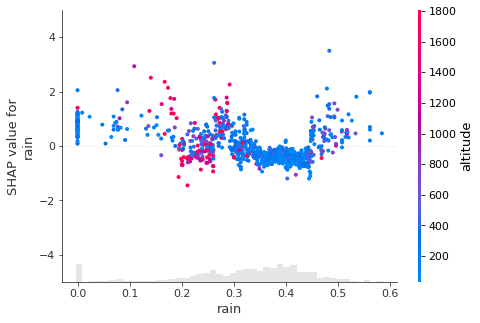


interactions between snow and altitude in rural areas for firearm suicide


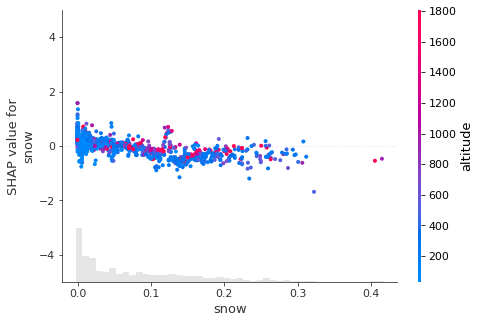


interactions between hail and altitude in rural areas for firearm suicide


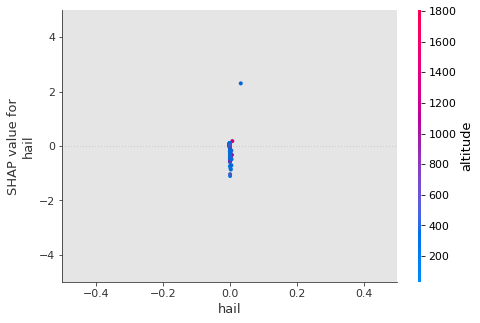


interactions between thunder and altitude in rural areas for firearm suicide


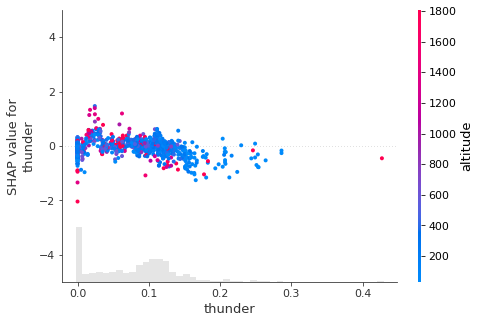


interactions between Relative_Humidity and altitude in rural areas for firearm suicide


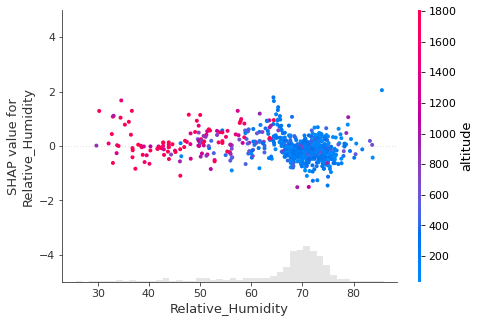


interactions between Heat_Index and altitude in rural areas for firearm suicide


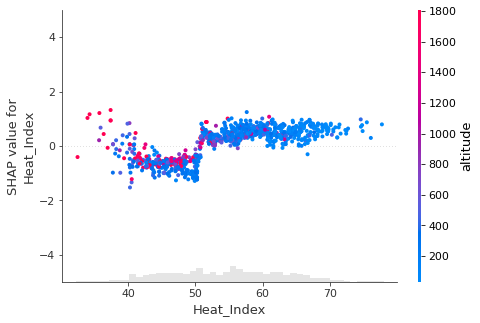


interactions between PM2.5 and altitude in rural areas for firearm suicide


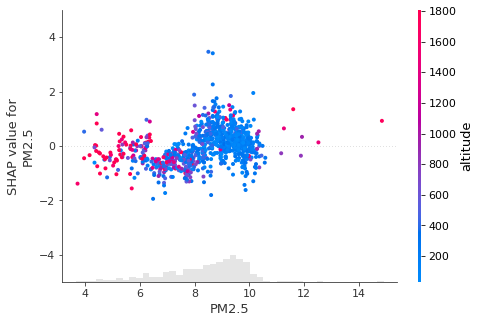


interactions between Ozone and altitude in rural areas for firearm suicide


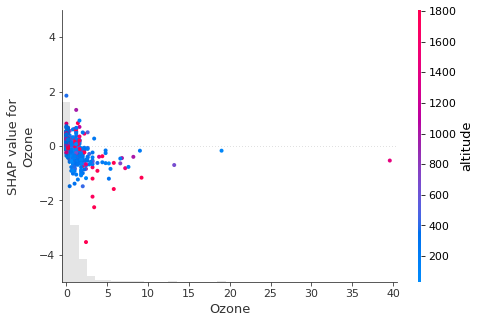

In [108]:
calculateSHAP(firearm_climate_rural, 'rural areas', 'climate factors', 'firearm suicide')

### SHAP - climate factors in urban areas for firearm suicide 

SHAP Values of climate factors and altitude in urban areas in 952 counties for firearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


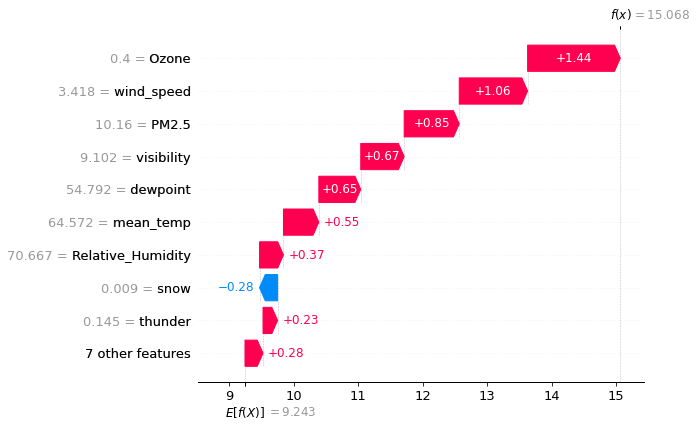


Bar graph to show climate factors in urban areas for firearm suicide


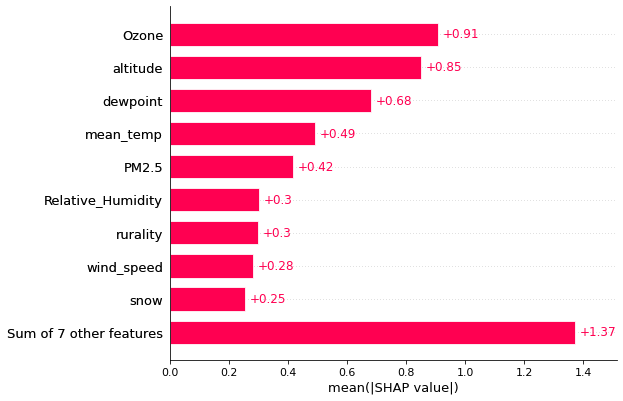


Beeswarm graph to show climate factors in urban areas for firearm suicide


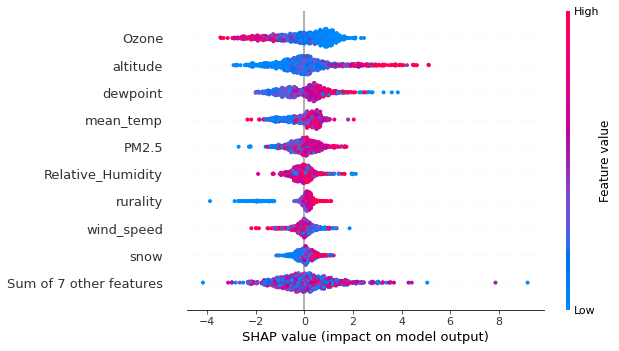


interactions between rurality and altitude in urban areas for firearm suicide


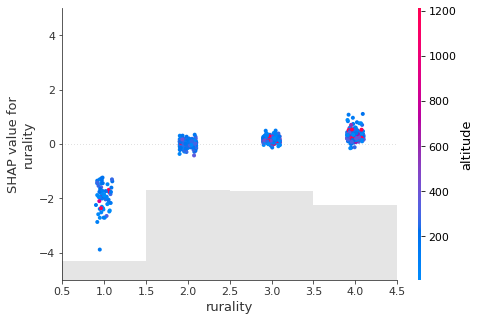


interactions between altitude and rurality in urban areas for firearm suicide


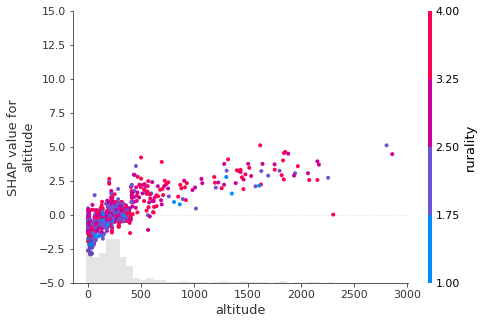


interactions between mean_temp and altitude in urban areas for firearm suicide


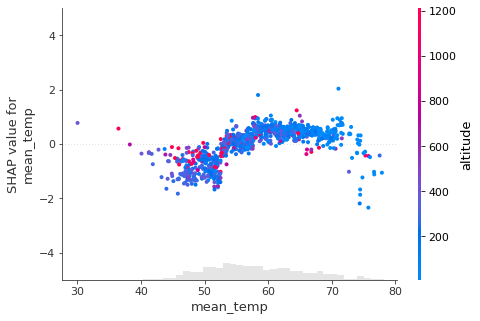


interactions between dewpoint and altitude in urban areas for firearm suicide


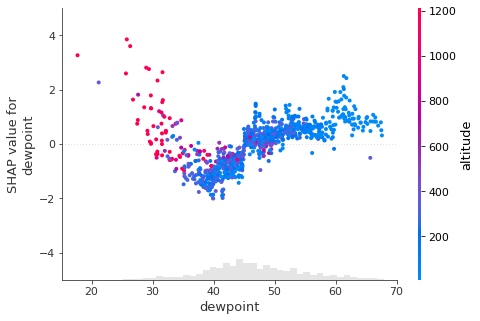


interactions between visibility and altitude in urban areas for firearm suicide


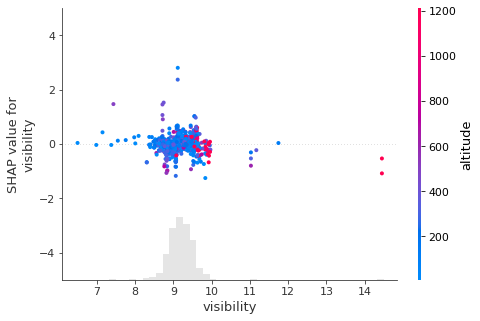


interactions between wind_speed and altitude in urban areas for firearm suicide


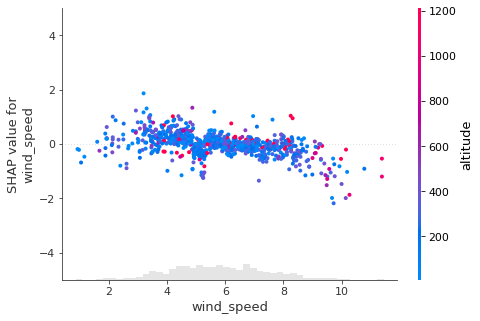


interactions between precipitation and altitude in urban areas for firearm suicide


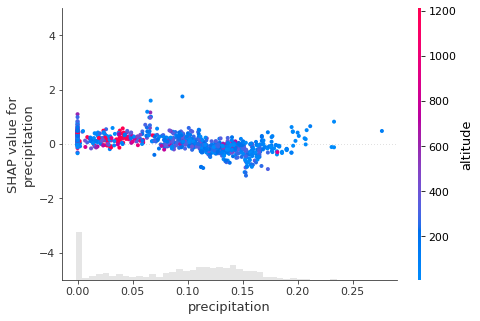


interactions between fog and altitude in urban areas for firearm suicide


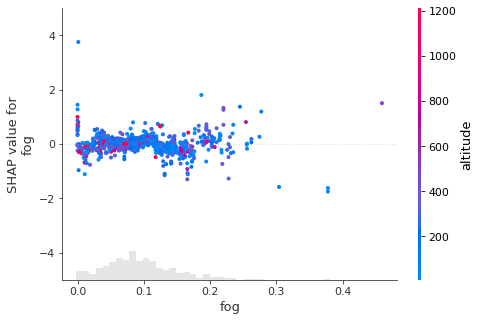


interactions between rain and altitude in urban areas for firearm suicide


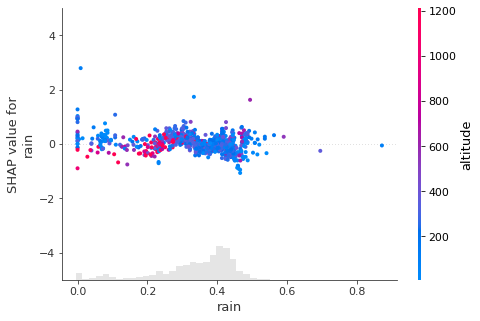


interactions between snow and altitude in urban areas for firearm suicide


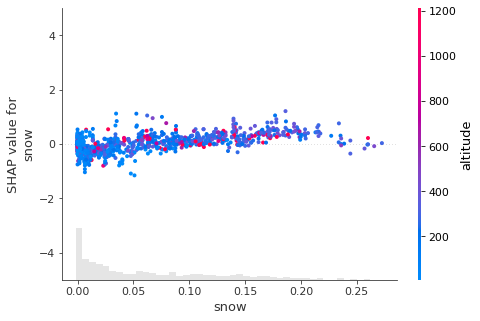


interactions between hail and altitude in urban areas for firearm suicide


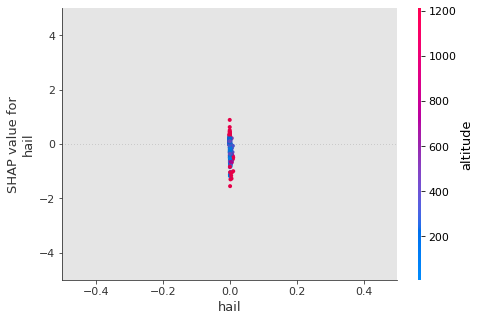


interactions between thunder and altitude in urban areas for firearm suicide


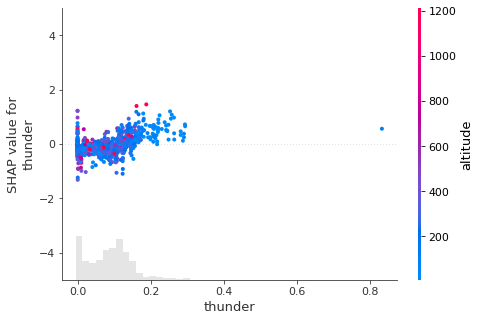


interactions between Relative_Humidity and altitude in urban areas for firearm suicide


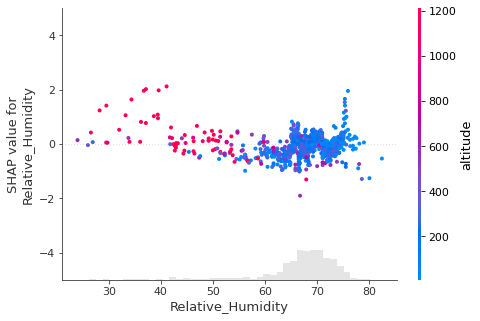


interactions between Heat_Index and altitude in urban areas for firearm suicide


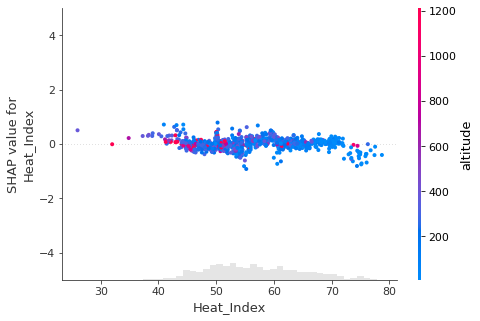


interactions between PM2.5 and altitude in urban areas for firearm suicide


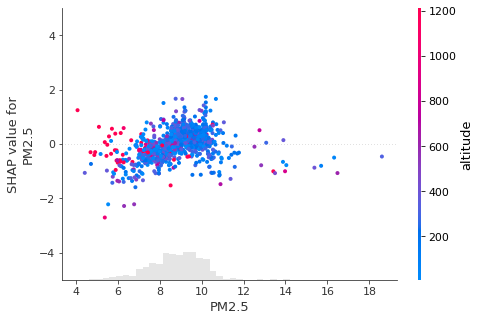


interactions between Ozone and altitude in urban areas for firearm suicide


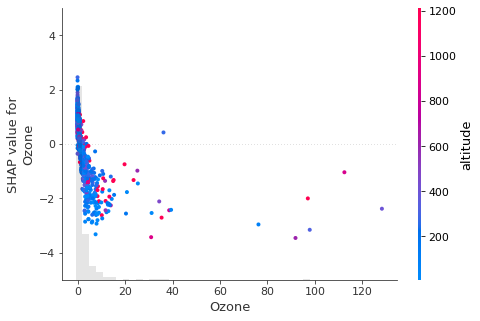

In [109]:
calculateSHAP(firearm_climate_urban, 'urban areas', 'climate factors', 'firearm suicide')

### SHAP - social factors in rural areas for nonfirearm suicide 

SHAP Values of social factors and altitude in rural areas in 956 counties for nonfirearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


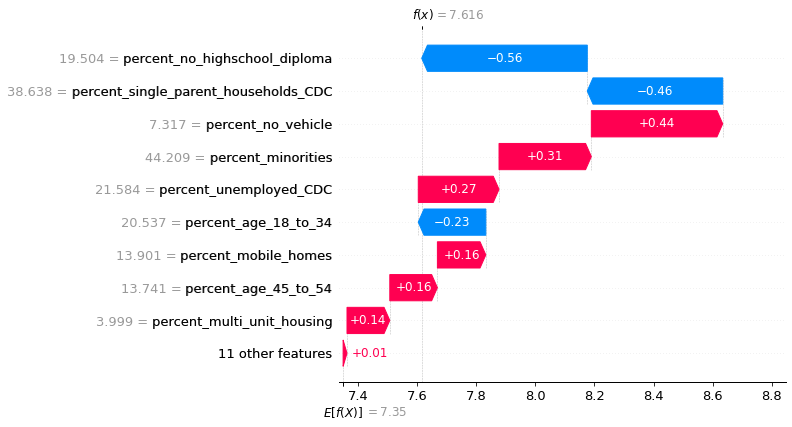


Bar graph to show social factors in rural areas for nonfirearm suicide


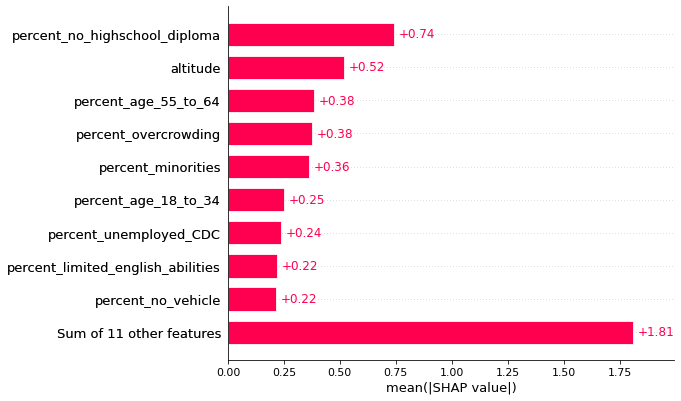


Beeswarm graph to show social factors in rural areas for nonfirearm suicide


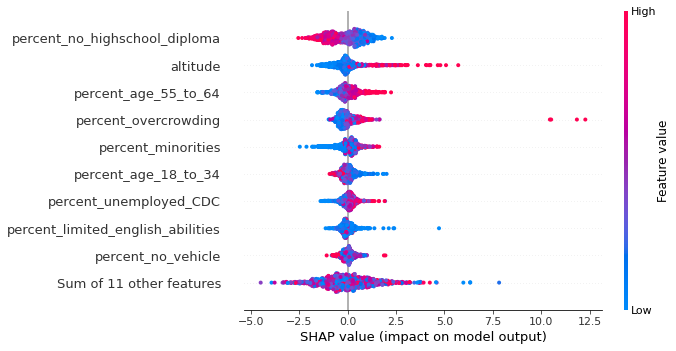


interactions between rurality and altitude in rural areas for nonfirearm suicide


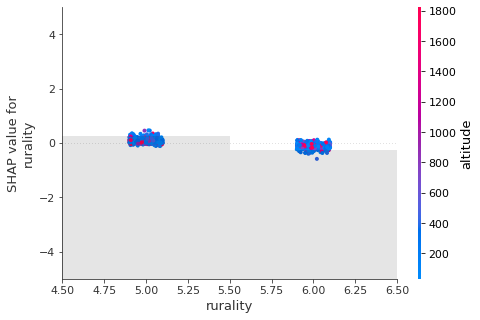


interactions between altitude and rurality in rural areas for nonfirearm suicide


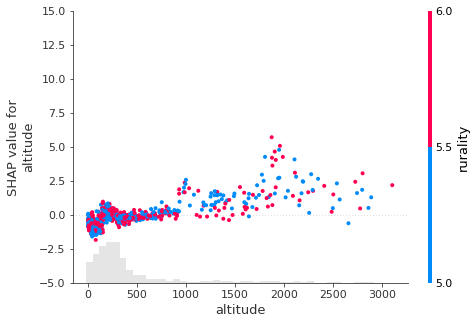


interactions between per_capita_income and altitude in rural areas for nonfirearm suicide


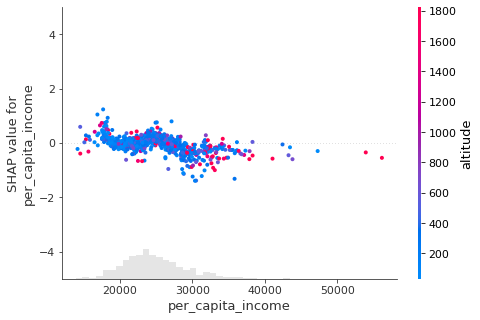


interactions between percent_below_poverty and altitude in rural areas for nonfirearm suicide


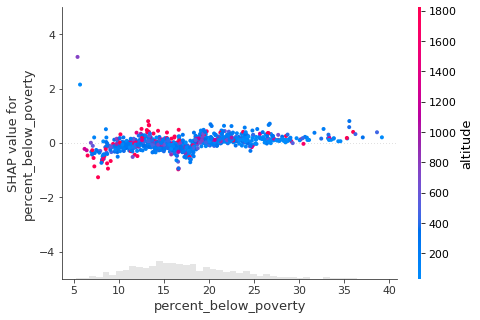


interactions between percent_no_highschool_diploma and altitude in rural areas for nonfirearm suicide


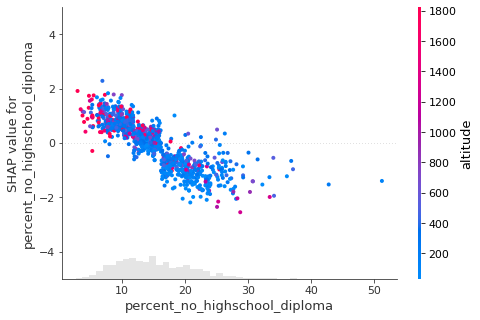


interactions between percent_mobile_homes and altitude in rural areas for nonfirearm suicide


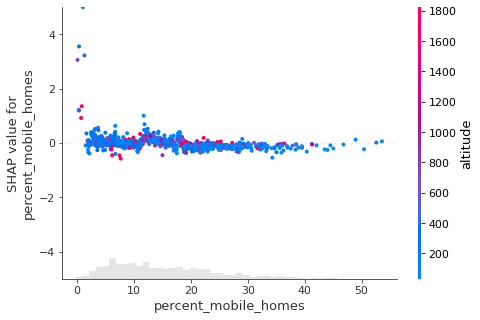


interactions between percent_no_vehicle and altitude in rural areas for nonfirearm suicide


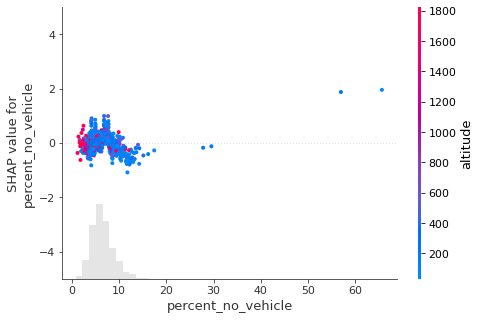


interactions between percent_unemployed_CDC and altitude in rural areas for nonfirearm suicide


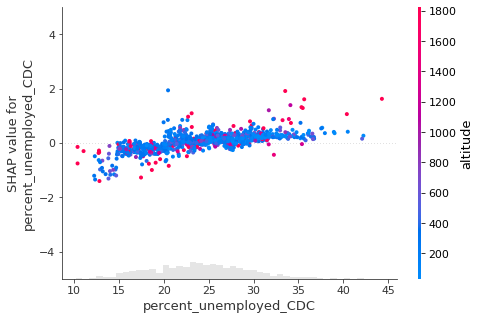


interactions between percent_overcrowding and altitude in rural areas for nonfirearm suicide


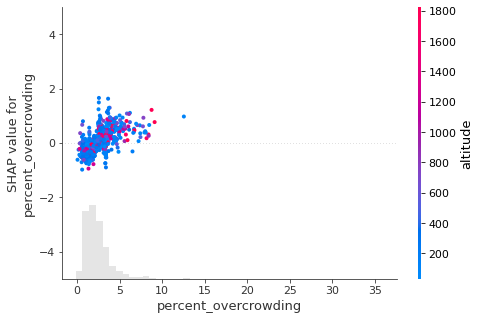


interactions between percent_multi_unit_housing and altitude in rural areas for nonfirearm suicide


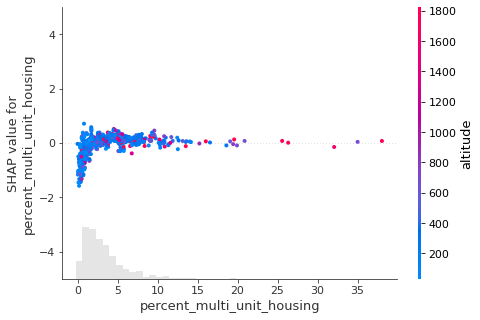


interactions between percent_age_65_and_older and altitude in rural areas for nonfirearm suicide


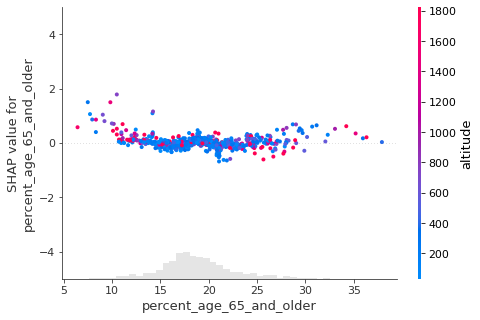


interactions between percent_limited_english_abilities and altitude in rural areas for nonfirearm suicide


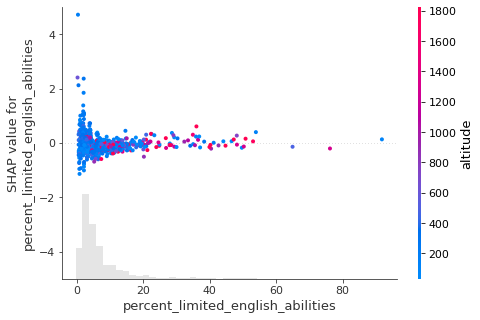


interactions between percent_minorities and altitude in rural areas for nonfirearm suicide


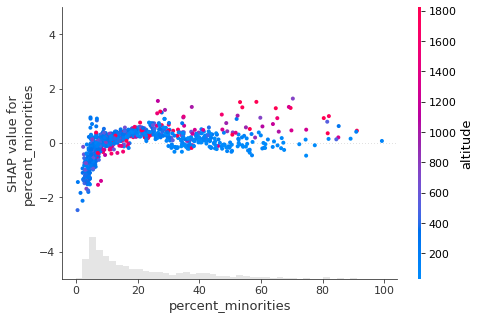


interactions between percent_disabled and altitude in rural areas for nonfirearm suicide


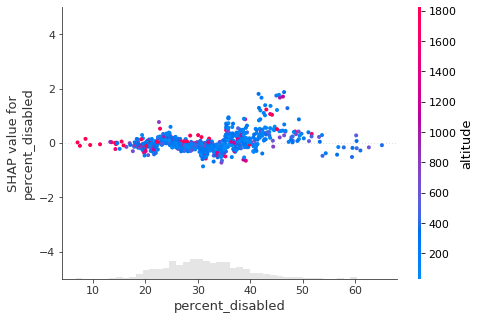


interactions between percent_institutionalized_in_group_quarters and altitude in rural areas for nonfirearm suicide


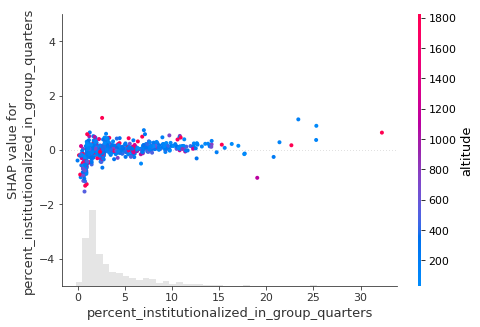


interactions between percent_single_parent_households_CDC and altitude in rural areas for nonfirearm suicide


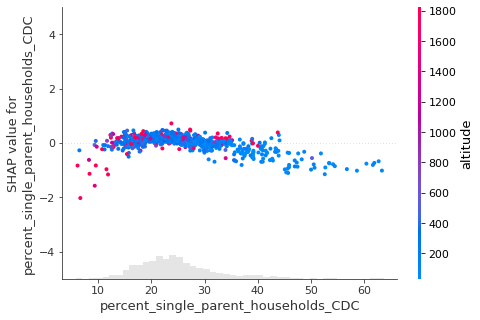


interactions between percent_age_18_to_34 and altitude in rural areas for nonfirearm suicide


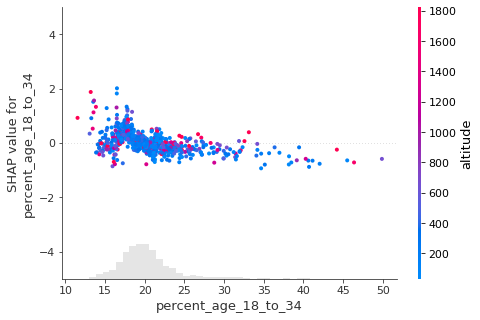


interactions between percent_age_35_to_44 and altitude in rural areas for nonfirearm suicide


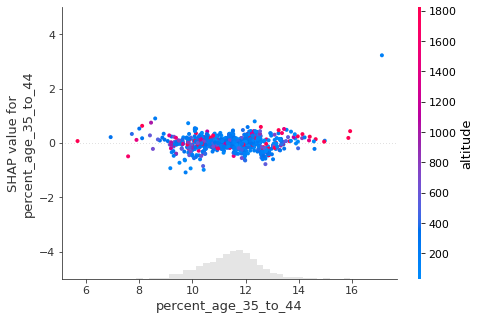


interactions between percent_age_45_to_54 and altitude in rural areas for nonfirearm suicide


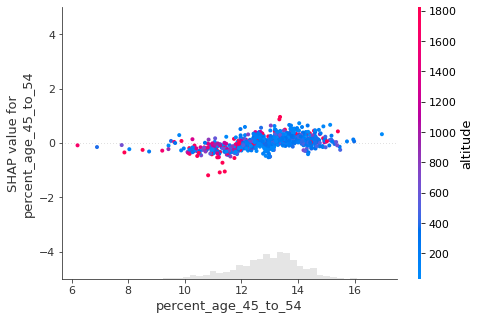


interactions between percent_age_55_to_64 and altitude in rural areas for nonfirearm suicide


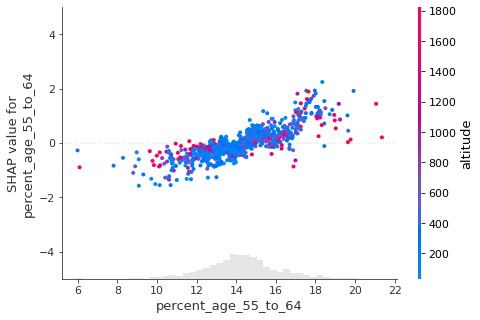

In [110]:
calculateSHAP(nonfirearm_social_rural, 'rural areas', 'social factors', 'nonfirearm suicide')

### SHAP - social factors in urban areas for nonfirearm suicide 

SHAP Values of social factors and altitude in urban areas in 992 counties for nonfirearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


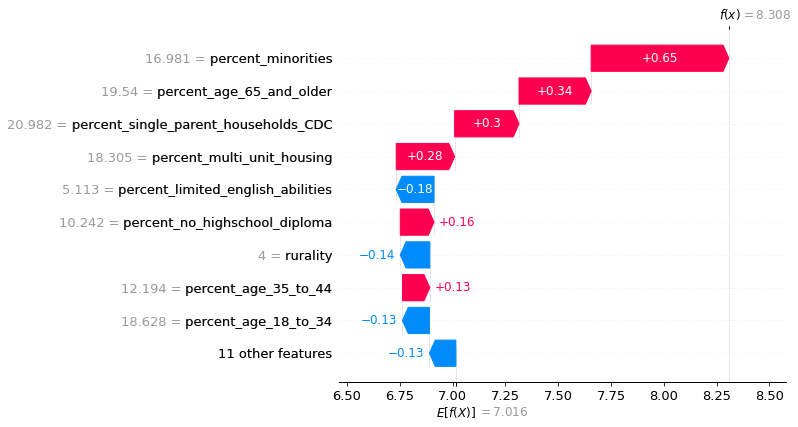


Bar graph to show social factors in urban areas for nonfirearm suicide


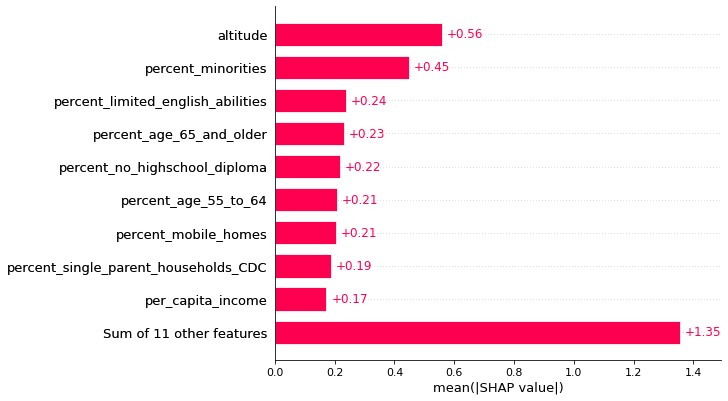


Beeswarm graph to show social factors in urban areas for nonfirearm suicide


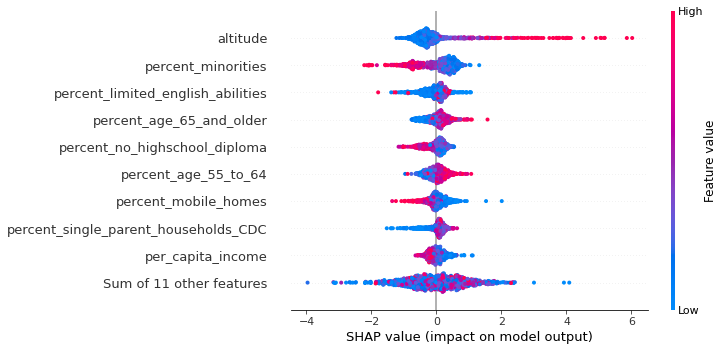


interactions between rurality and altitude in urban areas for nonfirearm suicide


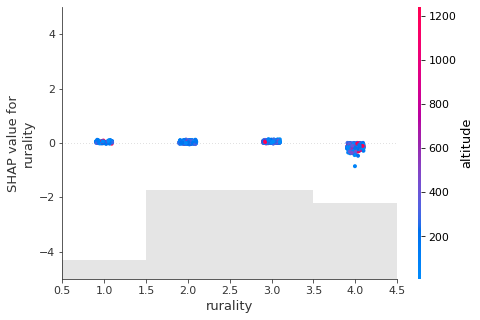


interactions between altitude and rurality in urban areas for nonfirearm suicide


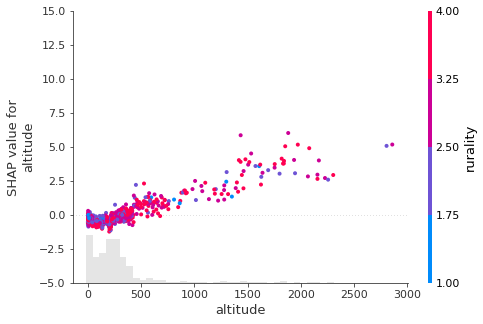


interactions between per_capita_income and altitude in urban areas for nonfirearm suicide


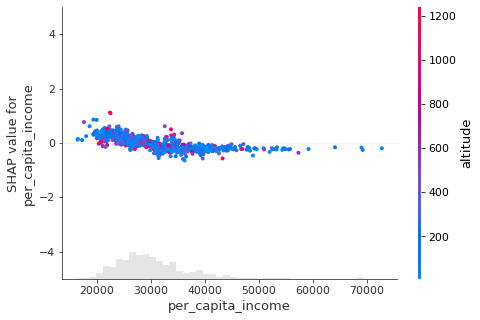


interactions between percent_below_poverty and altitude in urban areas for nonfirearm suicide


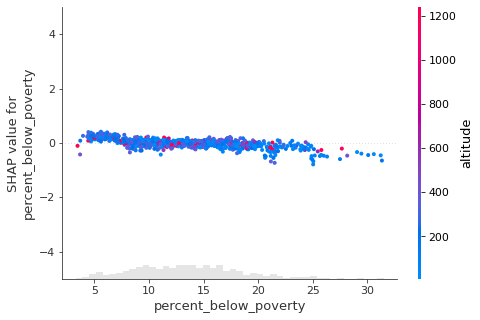


interactions between percent_no_highschool_diploma and altitude in urban areas for nonfirearm suicide


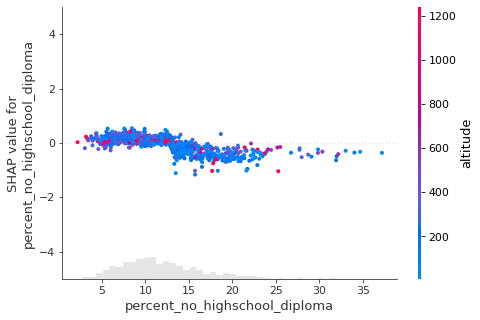


interactions between percent_mobile_homes and altitude in urban areas for nonfirearm suicide


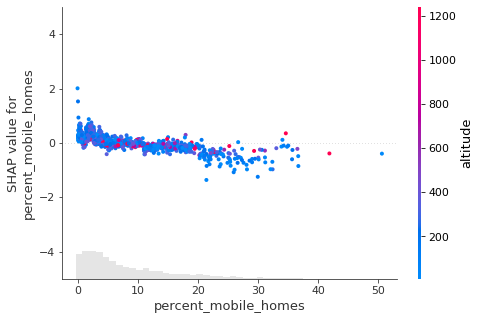


interactions between percent_no_vehicle and altitude in urban areas for nonfirearm suicide


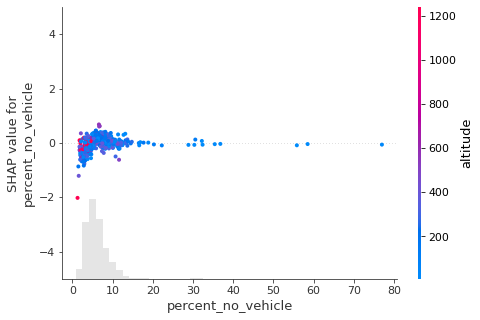


interactions between percent_unemployed_CDC and altitude in urban areas for nonfirearm suicide


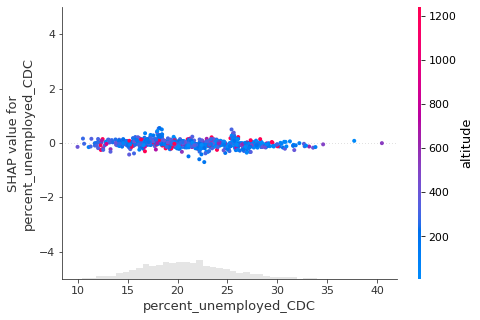


interactions between percent_overcrowding and altitude in urban areas for nonfirearm suicide


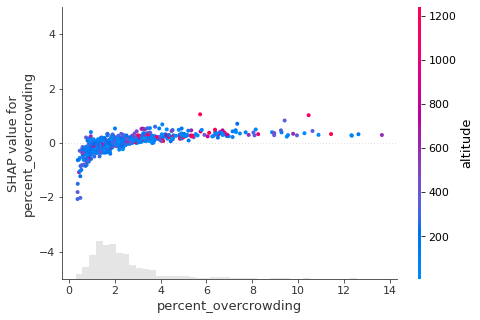


interactions between percent_multi_unit_housing and altitude in urban areas for nonfirearm suicide


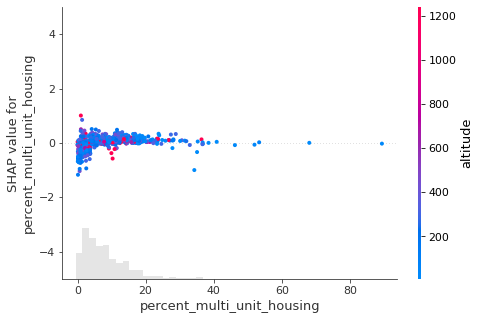


interactions between percent_age_65_and_older and altitude in urban areas for nonfirearm suicide


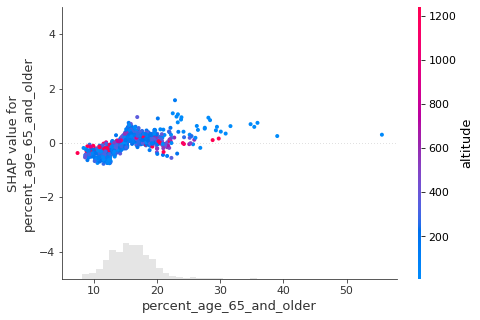


interactions between percent_limited_english_abilities and altitude in urban areas for nonfirearm suicide


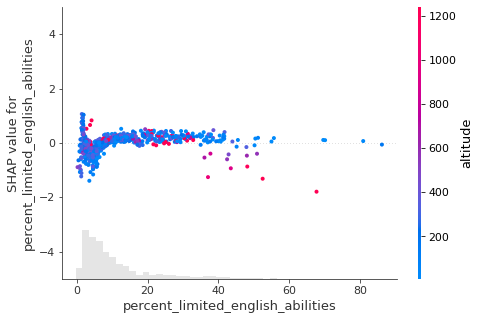


interactions between percent_minorities and altitude in urban areas for nonfirearm suicide


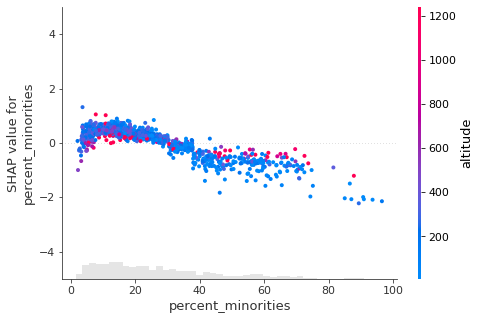


interactions between percent_disabled and altitude in urban areas for nonfirearm suicide


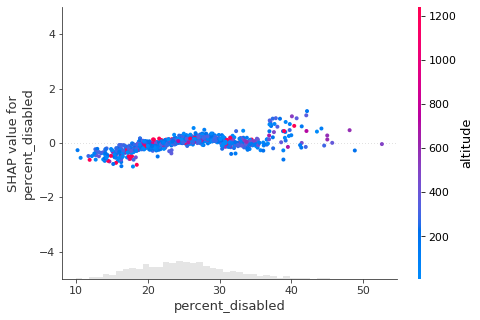


interactions between percent_institutionalized_in_group_quarters and altitude in urban areas for nonfirearm suicide


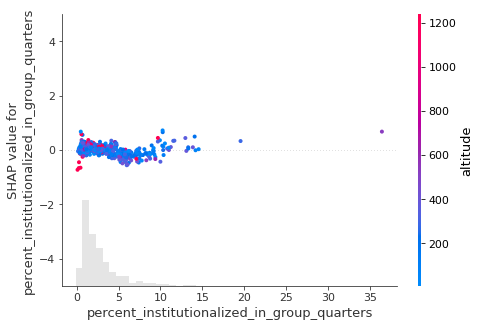


interactions between percent_single_parent_households_CDC and altitude in urban areas for nonfirearm suicide


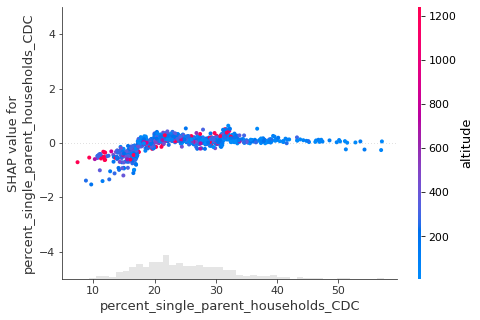


interactions between percent_age_18_to_34 and altitude in urban areas for nonfirearm suicide


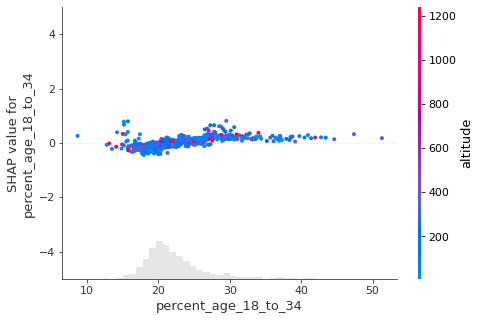


interactions between percent_age_35_to_44 and altitude in urban areas for nonfirearm suicide


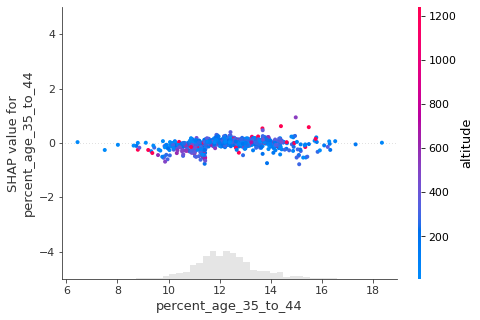


interactions between percent_age_45_to_54 and altitude in urban areas for nonfirearm suicide


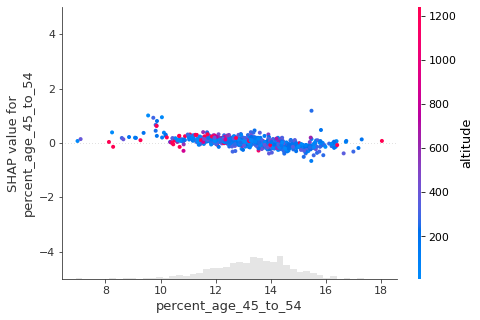


interactions between percent_age_55_to_64 and altitude in urban areas for nonfirearm suicide


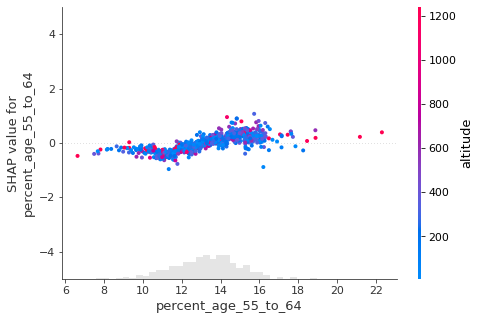

In [111]:
calculateSHAP(nonfirearm_social_urban, 'urban areas', 'social factors', 'nonfirearm suicide')

### SHAP - climate factors in rural areas for nonfirearm suicide 

SHAP Values of climate factors and altitude in rural areas in 900 counties for nonfirearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


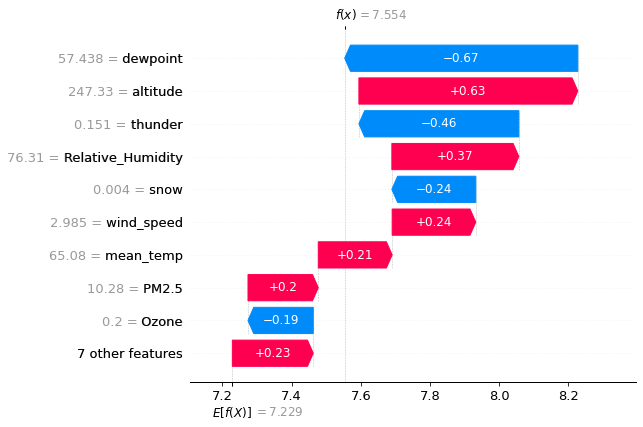


Bar graph to show climate factors in rural areas for nonfirearm suicide


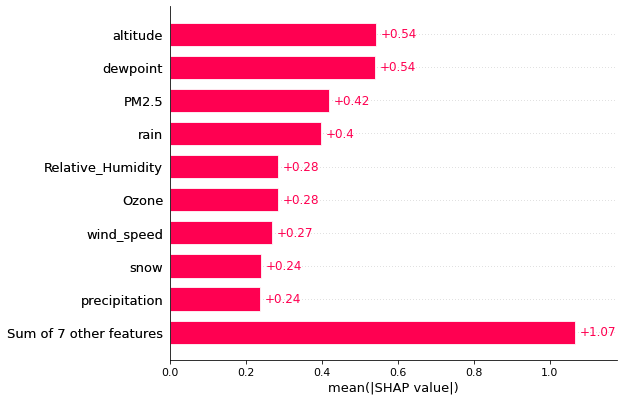


Beeswarm graph to show climate factors in rural areas for nonfirearm suicide


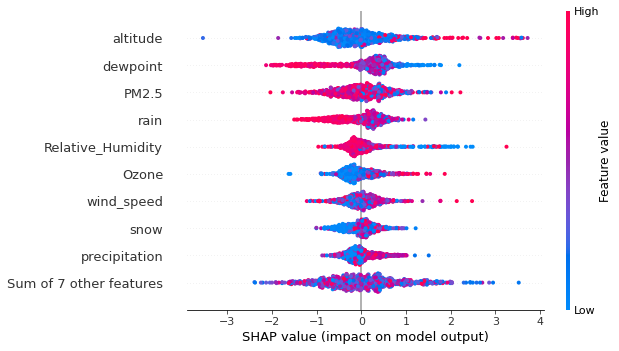


interactions between rurality and altitude in rural areas for nonfirearm suicide


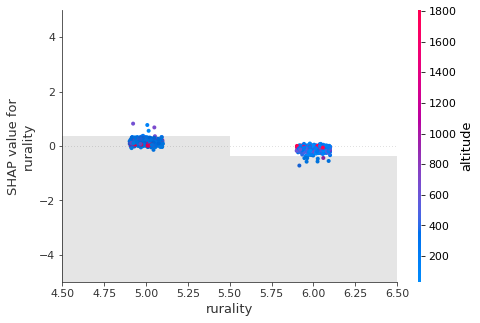


interactions between altitude and rurality in rural areas for nonfirearm suicide


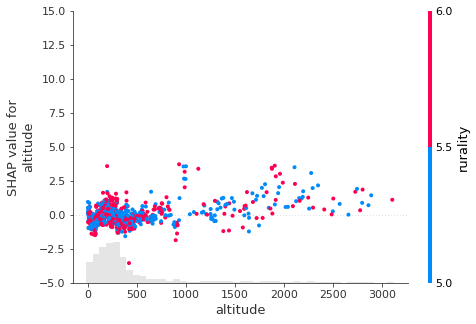


interactions between mean_temp and altitude in rural areas for nonfirearm suicide


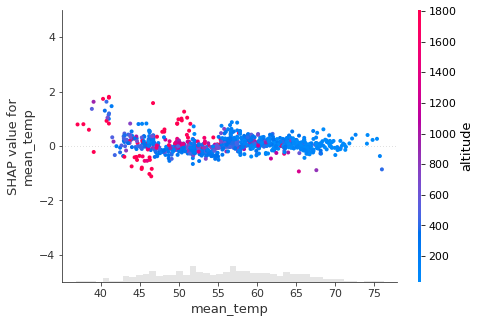


interactions between dewpoint and altitude in rural areas for nonfirearm suicide


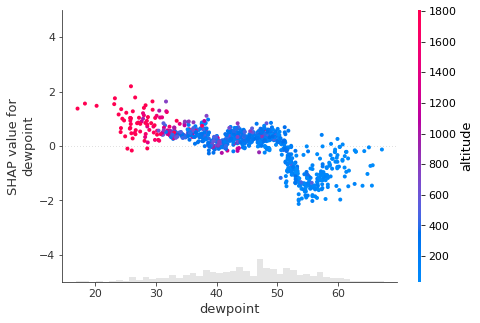


interactions between visibility and altitude in rural areas for nonfirearm suicide


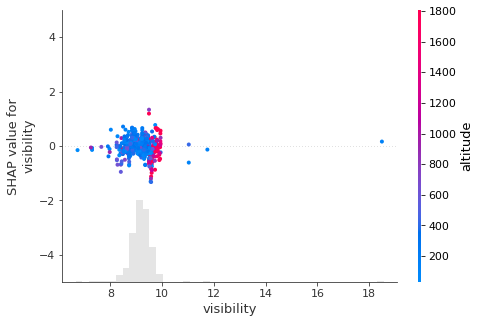


interactions between wind_speed and altitude in rural areas for nonfirearm suicide


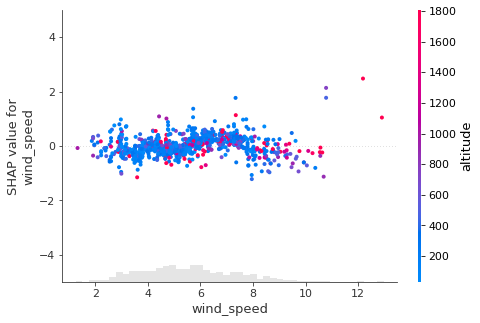


interactions between precipitation and altitude in rural areas for nonfirearm suicide


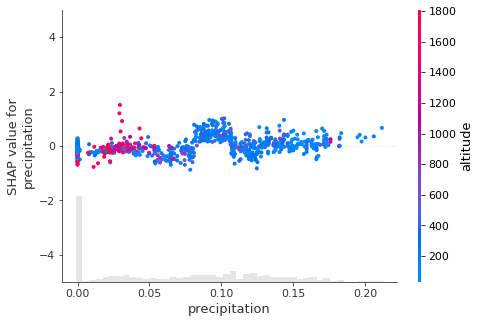


interactions between fog and altitude in rural areas for nonfirearm suicide


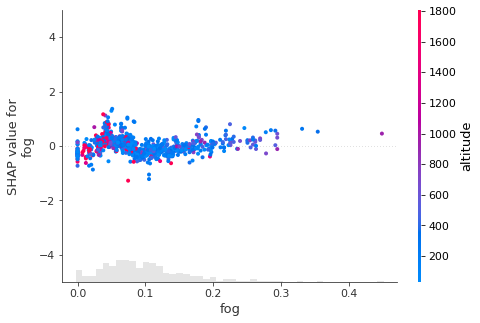


interactions between rain and altitude in rural areas for nonfirearm suicide


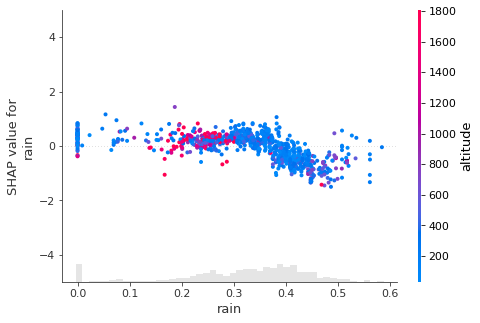


interactions between snow and altitude in rural areas for nonfirearm suicide


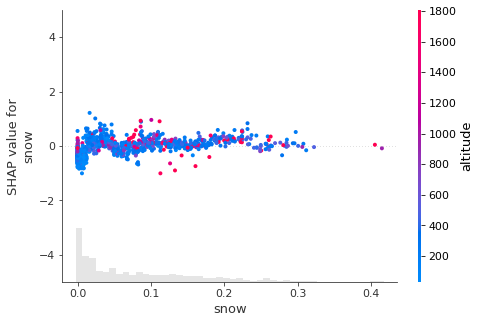


interactions between hail and altitude in rural areas for nonfirearm suicide


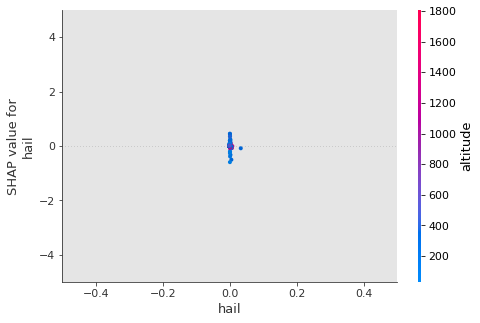


interactions between thunder and altitude in rural areas for nonfirearm suicide


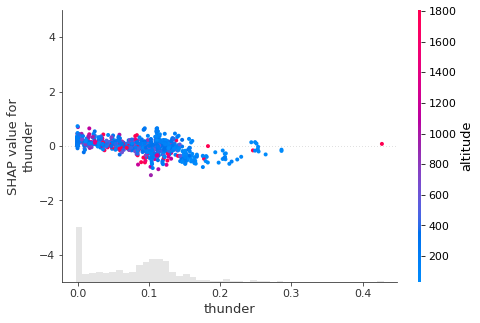


interactions between Relative_Humidity and altitude in rural areas for nonfirearm suicide


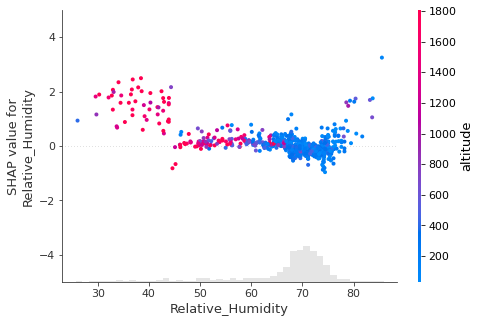


interactions between Heat_Index and altitude in rural areas for nonfirearm suicide


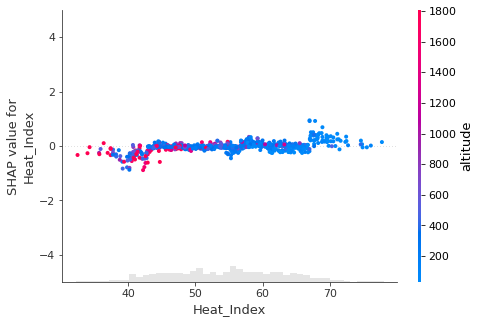


interactions between PM2.5 and altitude in rural areas for nonfirearm suicide


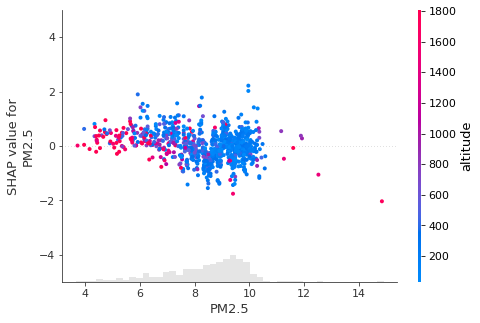


interactions between Ozone and altitude in rural areas for nonfirearm suicide


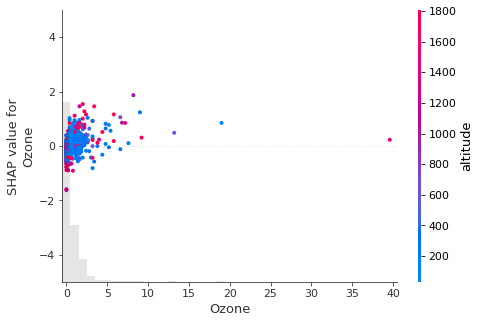

In [112]:
calculateSHAP(nonfirearm_climate_rural, 'rural areas', 'climate factors', 'nonfirearm suicide')

### SHAP - climate factors in urban areas for nonfirearm suicide 

SHAP Values of climate factors and altitude in urban areas in 952 counties for nonfirearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


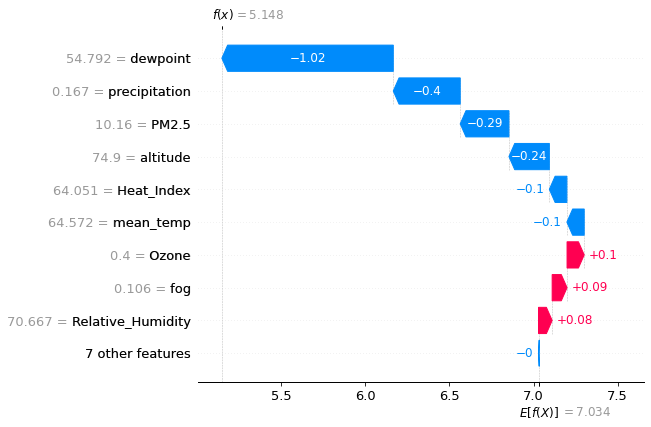


Bar graph to show climate factors in urban areas for nonfirearm suicide


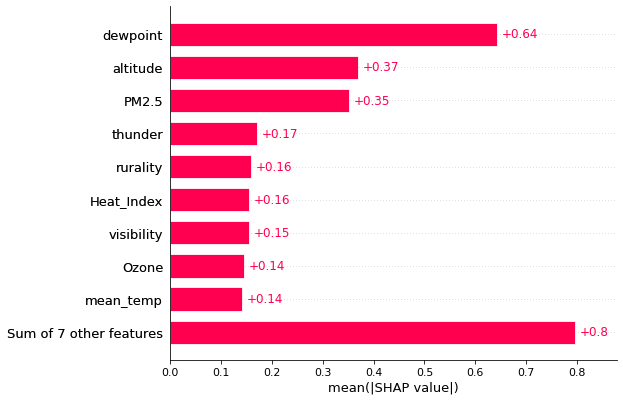


Beeswarm graph to show climate factors in urban areas for nonfirearm suicide


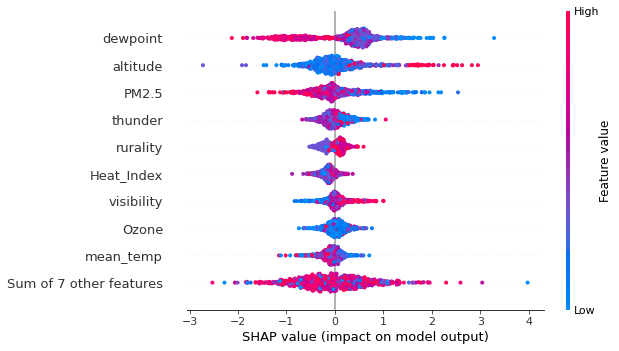


interactions between rurality and altitude in urban areas for nonfirearm suicide


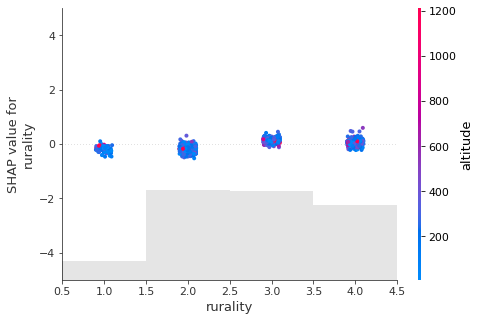


interactions between altitude and rurality in urban areas for nonfirearm suicide


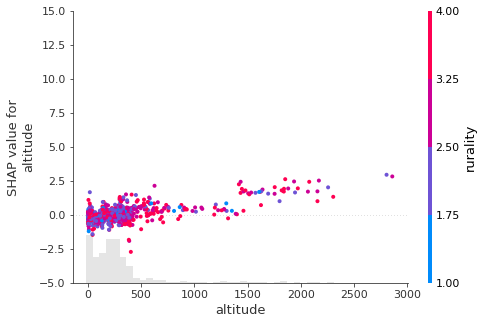


interactions between mean_temp and altitude in urban areas for nonfirearm suicide


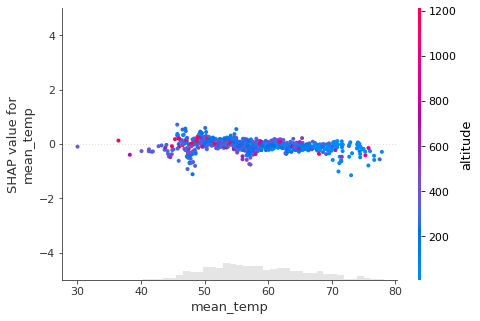


interactions between dewpoint and altitude in urban areas for nonfirearm suicide


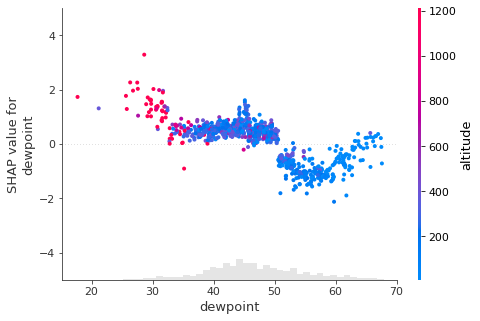


interactions between visibility and altitude in urban areas for nonfirearm suicide


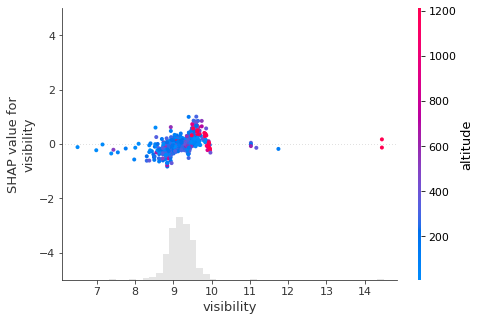


interactions between wind_speed and altitude in urban areas for nonfirearm suicide


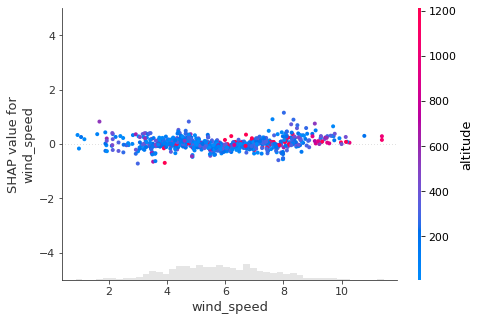


interactions between precipitation and altitude in urban areas for nonfirearm suicide


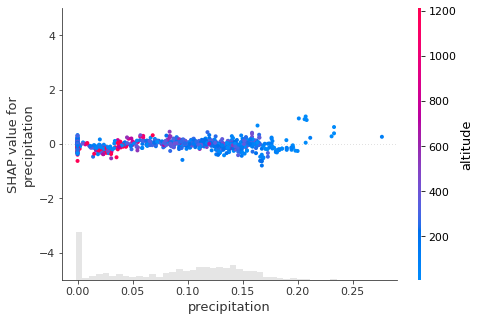


interactions between fog and altitude in urban areas for nonfirearm suicide


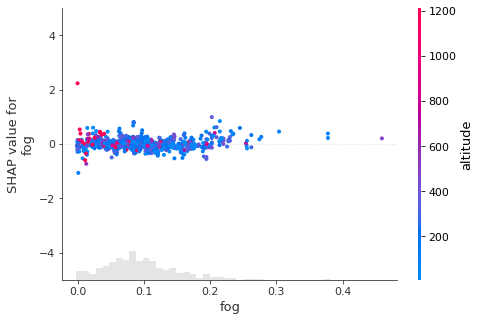


interactions between rain and altitude in urban areas for nonfirearm suicide


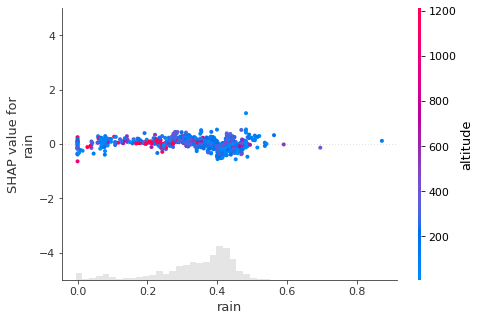


interactions between snow and altitude in urban areas for nonfirearm suicide


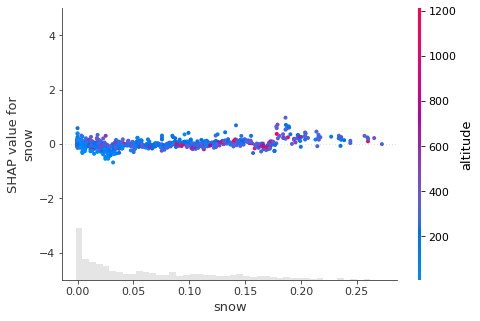


interactions between hail and altitude in urban areas for nonfirearm suicide


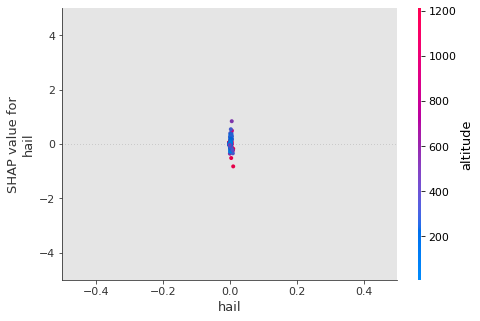


interactions between thunder and altitude in urban areas for nonfirearm suicide


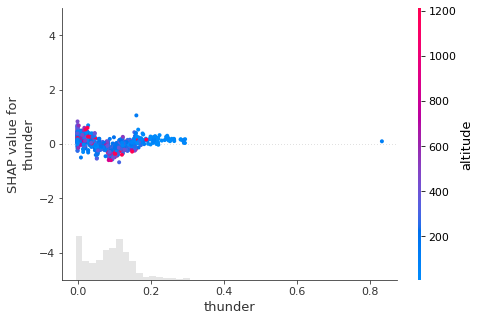


interactions between Relative_Humidity and altitude in urban areas for nonfirearm suicide


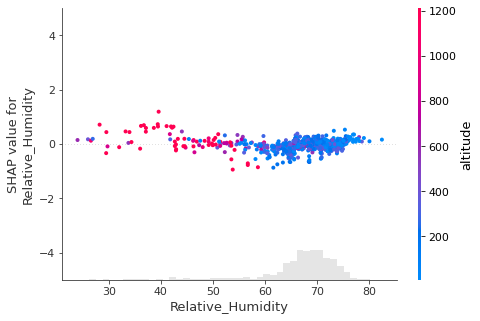


interactions between Heat_Index and altitude in urban areas for nonfirearm suicide


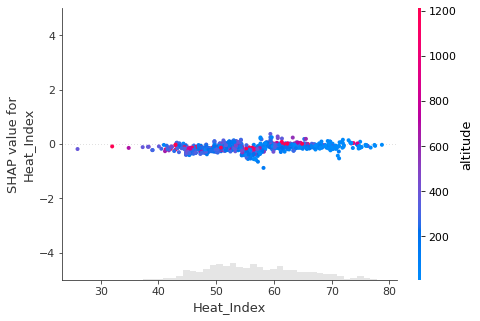


interactions between PM2.5 and altitude in urban areas for nonfirearm suicide


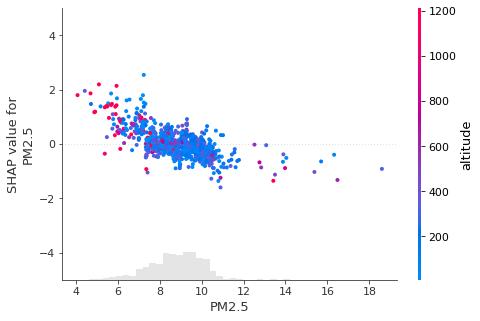


interactions between Ozone and altitude in urban areas for nonfirearm suicide


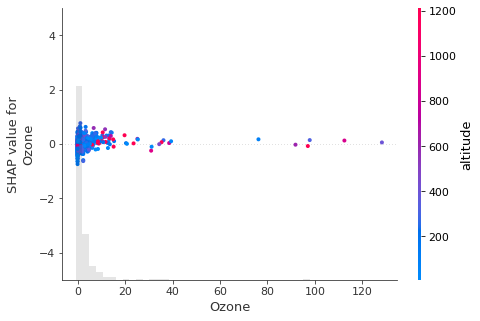

In [113]:
calculateSHAP(nonfirearm_climate_urban, 'urban areas', 'climate factors', 'nonfirearm suicide')

SHAP Values of climate factors and altitude in rural areas in 900 counties for nonfirearm suicide



ntree_limit is deprecated, use `iteration_range` or model slicing instead.


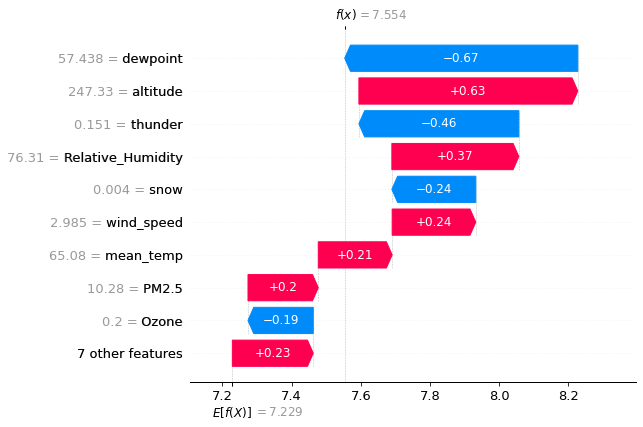


Bar graph to show climate factors in rural areas for nonfirearm suicide


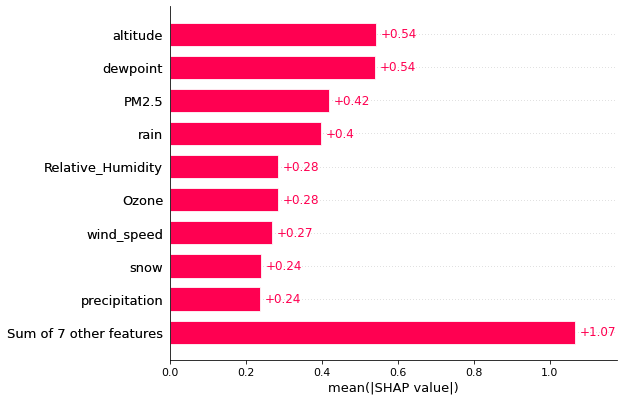


Beeswarm graph to show climate factors in rural areas for nonfirearm suicide


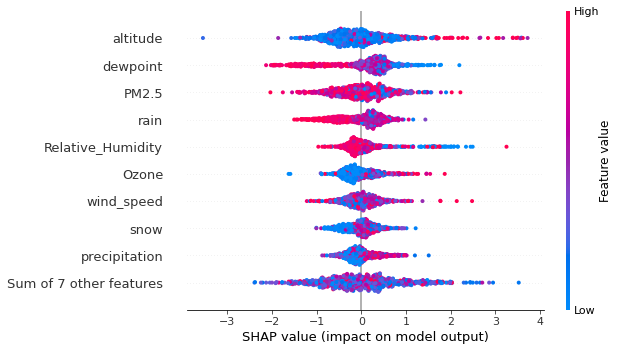


interactions between rurality and altitude in rural areas for nonfirearm suicide


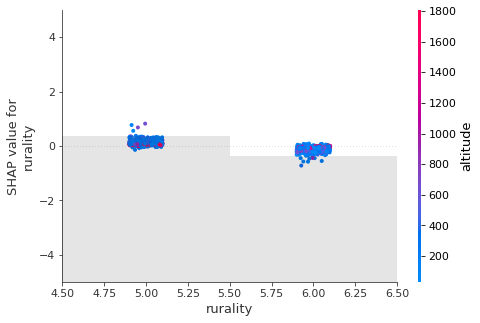


interactions between altitude and rurality in rural areas for nonfirearm suicide


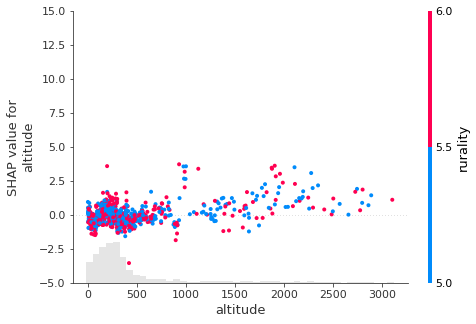


interactions between mean_temp and altitude in rural areas for nonfirearm suicide


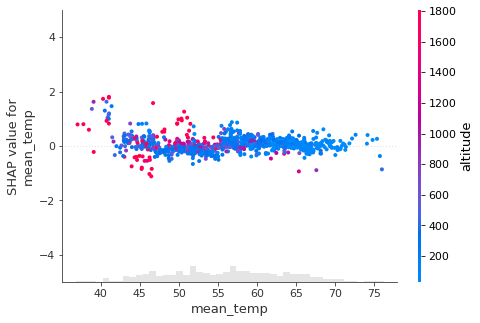


interactions between dewpoint and altitude in rural areas for nonfirearm suicide


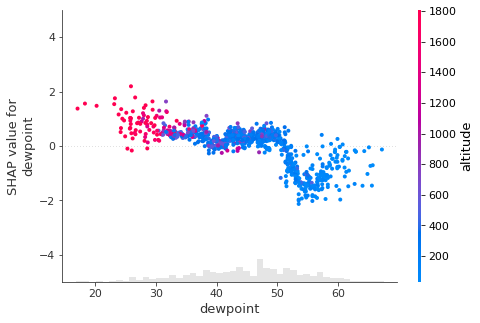


interactions between visibility and altitude in rural areas for nonfirearm suicide


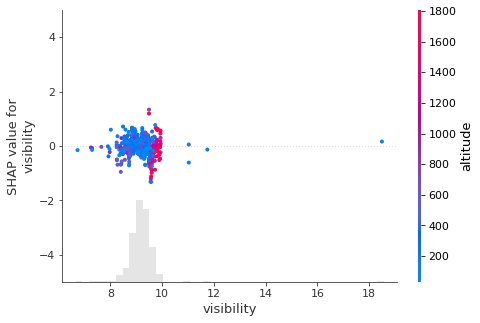


interactions between wind_speed and altitude in rural areas for nonfirearm suicide


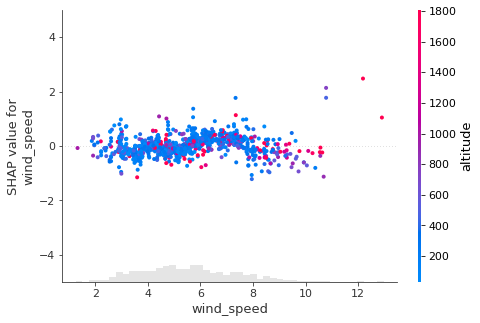


interactions between precipitation and altitude in rural areas for nonfirearm suicide


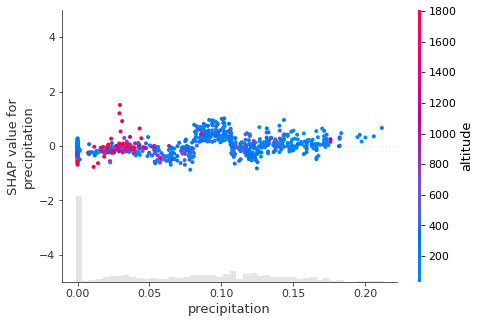


interactions between fog and altitude in rural areas for nonfirearm suicide


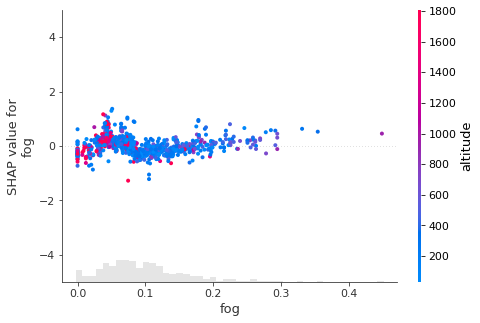


interactions between rain and altitude in rural areas for nonfirearm suicide


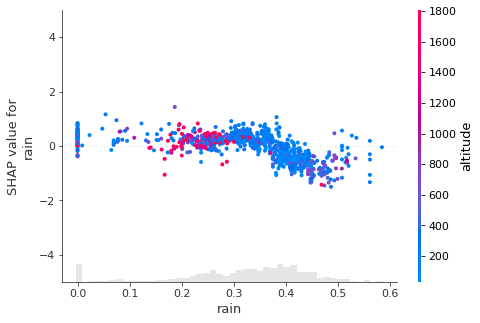


interactions between snow and altitude in rural areas for nonfirearm suicide


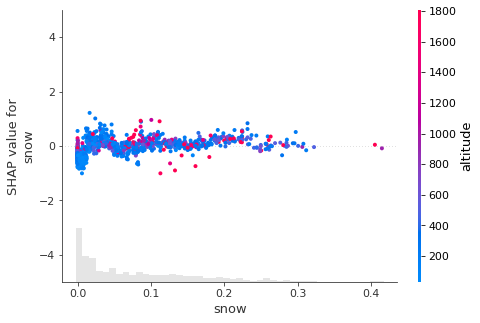


interactions between hail and altitude in rural areas for nonfirearm suicide


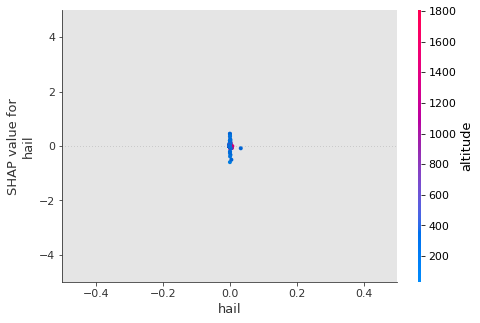


interactions between thunder and altitude in rural areas for nonfirearm suicide


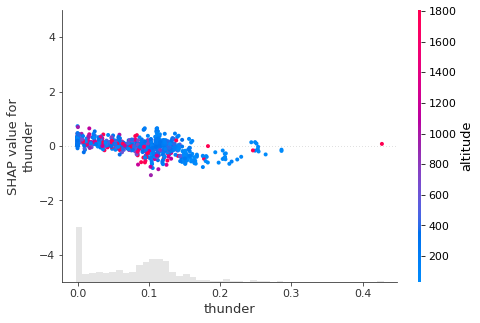


interactions between Relative_Humidity and altitude in rural areas for nonfirearm suicide


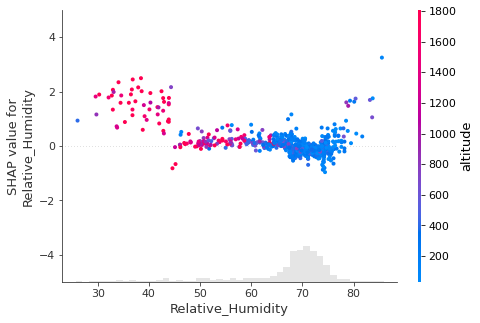


interactions between Heat_Index and altitude in rural areas for nonfirearm suicide


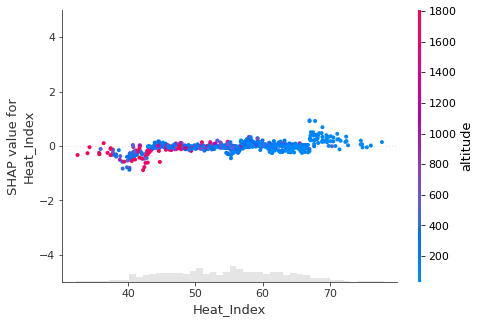


interactions between PM2.5 and altitude in rural areas for nonfirearm suicide


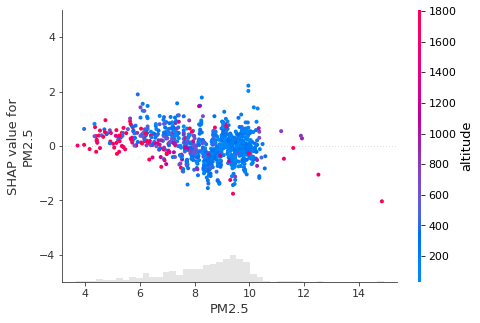


interactions between Ozone and altitude in rural areas for nonfirearm suicide


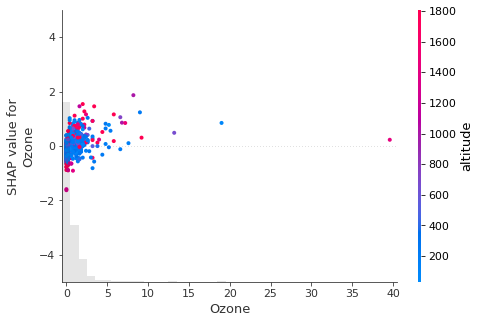

In [114]:
calculateSHAP(nonfirearm_climate_rural, 'rural areas', 'climate factors', 'nonfirearm suicide')

In [31]:
import xgboost
import shap
import copy    

In [70]:
suicide_social = suicide_social.dropna()
suicide_social.shape[0]

2360

In [71]:
X = suicide_social.iloc[:, 1:-1]
y = suicide_social.iloc[:, -1].array

In [75]:
list(X.columns[:-1])

['per_capita_income',
 'percent_below_poverty',
 'percent_no_highschool_diploma',
 'percent_mobile_homes',
 'percent_no_vehicle',
 'percent_unemployed_CDC',
 'percent_overcrowding',
 'percent_multi_unit_housing',
 'percent_age_65_and_older',
 'percent_limited_english_abilities',
 'percent_minorities',
 'percent_disabled',
 'percent_institutionalized_in_group_quarters',
 'percent_single_parent_households_CDC',
 'percent_age_18_to_34',
 'percent_age_35_to_44',
 'percent_age_45_to_54',
 'percent_age_55_to_64',
 'rurality',
 'altitude']

In [34]:
model = xgboost.XGBRegressor().fit(X, y)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


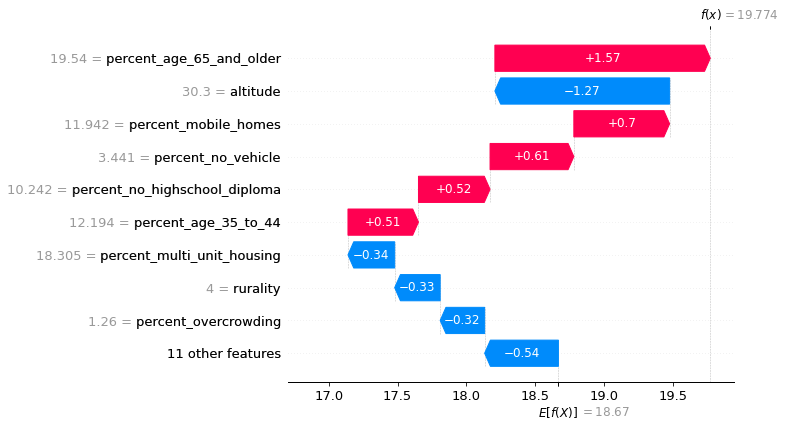

In [35]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[1])

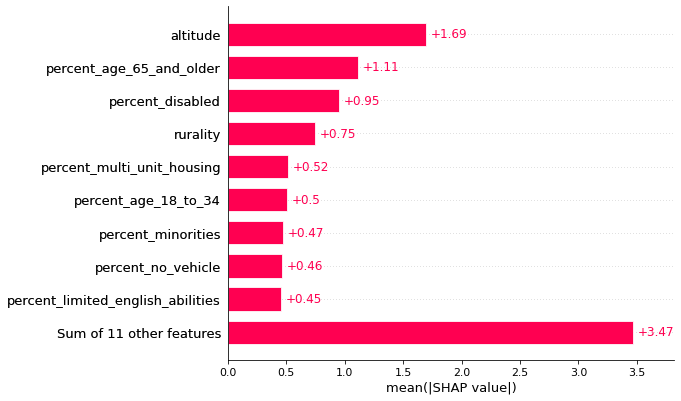

In [36]:
shap.plots.bar(shap_values)

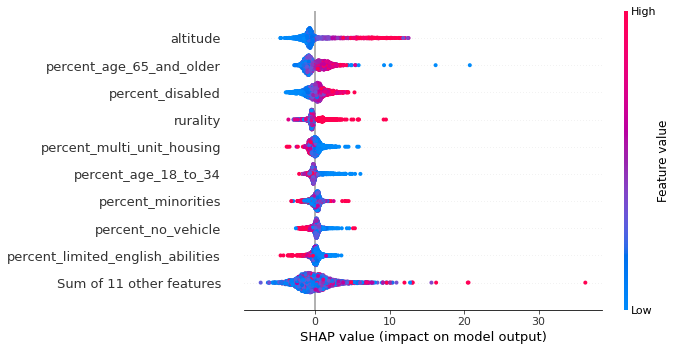

In [37]:
shap.plots.beeswarm(copy.deepcopy(shap_values))

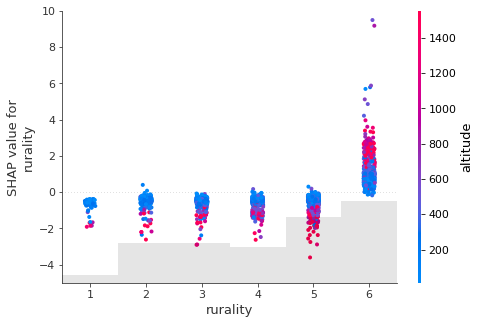

In [38]:
shap.plots.scatter(shap_values[:,"rurality"], color=shap_values[:,"altitude"], ymin = -5, ymax = 10)

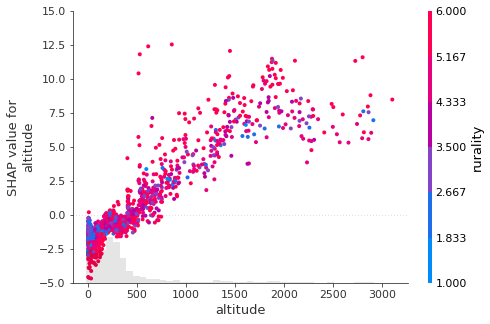

In [39]:
shap.plots.scatter(shap_values[:,"altitude"], color=shap_values[:,"rurality"], ymin = -5, ymax = 15)

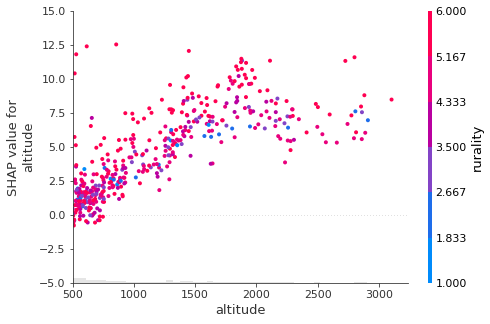

In [40]:
shap.plots.scatter(shap_values[:,"altitude"], color=shap_values[:,"rurality"], ymin = -5, ymax = 15, xmin = 500)

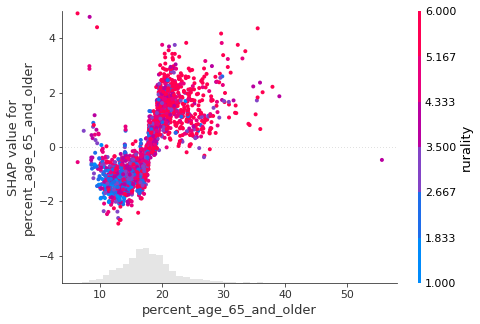

In [41]:
shap.plots.scatter(shap_values[:,"percent_age_65_and_older"], color=shap_values[:,"rurality"], ymin = -5, ymax = 5)

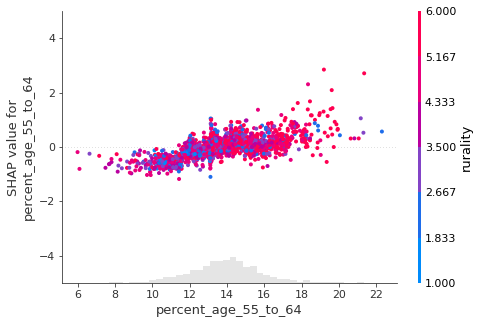

In [42]:
shap.plots.scatter(shap_values[:,"percent_age_55_to_64"], color=shap_values[:,"rurality"], ymin = -5, ymax = 5)

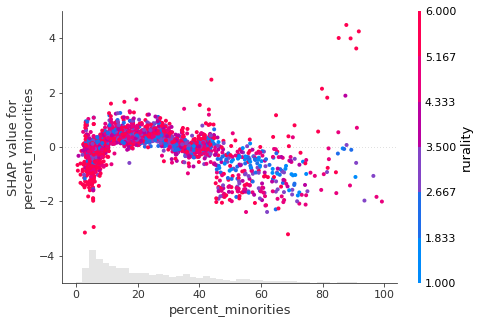

In [43]:
shap.plots.scatter(shap_values[:,"percent_minorities"], color=shap_values[:,"rurality"], ymin = -5, ymax = 5)

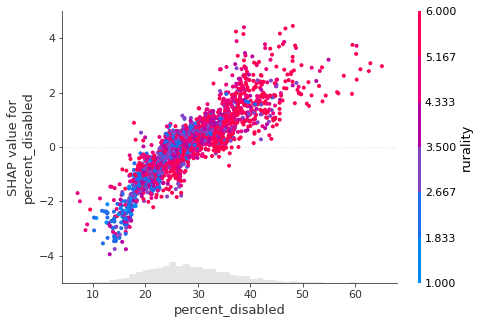

In [44]:
shap.plots.scatter(shap_values[:,"percent_disabled"], color=shap_values[:,"rurality"], ymin = -5, ymax = 5)

In [46]:
suicide_climate = suicide_climate.dropna()
suicide_climate.shape[0]

2242

In [47]:
X = suicide_climate.iloc[:, 1:-1]
y = suicide_climate.iloc[:, -1].array

In [48]:
model = xgboost.XGBRegressor().fit(X, y)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


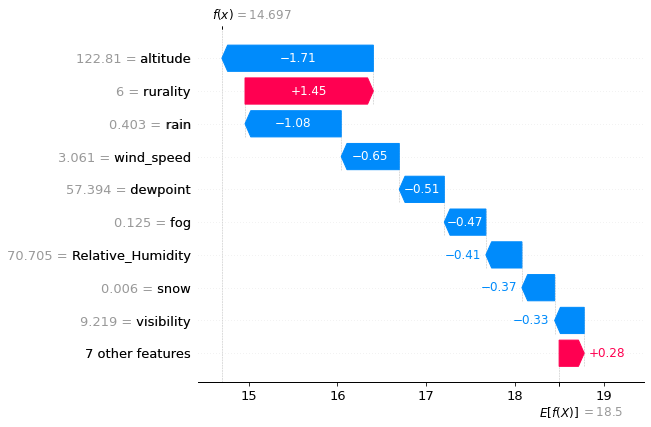

In [49]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[1])

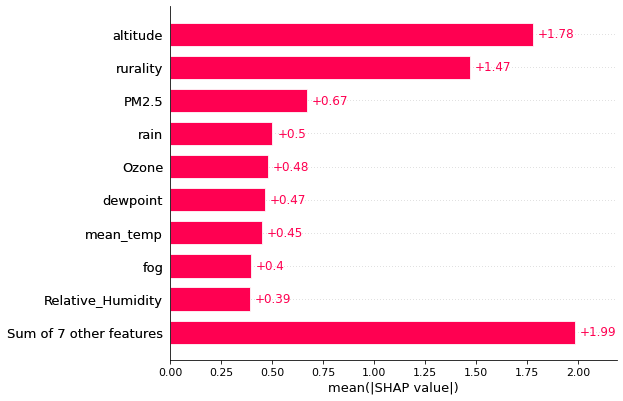

In [50]:
shap.plots.bar(shap_values)

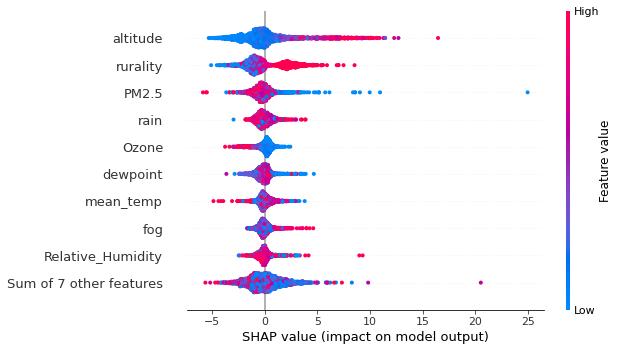

In [51]:
shap.plots.beeswarm(copy.deepcopy(shap_values))

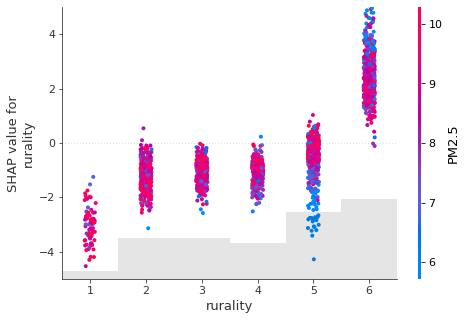

In [52]:
shap.plots.scatter(shap_values[:,"rurality"], color=shap_values[:,"PM2.5"], ymin = -5, ymax = 5)

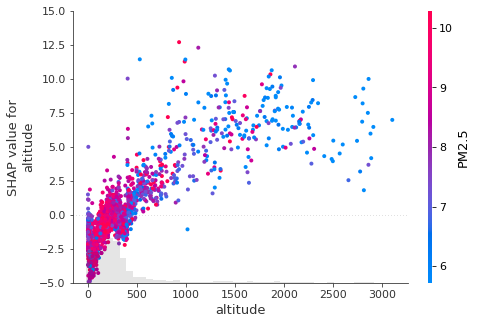

In [55]:
shap.plots.scatter(shap_values[:,"altitude"], color=shap_values[:,"PM2.5"], ymin = -5, ymax = 15)

In [56]:
firearm_social = social.merge(suicide_firearm[['fips', 'SuicideDeathRate']], on = 'fips', how = 'left')
firearm_social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude,SuicideDeathRate
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66,12.262725
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30,11.600783
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81,11.583727
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90,15.070922
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46,11.766782


In [57]:
firearm_social = firearm_social.dropna()
firearm_social.shape[0]

1948

In [59]:
X = firearm_social.iloc[:, 1:-1]
y = firearm_social.iloc[:, -1].array

In [60]:
model = xgboost.XGBRegressor().fit(X, y)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


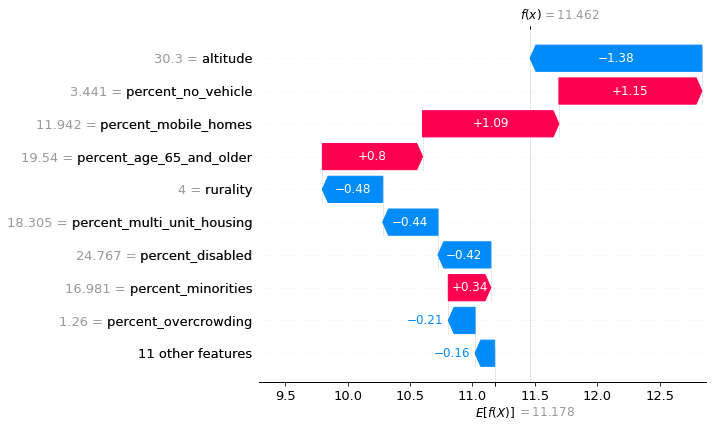

In [61]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[1])

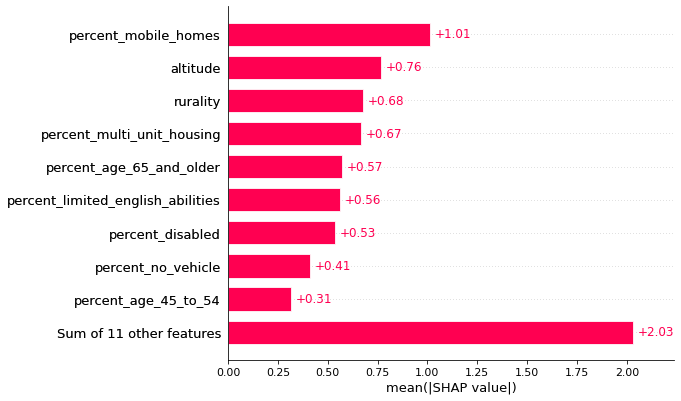

In [62]:
shap.plots.bar(shap_values)

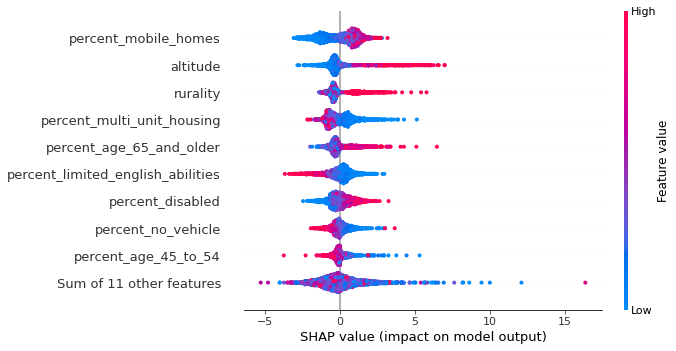

In [63]:
shap.plots.beeswarm(copy.deepcopy(shap_values))

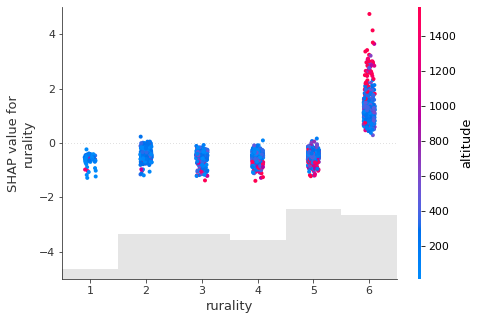

In [64]:
shap.plots.scatter(shap_values[:,"rurality"], color=shap_values[:,"altitude"], ymin = -5, ymax = 5)

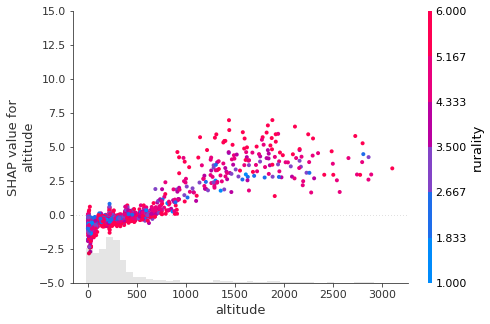

In [65]:
shap.plots.scatter(shap_values[:,"altitude"], color=shap_values[:,"rurality"], ymin = -5, ymax = 15)

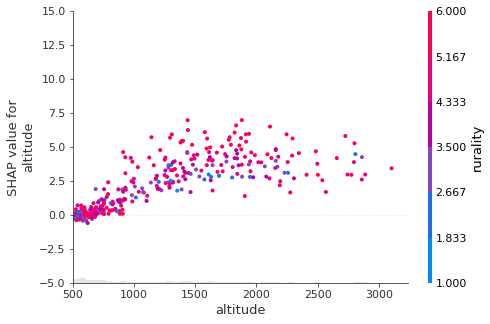

In [68]:
shap.plots.scatter(shap_values[:,"altitude"], color=shap_values[:,"rurality"], ymin = -5, ymax = 15, xmin = 500)

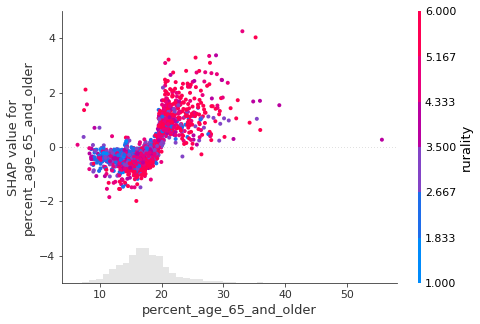

In [69]:
shap.plots.scatter(shap_values[:,"percent_age_65_and_older"], color=shap_values[:,"rurality"], ymin = -5, ymax = 5)

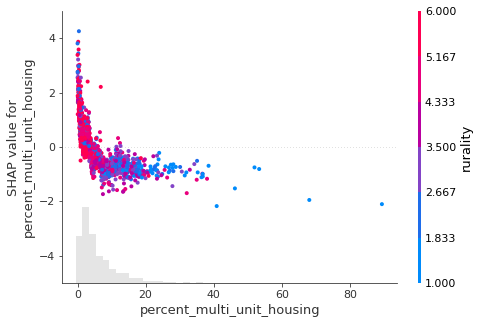

In [70]:
shap.plots.scatter(shap_values[:,"percent_multi_unit_housing"], color=shap_values[:,"rurality"], ymin = -5, ymax = 5)

In [71]:
firearm_climate = climate.merge(firearm_social[['fips', 'rurality', 'altitude', 'SuicideDeathRate']], on = 'fips', how = 'left')
firearm_climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone,rurality,altitude,SuicideDeathRate
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0,3.0,128.66,12.262725
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8,4.0,30.30,11.600783
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0,6.0,122.81,11.583727
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4,2.0,74.90,15.070922
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8,2.0,184.46,11.766782


In [72]:
firearm_climate = firearm_climate.dropna()
firearm_climate.shape[0]

1852

In [73]:
X = firearm_climate.iloc[:, 1:-1]
y = firearm_climate.iloc[:, -1].array

In [74]:
model = xgboost.XGBRegressor().fit(X, y)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


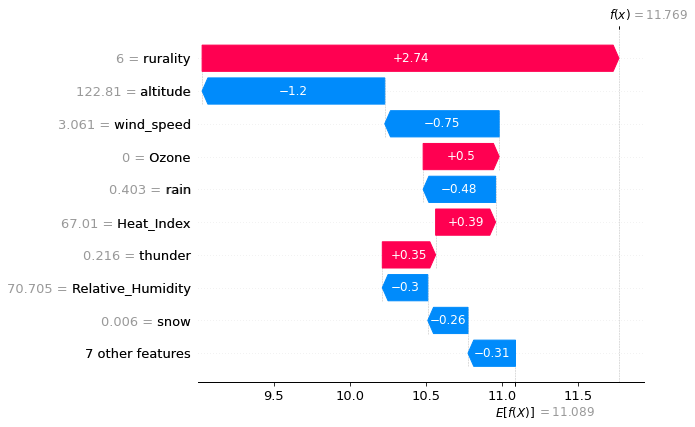

In [75]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[1])

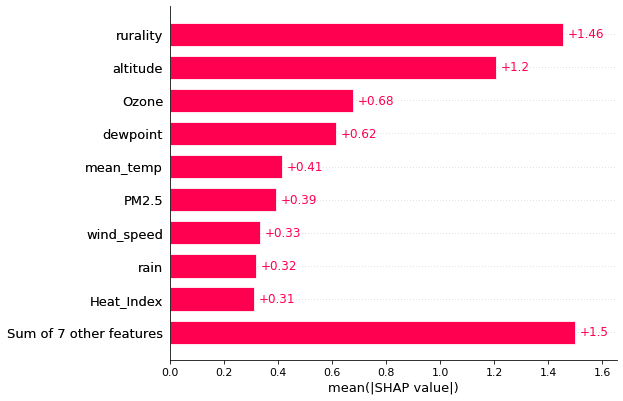

In [76]:
shap.plots.bar(shap_values)

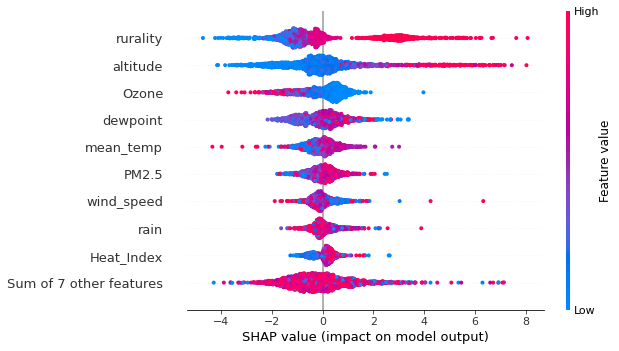

In [77]:
shap.plots.beeswarm(copy.deepcopy(shap_values))

### social economic factors + rurality + altitude

In [80]:
nonfirearm_social = social.merge(suicide_nonfirearm[['fips', 'SuicideDeathRate']], on = 'fips', how = 'left')
nonfirearm_social.head()

,fips,per_capita_income,percent_below_poverty,percent_no_highschool_diploma,percent_mobile_homes,percent_no_vehicle,percent_unemployed_CDC,percent_overcrowding,percent_multi_unit_housing,percent_age_65_and_older,...,percent_disabled,percent_institutionalized_in_group_quarters,percent_single_parent_households_CDC,percent_age_18_to_34,percent_age_35_to_44,percent_age_45_to_54,percent_age_55_to_64,rurality,altitude,SuicideDeathRate
0,01001,29372.0,15.378435,11.704246,15.856113,5.640540,19.585364,1.416055,3.800129,14.583333,...,35.569866,0.989130,24.766250,21.248188,13.358696,14.226449,12.364130,3.0,128.66,6.852699
1,01003,31203.0,10.566099,10.242263,11.942387,3.440513,20.886404,1.260461,18.305418,19.540429,...,24.767155,1.448293,20.982260,18.628398,12.194208,13.613189,14.074971,4.0,30.30,8.341059
2,01005,18461.0,28.863318,28.085622,28.402238,9.242325,32.529277,3.407359,1.273352,17.973780,...,39.629877,11.248158,50.643856,22.682492,12.039407,13.389186,12.830657,6.0,122.81,2.316745
3,01007,20199.0,13.987688,17.826362,26.551184,5.994152,29.598085,0.760234,2.423316,16.251609,...,30.168042,9.282195,28.608526,22.919164,12.851245,15.266125,12.030008,2.0,74.90,5.319149
4,01009,22656.0,14.400336,20.962980,24.274106,4.155340,26.114537,1.645631,0.871109,17.751756,...,25.695857,0.941972,24.148952,19.665192,12.408708,13.786105,13.024547,2.0,184.46,5.537309


In [81]:
nonfirearm_social = nonfirearm_social.dropna()
nonfirearm_social.shape[0]

1948

In [82]:
X = nonfirearm_social.iloc[:, 1:-1]
y = nonfirearm_social.iloc[:, -1].array

In [83]:
model = xgboost.XGBRegressor().fit(X, y)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


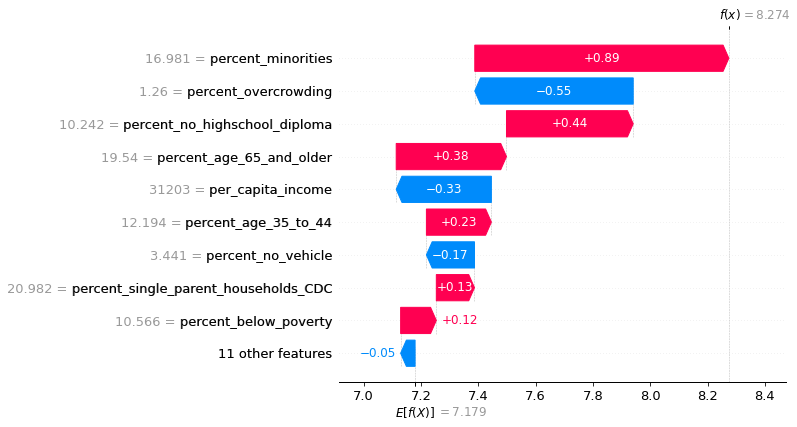

In [84]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[1])

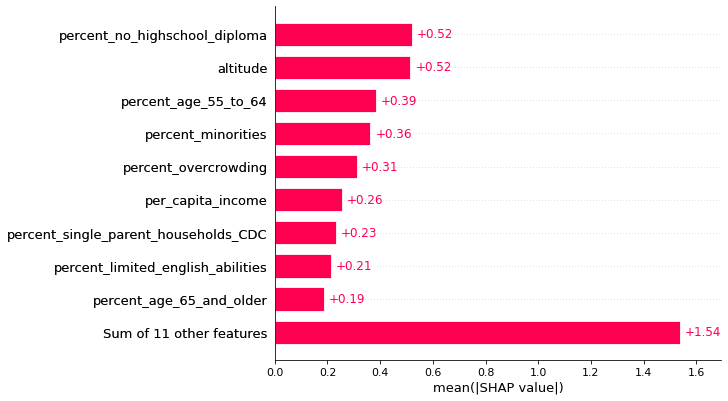

In [85]:
shap.plots.bar(shap_values)

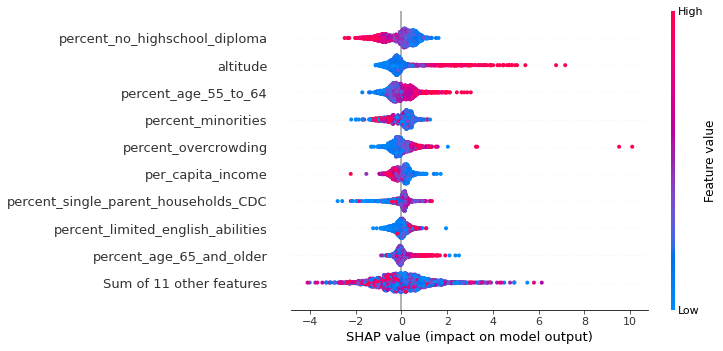

In [86]:
shap.plots.beeswarm(copy.deepcopy(shap_values))

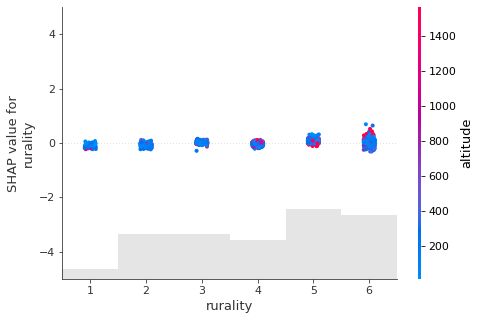

In [87]:
shap.plots.scatter(shap_values[:,"rurality"], color=shap_values[:,"altitude"], ymin = -5, ymax = 5)

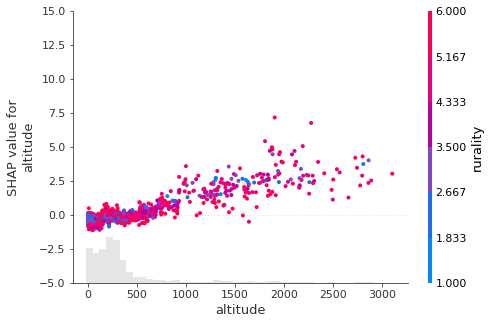

In [88]:
shap.plots.scatter(shap_values[:,"altitude"], color=shap_values[:,"rurality"], ymin = -5, ymax = 15)

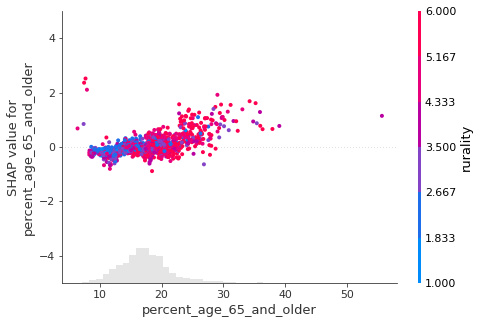

In [89]:
shap.plots.scatter(shap_values[:,"percent_age_65_and_older"], color=shap_values[:,"rurality"], ymin = -5, ymax = 5)

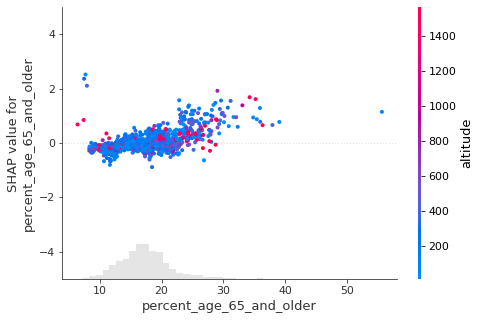

In [90]:
shap.plots.scatter(shap_values[:,"percent_age_65_and_older"], color=shap_values[:,"altitude"], ymin = -5, ymax = 5)

### climate + rurality + altitude

In [91]:
nonfirearm_climate = climate.merge(nonfirearm_social[['fips', 'rurality', 'altitude', 'SuicideDeathRate']], on = 'fips', how = 'left')
nonfirearm_climate.head()

,fips,mean_temp,dewpoint,visibility,wind_speed,precipitation,fog,rain,snow,hail,thunder,Relative_Humidity,Heat_Index,PM2.5,Ozone,rurality,altitude,SuicideDeathRate
0,01001,66.272479,56.658627,9.404546,4.215983,0.174213,0.137203,0.507648,0.005504,0.0,0.157533,71.216544,65.946904,10.48,0.0,3.0,128.66,6.852699
1,01003,68.458562,NaN,NaN,5.563459,0.032803,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,7.86,0.8,4.0,30.30,8.341059
2,01005,67.260653,57.394492,9.219023,3.061397,0.140646,0.124597,0.402900,0.006039,0.0,0.216251,70.704747,67.009842,10.00,0.0,6.0,122.81,2.316745
3,01007,64.572494,54.792228,9.102168,3.418144,0.167484,0.106273,0.389953,0.009311,0.0,0.144575,70.666741,64.051080,10.16,0.4,2.0,74.90,5.319149
4,01009,60.894188,NaN,NaN,4.021411,0.155742,0.000000,0.000000,0.000000,0.0,0.000000,NaN,NaN,10.46,0.8,2.0,184.46,5.537309


In [92]:
nonfirearm_climate = nonfirearm_climate.dropna()
nonfirearm_climate.shape[0]

1852

In [93]:
X = nonfirearm_climate.iloc[:, 1:-1]
y = nonfirearm_climate.iloc[:, -1].array

In [94]:
model = xgboost.XGBRegressor().fit(X, y)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


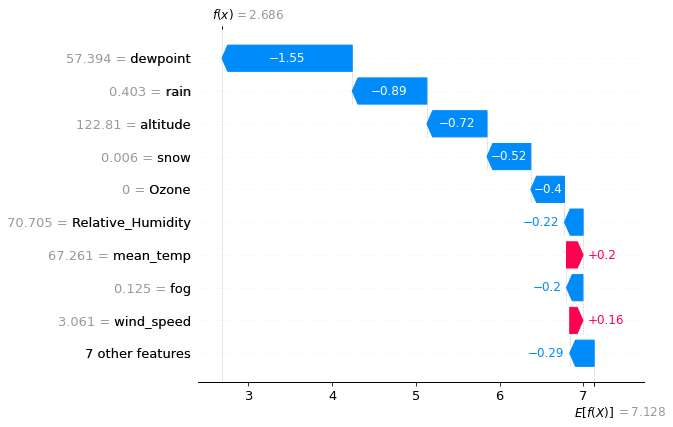

In [95]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[1])

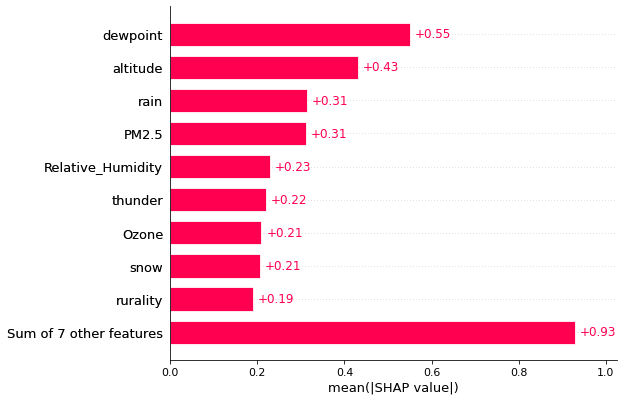

In [96]:
shap.plots.bar(shap_values)

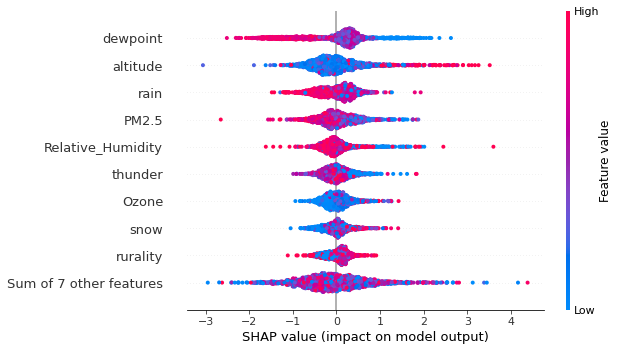

In [97]:
shap.plots.beeswarm(copy.deepcopy(shap_values))

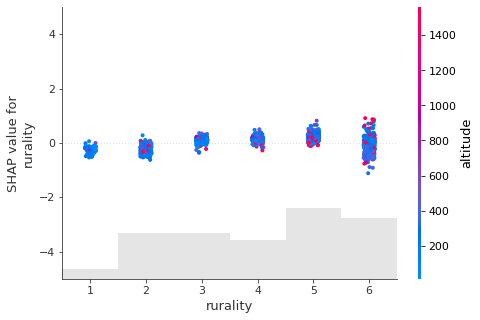

In [98]:
shap.plots.scatter(shap_values[:,"rurality"], color=shap_values[:,"altitude"], ymin = -5, ymax = 5)